In [ ]:
pip install tsai

     |████████████████████████████████| 234 kB 4.2 MB/s 
     |████████████████████████████████| 189 kB 40.6 MB/s 
     |████████████████████████████████| 2.5 MB 30.7 MB/s 
     |████████████████████████████████| 55 kB 3.1 MB/s 
  Attempting uninstall: fastai
    Found existing installation: fastai 1.0.61
    Uninstalling fastai-1.0.61:
      Successfully uninstalled fastai-1.0.61


In [ ]:
pip install optuna

     |████████████████████████████████| 308 kB 4.7 MB/s 
     |████████████████████████████████| 210 kB 35.1 MB/s 
     |████████████████████████████████| 81 kB 6.1 MB/s 
     |████████████████████████████████| 75 kB 4.4 MB/s 
     |████████████████████████████████| 49 kB 5.4 MB/s 
     |████████████████████████████████| 150 kB 44.8 MB/s 
     |████████████████████████████████| 113 kB 51.0 MB/s 
  Created wheel for pyperclip: filename=pyperclip-1.8.2-py3-none-any.whl size=11137 sha256=77bfcd710e9e0173871a64fb7bc37d36359295d5dc7e21ba959f97d279a60a85
  Stored in directory: /root/.cache/pip/wheels/9f/18/84/8f69f8b08169c7bae2dde6bd7daf0c19fca8c8e500ee620a28
Successfully built pyperclip


In [ ]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from sklearn.model_selection import train_test_split
from sklearn.model_selection import StratifiedKFold
from scipy.signal import savgol_filter
from imblearn.under_sampling import RandomUnderSampler 
from imblearn.over_sampling import SVMSMOTE, ADASYN, SMOTE, RandomOverSampler
from sklearn.preprocessing import StandardScaler
from sklearn.decomposition import PCA
from sklearn.ensemble import RandomForestClassifier
from sklearn.metrics import balanced_accuracy_score
from sklearn.svm import SVC
from sklearn.ensemble import RandomForestClassifier
from sklearn.ensemble import AdaBoostClassifier
from sklearn.ensemble import BaggingClassifier
from sklearn.neural_network import MLPClassifier

from sklearn.tree import DecisionTreeClassifier
from sklearn.naive_bayes import GaussianNB
from sklearn.neighbors import KNeighborsClassifier 

from sklearn.base import BaseEstimator
from sklearn.utils import resample
import time
from sklearn import datasets
from sklearn.preprocessing import StandardScaler
from sklearn.pipeline import Pipeline
from sklearn.model_selection import cross_val_score
from sklearn.model_selection import RepeatedStratifiedKFold
from sklearn.model_selection import GridSearchCV
from sklearn.metrics import confusion_matrix
from sklearn.metrics import classification_report
from sklearn.model_selection import cross_validate
from xgboost import XGBClassifier
from scipy.stats import kurtosis
from scipy.stats import skew
from sklearn.cross_decomposition import PLSRegression
from sklearn.model_selection import KFold
from sklearn.metrics import accuracy_score, precision_score, recall_score

In [ ]:
from tsai.all import *

In [ ]:
df = pd.read_csv('pad_2021_dados_rotulados.csv')

In [ ]:
y = df.label
X_raw = df.drop(columns=['index','Unnamed: 0',	'Unnamed: 0.1','NÃºmero de sÃ©rie do instrumento',
       'Temperatura', 'Notas', 'Carimpo de Tempo', 'numero_sus', 'patologia',
       'label'])
X_raw2 = df.groupby('numero_sus',as_index=False).mean().drop(columns=['index','Unnamed: 0',
       'Temperatura', 'Notas', 'numero_sus',
       'label'])
y2 = df.groupby('numero_sus',as_index=False).mean()['label'].values

In [ ]:
df = df_raw[df_raw.patologia.isin(benignos+malignos)].reset_index()
df.loc[df.patologia.isin(benignos),'label'] = 0
df.loc[df.patologia.isin(malignos),'label'] = 1

In [ ]:
y = df.label
X_raw = df.drop(columns=['index','Unnamed: 0',	'Unnamed: 0.1','NÃºmero de sÃ©rie do instrumento',
       'Temperatura', 'Notas', 'Carimpo de Tempo', 'numero_sus', 'patologia',
       'label'])
X_raw2 = df.groupby('numero_sus',as_index=False).mean().drop(columns=['index','Unnamed: 0',
       'Temperatura', 'Notas', 'numero_sus',
       'label'])
y2 = df.groupby('numero_sus',as_index=False).mean()['label'].values

In [ ]:
from scipy.signal import savgol_filter
X = pd.DataFrame(savgol_filter(X_raw, window_length=9, polyorder=2),columns=X_raw.columns.astype(float))
X2 = pd.DataFrame(savgol_filter(X_raw2, window_length=9, polyorder=2),columns=X_raw.columns.astype(float))

In [ ]:
def snv(input_data):
    """
        :snv: A correction technique which is done on each
        individual spectrum, a reference spectrum is not
        required
        :param input_data: Array of spectral data
        :type input_data: DataFrame
        
        :returns: data_snv (ndarray): Scatter corrected spectra
    """
    
    input_data = np.asarray(input_data)
    
    # Define a new array and populate it with the corrected data  
    data_snv = np.zeros_like(input_data)
    for i in range(data_snv.shape[0]):
        # Apply correction
        data_snv[i,:] = (input_data[i,:] - np.mean(input_data[i,:])) / np.std(input_data[i,:])
    
    return data_snv

In [ ]:
def windowing(vec, w, overlap):
    overlap = 1 - overlap
    line = []
    for i in range(0,125,int((w*overlap))):
        v = vec[i:int(i+(w*overlap))]
        line += [np.mean(v),np.std(v),kurtosis(v),skew(v), np.amax(v), np.amin(v)]
  
    return line

In [ ]:
def get_dummy_matrix(labels):

    unique_labels = np.unique(labels)

    #if unique_labels.shape[0] > 0:
    dummy_matrix = np.zeros((unique_labels.shape[0], labels.shape[0]))

    for i in range(0, labels.shape[0]):
        for j in range(0, unique_labels.shape[0]):
            if (labels[i]) == j:
                dummy_matrix[j][i] = 1
            else:
                dummy_matrix[j][i] = 0
    return dummy_matrix

In [ ]:
X = pd.DataFrame(snv(X),columns=X_raw.columns.astype(float))

In [ ]:
bs = 16
nvars = 1
seq_len = 125
c_out = 2
n_epochs = 150

In [ ]:
FCNPlus(3, 2)

FCNPlus(
  (backbone): _FCNBlockPlus(
    (convblock1): ConvBlock(
      (0): Conv1d(3, 128, kernel_size=(7,), stride=(1,), padding=(3,), bias=False)
      (1): BatchNorm1d(128, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (2): ReLU()
    )
    (convblock2): ConvBlock(
      (0): Conv1d(128, 256, kernel_size=(5,), stride=(1,), padding=(2,), bias=False)
      (1): BatchNorm1d(256, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (2): ReLU()
    )
    (convblock3): ConvBlock(
      (0): Conv1d(256, 128, kernel_size=(3,), stride=(1,), padding=(1,), bias=False)
      (1): BatchNorm1d(128, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (2): ReLU()
    )
    (add): Sequential()
  )
  (head): Sequential(
    (0): AdaptiveAvgPool1d(output_size=1)
    (1): Squeeze(dim=-1)
    (2): Linear(in_features=128, out_features=2, bias=True)
  )
)

In [ ]:
X_25 = np.apply_along_axis(windowing,1,X, w=25,overlap=0.5)

In [ ]:
X['id']= df.numero_sus

In [ ]:
numero_sus =  df.groupby('numero_sus',as_index=False).mean()['numero_sus']
y_numero_sus = df.groupby('numero_sus',as_index=False).mean()['label']

In [ ]:
cols = X.drop(columns='id').columns

epoch,train_loss,valid_loss,roc_auc_score,accuracy,balanced_accuracy_score,time
0,0.711728,0.678785,0.402469,0.714286,0.500000,00:01
1,0.706419,0.672562,0.634568,0.714286,0.500000,00:00
2,0.707700,0.672214,0.644444,0.714286,0.500000,00:00
3,0.702718,0.673825,0.587654,0.714286,0.500000,00:00
4,0.702350,0.675729,0.546914,0.714286,0.500000,00:00
5,0.699101,0.676666,0.511111,0.714286,0.500000,00:00
6,0.700597,0.680331,0.500000,0.698413,0.488889,00:00
7,0.696987,0.685300,0.485185,0.603175,0.455556,00:00
8,0.695571,0.689721,0.476543,0.523810,0.466667,00:00
9,0.691302,0.693396,0.470370,0.476190,0.500000,00:00


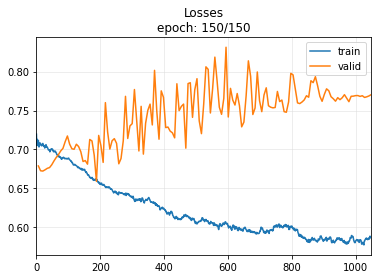

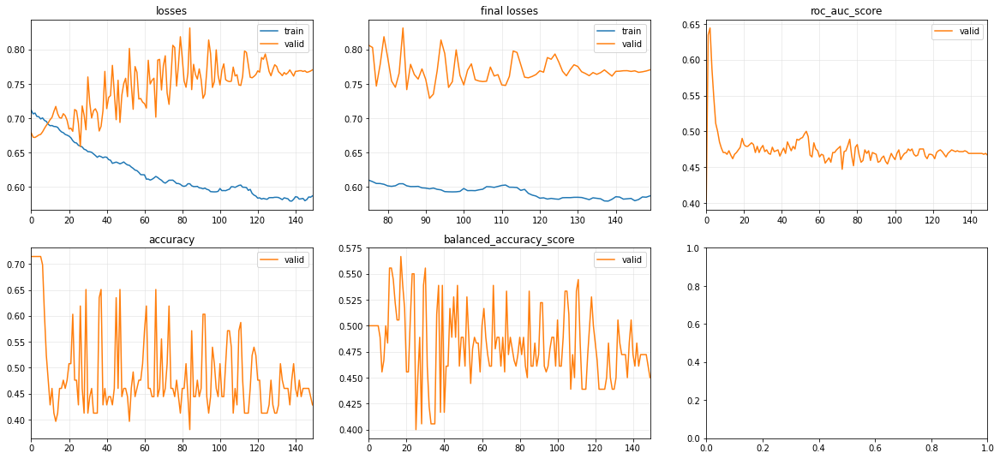


Elapsed time: 51.312058448791504


epoch,train_loss,valid_loss,roc_auc_score,accuracy,balanced_accuracy_score,time
0,0.709890,0.750741,0.875309,0.285714,0.500000,00:00
1,0.707741,0.746023,0.866667,0.285714,0.500000,00:00
2,0.701581,0.748711,0.597531,0.285714,0.500000,00:00
3,0.706383,0.749384,0.555556,0.285714,0.500000,00:00
4,0.710600,0.747349,0.590123,0.285714,0.500000,00:00
5,0.708610,0.744338,0.674074,0.285714,0.500000,00:00
6,0.706797,0.741238,0.713580,0.285714,0.500000,00:00
7,0.707653,0.736226,0.732099,0.285714,0.500000,00:00
8,0.708207,0.732581,0.751852,0.285714,0.500000,00:00
9,0.705773,0.727850,0.767901,0.301587,0.511111,00:00


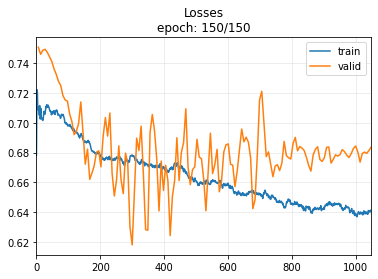

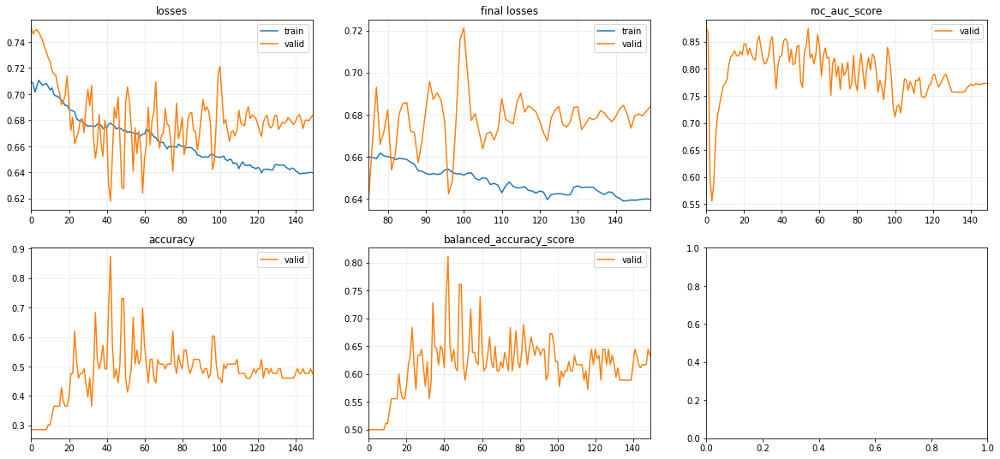


Elapsed time: 59.32466268539429


epoch,train_loss,valid_loss,roc_auc_score,accuracy,balanced_accuracy_score,time
0,0.690923,0.700854,0.820833,0.253968,0.510417,00:00
1,0.696685,0.721935,0.865278,0.253968,0.510417,00:00
2,0.691662,0.720484,0.723611,0.253968,0.510417,00:00
3,0.694291,0.717008,0.609722,0.253968,0.510417,00:00
4,0.695121,0.712124,0.573611,0.253968,0.510417,00:00
5,0.693235,0.708230,0.565278,0.253968,0.510417,00:00
6,0.689553,0.703768,0.543056,0.285714,0.508333,00:00
7,0.689180,0.701533,0.538889,0.349206,0.504167,00:00
8,0.689120,0.700632,0.536111,0.396825,0.535417,00:00
9,0.685402,0.699133,0.537500,0.428571,0.556250,00:00


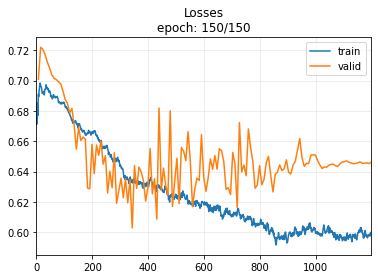

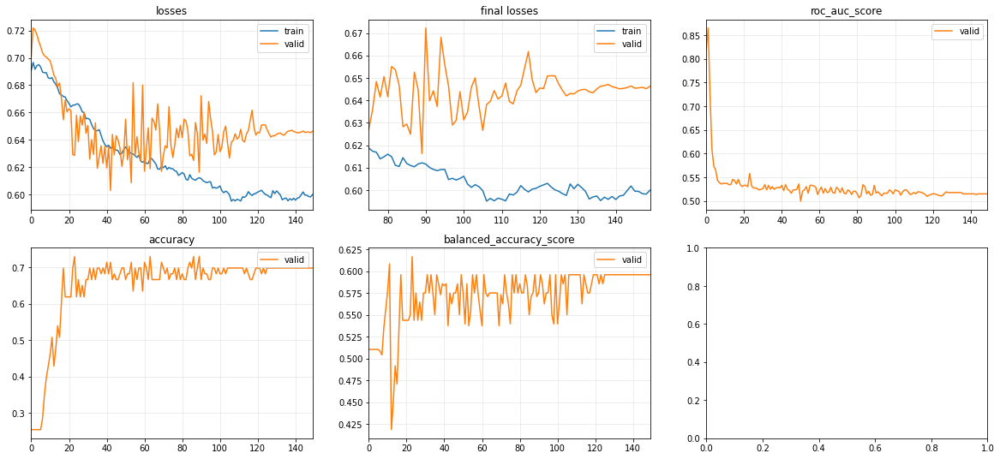


Elapsed time: 59.76516509056091


epoch,train_loss,valid_loss,roc_auc_score,accuracy,balanced_accuracy_score,time
0,0.708648,0.705398,0.670833,0.238095,0.500000,00:00
1,0.703989,0.682360,0.648611,0.761905,0.500000,00:00
2,0.707954,0.672076,0.625000,0.761905,0.500000,00:00
3,0.710294,0.667772,0.555556,0.761905,0.500000,00:00
4,0.709074,0.666997,0.529167,0.761905,0.500000,00:00
5,0.707021,0.668571,0.511111,0.761905,0.500000,00:00
6,0.702688,0.672510,0.490278,0.761905,0.500000,00:00
7,0.699479,0.677311,0.483333,0.730159,0.479167,00:00
8,0.697567,0.683155,0.479167,0.682540,0.493750,00:00
9,0.694668,0.688216,0.479167,0.587302,0.454167,00:00


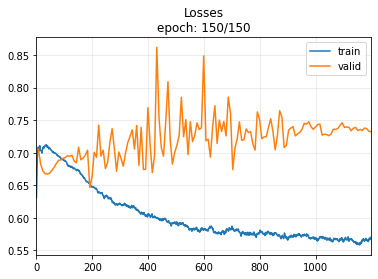

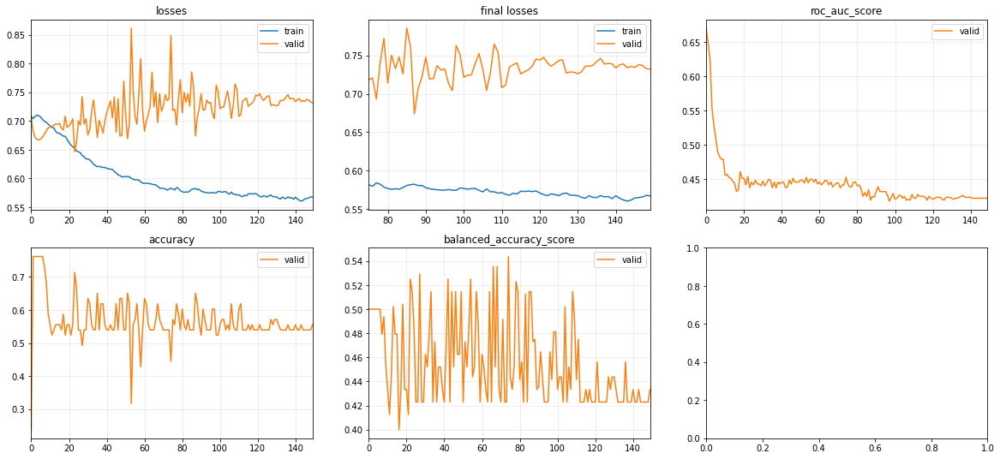


Elapsed time: 61.14318895339966


epoch,train_loss,valid_loss,roc_auc_score,accuracy,balanced_accuracy_score,time
0,0.720897,0.788903,0.389630,0.250000,0.500000,00:00
1,0.722301,0.766403,0.634074,0.250000,0.500000,00:00
2,0.715272,0.779457,0.647407,0.250000,0.500000,00:00
3,0.719848,0.793570,0.654815,0.250000,0.500000,00:00
4,0.716018,0.795013,0.678519,0.250000,0.500000,00:00
5,0.713077,0.790719,0.740741,0.250000,0.500000,00:00
6,0.711852,0.780809,0.749630,0.250000,0.500000,00:00
7,0.712266,0.770181,0.768889,0.250000,0.500000,00:00
8,0.717056,0.758813,0.779259,0.250000,0.500000,00:00
9,0.716769,0.750109,0.785185,0.250000,0.500000,00:00


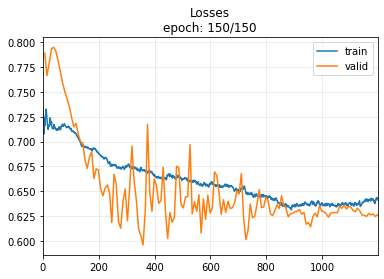

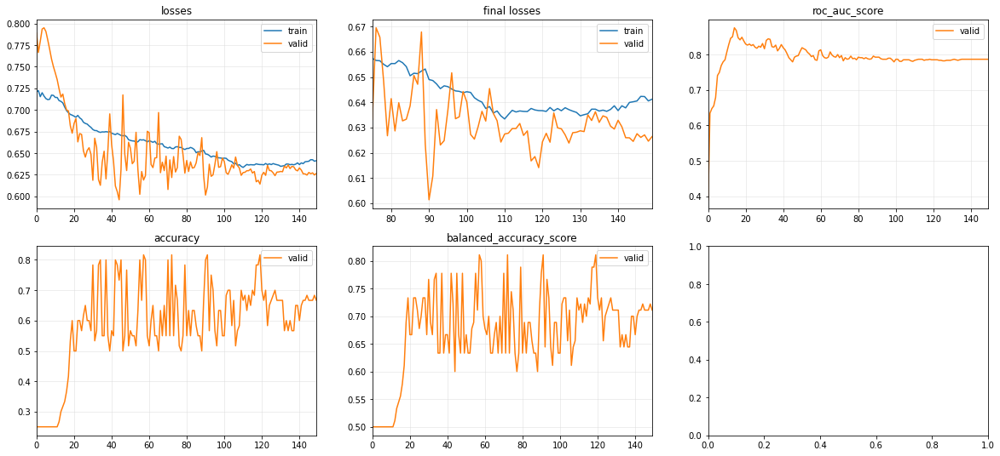


Elapsed time: 65.24086570739746


bacc: 0.5647222222222222 +- 0.10726539142487135, acc: 0.5650793650793651 +- 0.10461750510021638, pr: 0.8211351677377758 +- 0.11963407163632638, rec: 0.5494444444444444 +- 0.18973991295428919


In [ ]:
kf = StratifiedKFold(n_splits=5, shuffle=False)

bacc_per_fold = []
acc_per_fold = []
pre_per_fold = []
rec_per_fold = []
cm = []
hp = []

for train_index, test_index in kf.split(numero_sus, y_numero_sus):
    index_train_sus, index_test_sus = X.id.isin(numero_sus[train_index]), X.id.isin(numero_sus[test_index])
    X_train, y_train = X.loc[index_train_sus,cols], y[index_train_sus]
    X_test, y_test = X.loc[index_test_sus,cols], y[index_test_sus]

    rus = RandomUnderSampler(random_state=42)
    X_train, y_train = rus.fit_resample(X_train, y_train)
    
    tfms  = [None, [Categorize()]]
    X_3d_new, y_new, splits = combine_split_data([to3d(X_train),to3d(X_test)],[y_train,y_test])
    dsets = TSDatasets(X_3d_new, y_new.astype(int), tfms=tfms, splits=splits, inplace=True)
    dsets = TSDataLoaders.from_dsets(dsets.train, dsets.valid, bs=bs, batch_tfms=TSStandardize())
  
    model = model =  FCNPlus(nvars, c_out,fc_dropout=0.3)
    learn = Learner(dsets, model, loss_func=LabelSmoothingCrossEntropyFlat(), metrics=[RocAucBinary(), accuracy, BalancedAccuracy()],  cbs=ShowGraphCallback2())
    start = time.time()
    learn.fit_one_cycle(n_epochs, lr_max=1e-4)
    print('\nElapsed time:', time.time() - start)

    X_test = X_3d_new[splits[1]]
    y_test = y_new[splits[1]]

    test_probas, test_targets, test_preds = learn.get_X_preds(X_test, with_decoded=True)
    pred = [int(char) for char in test_preds if char == '1' or char == '0']

    cm.append(confusion_matrix(y_test, pred))
    bacc_per_fold.append(balanced_accuracy_score(y_test, pred))
    acc_per_fold.append(accuracy_score(y_test, pred))
    pre_per_fold.append(precision_score(y_test, pred))
    rec_per_fold.append(recall_score(y_test, pred))

print("bacc: {} +- {}, acc: {} +- {}, pr: {} +- {}, rec: {} +- {}".format(np.mean(bacc_per_fold), np.std(bacc_per_fold),np.mean(acc_per_fold), np.std(acc_per_fold),
                                                              np.mean(pre_per_fold), np.std(pre_per_fold),
                                                              np.mean(rec_per_fold), np.std(rec_per_fold)))

epoch,train_loss,valid_loss,roc_auc_score,accuracy,balanced_accuracy_score,time
0,0.689103,0.659491,0.495062,0.714286,0.500000,00:02
1,0.691860,0.669694,0.493827,0.666667,0.466667,00:00
2,0.692329,0.674892,0.467901,0.666667,0.466667,00:00
3,0.690634,0.677719,0.470370,0.666667,0.466667,00:00
4,0.692160,0.679610,0.476543,0.666667,0.466667,00:00
5,0.693893,0.680441,0.488889,0.666667,0.466667,00:00
6,0.692131,0.680782,0.488889,0.634921,0.444444,00:00
7,0.692909,0.681209,0.496296,0.619048,0.433333,00:00
8,0.695780,0.681704,0.488889,0.619048,0.433333,00:00
9,0.694819,0.682887,0.482716,0.619048,0.433333,00:00


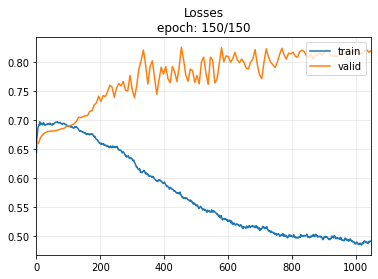

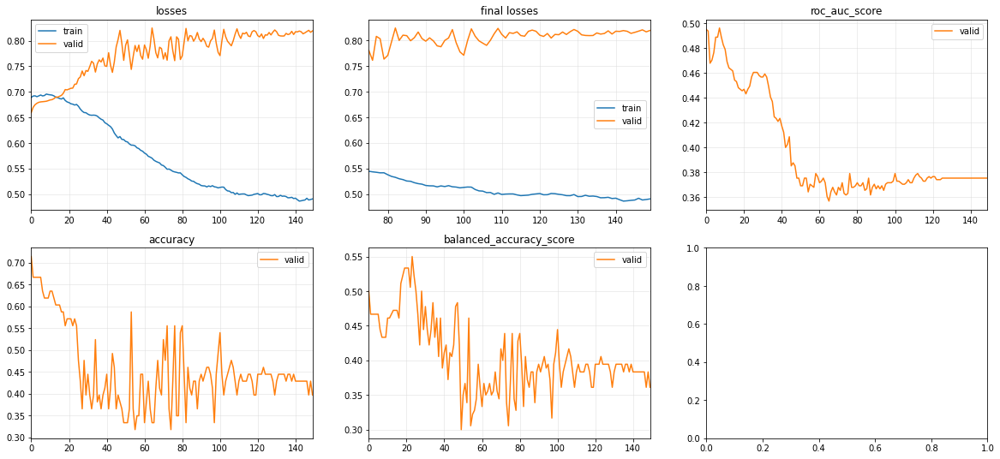


Elapsed time: 78.55921936035156


epoch,train_loss,valid_loss,roc_auc_score,accuracy,balanced_accuracy_score,time
0,0.701167,0.681079,0.316049,0.714286,0.500000,00:00
1,0.698525,0.704413,0.328395,0.269841,0.472222,00:00
2,0.703561,0.723065,0.325926,0.285714,0.500000,00:00
3,0.705320,0.734140,0.317284,0.285714,0.500000,00:00
4,0.704918,0.738886,0.306173,0.285714,0.500000,00:00
5,0.705171,0.740258,0.301235,0.285714,0.500000,00:00
6,0.706431,0.739914,0.325926,0.285714,0.500000,00:00
7,0.701922,0.737867,0.343210,0.285714,0.500000,00:00
8,0.703585,0.736643,0.360494,0.285714,0.500000,00:00
9,0.701740,0.734424,0.375309,0.285714,0.500000,00:00


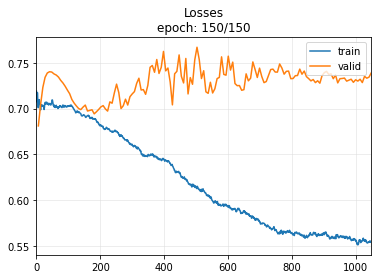

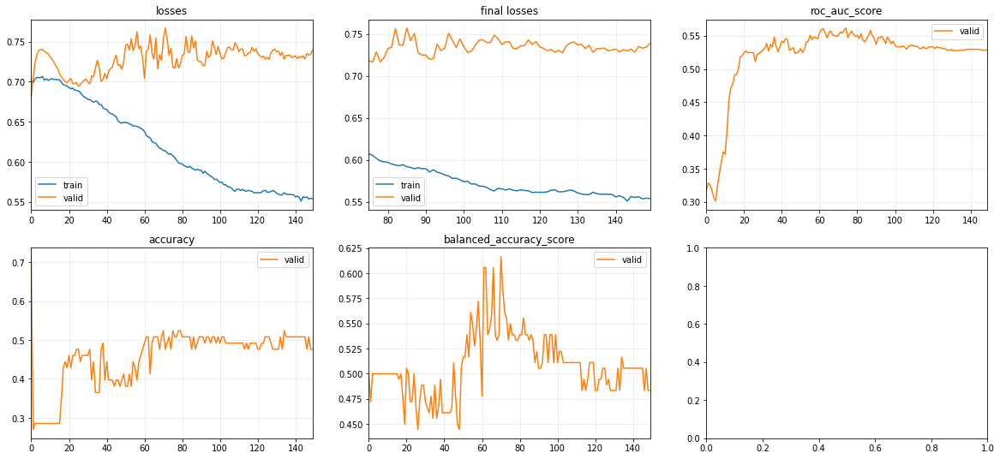


Elapsed time: 76.83261394500732


epoch,train_loss,valid_loss,roc_auc_score,accuracy,balanced_accuracy_score,time
0,0.698342,0.792775,0.552778,0.238095,0.500000,00:00
1,0.707403,0.745118,0.648611,0.238095,0.500000,00:00
2,0.705807,0.732916,0.693056,0.238095,0.500000,00:00
3,0.709601,0.729358,0.716667,0.238095,0.500000,00:00
4,0.707411,0.726942,0.736111,0.238095,0.500000,00:00
5,0.702955,0.725063,0.754167,0.238095,0.500000,00:00
6,0.703090,0.724054,0.750000,0.238095,0.500000,00:00
7,0.702221,0.721455,0.747222,0.238095,0.500000,00:00
8,0.703932,0.718163,0.783333,0.238095,0.500000,00:00
9,0.704382,0.715775,0.784722,0.238095,0.500000,00:00


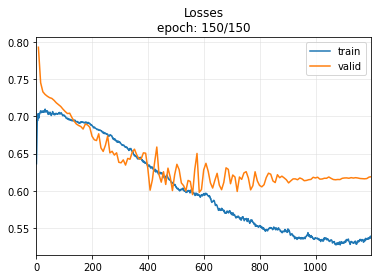

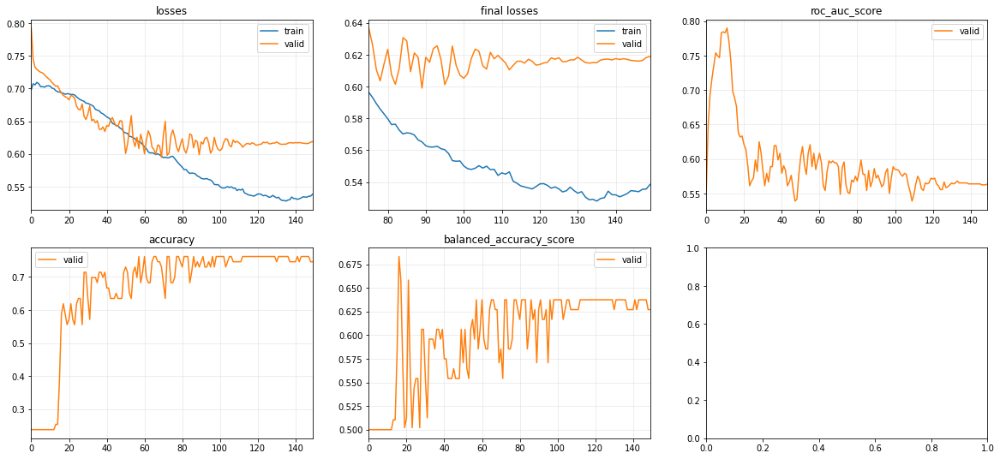


Elapsed time: 79.20682406425476


epoch,train_loss,valid_loss,roc_auc_score,accuracy,balanced_accuracy_score,time
0,0.698005,0.679977,0.388889,0.761905,0.500000,00:00
1,0.697805,0.665766,0.433333,0.761905,0.500000,00:00
2,0.697580,0.657176,0.409722,0.761905,0.500000,00:00
3,0.700302,0.653497,0.395833,0.761905,0.500000,00:00
4,0.700577,0.652249,0.379167,0.761905,0.500000,00:00
5,0.701489,0.652503,0.347222,0.761905,0.500000,00:00
6,0.702314,0.653523,0.330556,0.761905,0.500000,00:00
7,0.700254,0.655246,0.306944,0.761905,0.500000,00:00
8,0.698518,0.656727,0.306944,0.761905,0.500000,00:00
9,0.696076,0.658939,0.312500,0.761905,0.500000,00:00


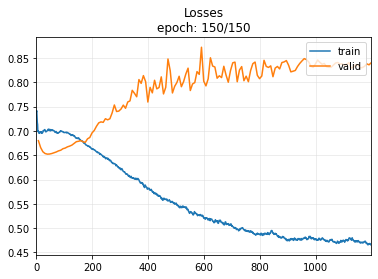

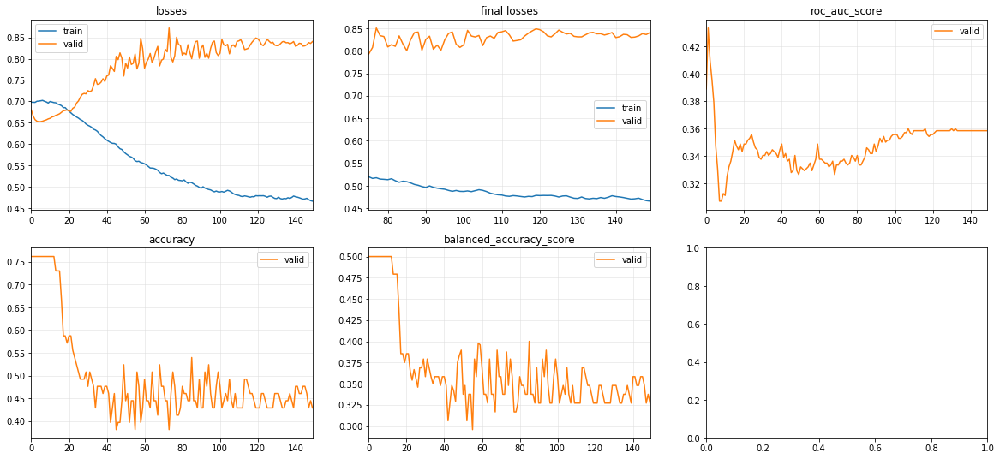


Elapsed time: 82.07491755485535


epoch,train_loss,valid_loss,roc_auc_score,accuracy,balanced_accuracy_score,time
0,0.703840,0.654950,0.749630,0.750000,0.500000,00:00
1,0.708913,0.677829,0.705185,0.750000,0.500000,00:00
2,0.702284,0.686683,0.722963,0.733333,0.688889,00:00
3,0.700991,0.690576,0.717037,0.533333,0.622222,00:00
4,0.700343,0.691853,0.724444,0.466667,0.600000,00:00
5,0.696863,0.692699,0.740741,0.416667,0.588889,00:00
6,0.699095,0.693987,0.746667,0.316667,0.544444,00:00
7,0.698326,0.695010,0.737778,0.316667,0.544444,00:00
8,0.697999,0.696137,0.749630,0.316667,0.544444,00:00
9,0.698057,0.696906,0.758519,0.316667,0.544444,00:00


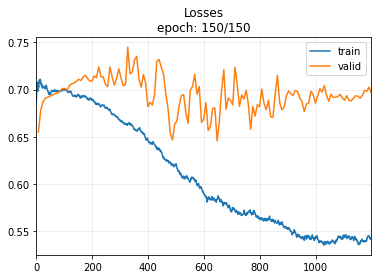

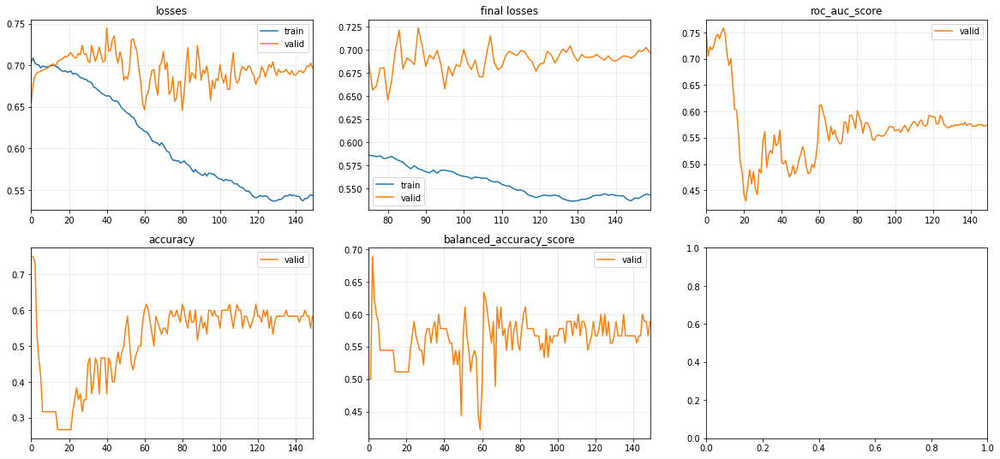


Elapsed time: 82.85058355331421


bacc: 0.47750000000000004 +- 0.11915387784263788, acc: 0.5261904761904762 +- 0.1267756224713996, pr: 0.7192910685805423 +- 0.08460849399959824, rec: 0.5727777777777778 +- 0.14807561881987488


In [ ]:
kf = StratifiedKFold(n_splits=5, shuffle=False)

bacc_per_fold = []
acc_per_fold = []
pre_per_fold = []
rec_per_fold = []
cm = []
hp = []

for train_index, test_index in kf.split(numero_sus, y_numero_sus):
    index_train_sus, index_test_sus = X.id.isin(numero_sus[train_index]), X.id.isin(numero_sus[test_index])
    X_train, y_train = X_25[index_train_sus], y[index_train_sus]
    X_test, y_test = X_25[index_test_sus], y[index_test_sus]

    rus = RandomUnderSampler(random_state=42)
    X_train, y_train = rus.fit_resample(X_train, y_train)
    
    tfms  = [None, [Categorize()]]
    X_3d_new, y_new, splits = combine_split_data([to3d(X_train),to3d(X_test)],[y_train,y_test])
    dsets = TSDatasets(X_3d_new, y_new.astype(int), tfms=tfms, splits=splits, inplace=True)
    dsets = TSDataLoaders.from_dsets(dsets.train, dsets.valid, bs=bs, batch_tfms=TSStandardize())
  
    model = model =  FCNPlus(nvars, c_out,fc_dropout=0.3)
    learn = Learner(dsets, model, loss_func=LabelSmoothingCrossEntropyFlat(), metrics=[RocAucBinary(), accuracy, BalancedAccuracy()],  cbs=ShowGraphCallback2())
    start = time.time()
    learn.fit_one_cycle(n_epochs, lr_max=1e-4)
    print('\nElapsed time:', time.time() - start)

    X_test = X_3d_new[splits[1]]
    y_test = y_new[splits[1]]

    test_probas, test_targets, test_preds = learn.get_X_preds(X_test, with_decoded=True)
    pred = [int(char) for char in test_preds if char == '1' or char == '0']

    cm.append(confusion_matrix(y_test, pred))
    bacc_per_fold.append(balanced_accuracy_score(y_test, pred))
    acc_per_fold.append(accuracy_score(y_test, pred))
    pre_per_fold.append(precision_score(y_test, pred))
    rec_per_fold.append(recall_score(y_test, pred))

print("bacc: {} +- {}, acc: {} +- {}, pr: {} +- {}, rec: {} +- {}".format(np.mean(bacc_per_fold), np.std(bacc_per_fold),np.mean(acc_per_fold), np.std(acc_per_fold),
                                                              np.mean(pre_per_fold), np.std(pre_per_fold),
                                                              np.mean(rec_per_fold), np.std(rec_per_fold)))

In [ ]:
print('list cm: {} \n cm: {}'.format(cm, sum(cm)))
print('hiperparametros: {}'.format(hp))
print("bacc: {}, acc: {}, pr: {}, rec: {}".format(bacc_per_fold,acc_per_fold,pre_per_fold,rec_per_fold))

list cm: [array([[ 5, 13],
       [25, 20]]), array([[ 9,  9],
       [24, 21]]), array([[ 6,  9],
       [ 7, 41]]), array([[ 2, 13],
       [23, 25]]), array([[ 9,  6],
       [19, 26]])] 
 cm: [[ 31  50]
 [ 98 133]]
hiperparametros: []
bacc: [0.3611111111111111, 0.48333333333333334, 0.6270833333333333, 0.32708333333333334, 0.5888888888888888], acc: [0.3968253968253968, 0.47619047619047616, 0.746031746031746, 0.42857142857142855, 0.5833333333333334], pr: [0.6060606060606061, 0.7, 0.82, 0.6578947368421053, 0.8125], rec: [0.4444444444444444, 0.4666666666666667, 0.8541666666666666, 0.5208333333333334, 0.5777777777777777]


In [ ]:
from imblearn.over_sampling import SMOTE

epoch,train_loss,valid_loss,roc_auc_score,accuracy,balanced_accuracy_score,time
0,0.692278,0.730575,0.503704,0.285714,0.500000,00:00
1,0.699943,0.732790,0.485185,0.285714,0.500000,00:01
2,0.700437,0.731151,0.487654,0.285714,0.500000,00:00
3,0.703260,0.728322,0.504938,0.285714,0.500000,00:00
4,0.700636,0.725983,0.482716,0.285714,0.500000,00:00
5,0.702295,0.723783,0.475309,0.285714,0.500000,00:00
6,0.699871,0.720130,0.458025,0.285714,0.500000,00:00
7,0.695492,0.715802,0.444444,0.285714,0.500000,00:00
8,0.695115,0.715634,0.443210,0.285714,0.500000,00:00
9,0.689165,0.714348,0.440741,0.317460,0.488889,00:00


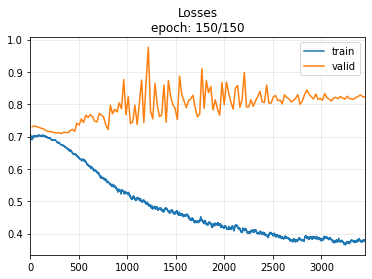

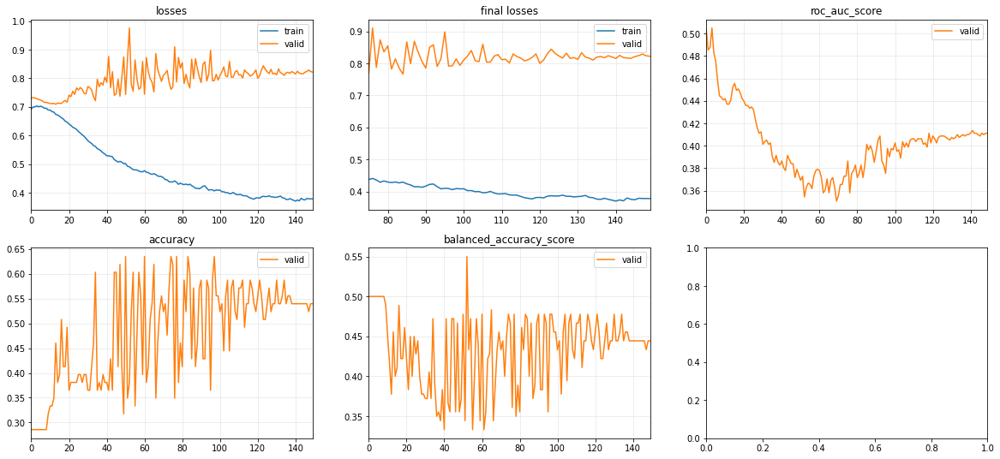


Elapsed time: 115.97564768791199


epoch,train_loss,valid_loss,roc_auc_score,accuracy,balanced_accuracy_score,time
0,0.721754,0.766402,0.324691,0.285714,0.500000,00:00
1,0.720385,0.773979,0.383951,0.285714,0.500000,00:00
2,0.720496,0.769821,0.459259,0.285714,0.500000,00:00
3,0.712015,0.763372,0.472840,0.285714,0.500000,00:00
4,0.713984,0.756309,0.470370,0.285714,0.500000,00:00
5,0.713400,0.748004,0.496296,0.285714,0.500000,00:00
6,0.708823,0.740536,0.513580,0.285714,0.500000,00:00
7,0.702626,0.735667,0.519753,0.285714,0.500000,00:00
8,0.700231,0.727569,0.528395,0.285714,0.500000,00:00
9,0.697692,0.720259,0.527160,0.285714,0.500000,00:00


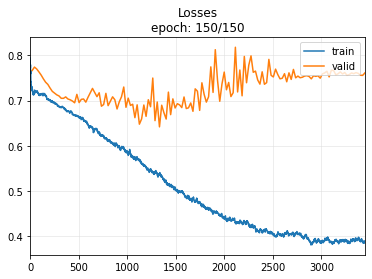

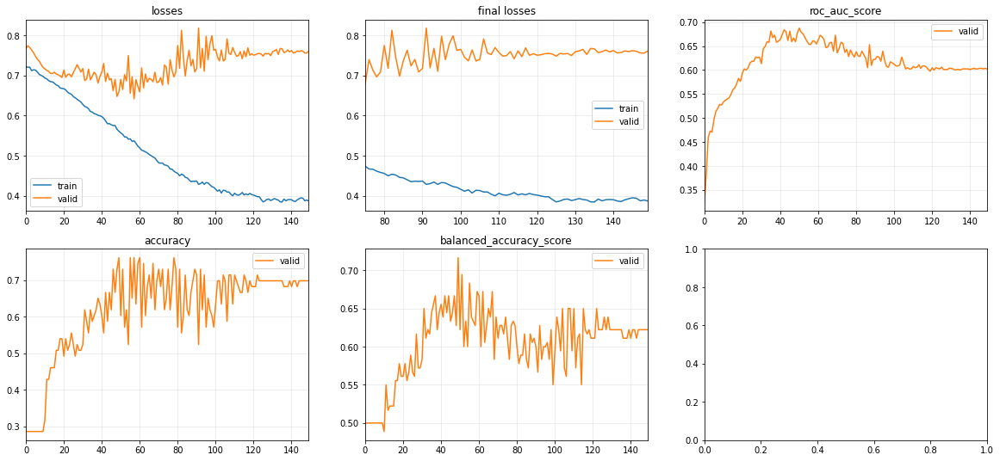


Elapsed time: 114.92015051841736


epoch,train_loss,valid_loss,roc_auc_score,accuracy,balanced_accuracy_score,time
0,0.715566,0.778069,0.386111,0.238095,0.500000,00:00
1,0.707074,0.784096,0.452778,0.238095,0.500000,00:00
2,0.710787,0.779438,0.529167,0.238095,0.500000,00:00
3,0.713748,0.773562,0.606944,0.238095,0.500000,00:00
4,0.711064,0.767475,0.625000,0.238095,0.500000,00:00
5,0.708484,0.759103,0.659722,0.238095,0.500000,00:00
6,0.706928,0.749602,0.720833,0.238095,0.500000,00:00
7,0.703957,0.739559,0.769444,0.238095,0.500000,00:00
8,0.703485,0.730026,0.790278,0.238095,0.500000,00:00
9,0.701138,0.715727,0.804167,0.238095,0.500000,00:00


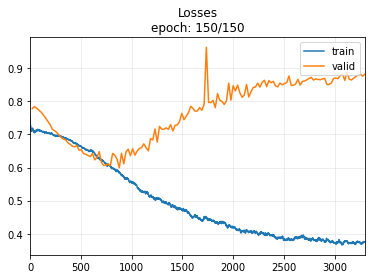

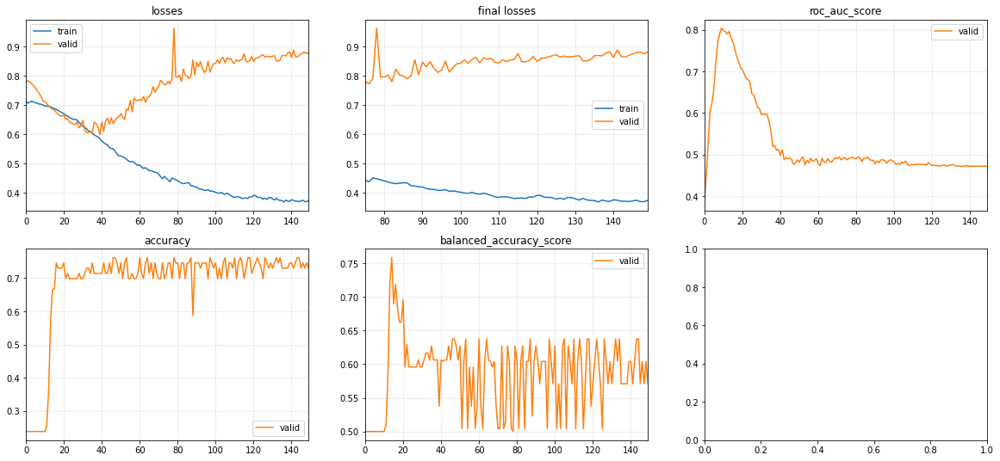


Elapsed time: 115.5323555469513


epoch,train_loss,valid_loss,roc_auc_score,accuracy,balanced_accuracy_score,time
0,0.694328,0.676059,0.405556,0.761905,0.500000,00:00
1,0.702484,0.664690,0.376389,0.761905,0.500000,00:00
2,0.702893,0.663623,0.323611,0.761905,0.500000,00:00
3,0.697892,0.666798,0.308333,0.761905,0.500000,00:00
4,0.697370,0.667518,0.325000,0.761905,0.500000,00:00
5,0.693580,0.669510,0.326389,0.761905,0.500000,00:00
6,0.691893,0.671022,0.326389,0.730159,0.479167,00:00
7,0.688826,0.673296,0.334722,0.730159,0.479167,00:00
8,0.684955,0.676879,0.336111,0.714286,0.468750,00:00
9,0.682444,0.676373,0.338889,0.698413,0.458333,00:00


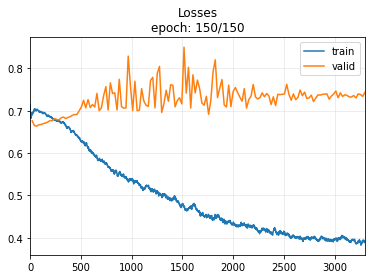

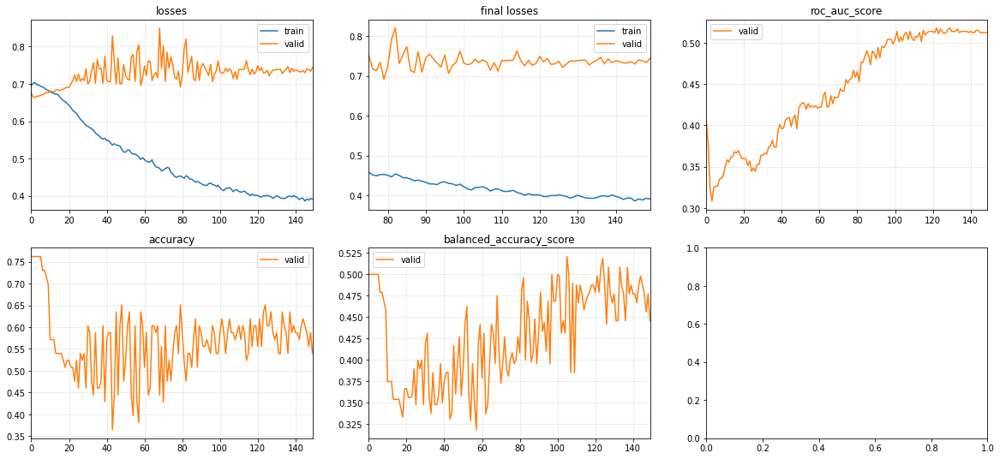


Elapsed time: 119.23176431655884


epoch,train_loss,valid_loss,roc_auc_score,accuracy,balanced_accuracy_score,time
0,0.699427,0.672120,0.348148,0.750000,0.500000,00:00
1,0.700645,0.673389,0.376296,0.750000,0.500000,00:00
2,0.702708,0.675126,0.404444,0.750000,0.500000,00:00
3,0.700874,0.675964,0.475556,0.750000,0.500000,00:00
4,0.698556,0.677087,0.565926,0.750000,0.500000,00:00
5,0.696480,0.679630,0.579259,0.750000,0.500000,00:00
6,0.696874,0.681006,0.672593,0.750000,0.500000,00:00
7,0.697628,0.681597,0.743704,0.750000,0.500000,00:00
8,0.695888,0.685279,0.758519,0.666667,0.711111,00:00
9,0.695055,0.684372,0.817778,0.633333,0.688889,00:00


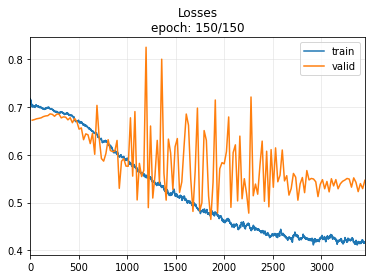

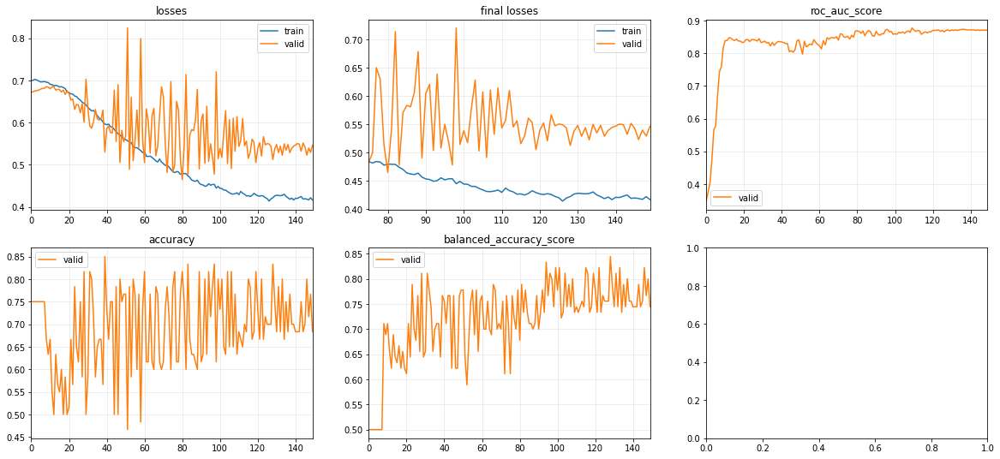


Elapsed time: 133.64847326278687


bacc: 0.5655555555555555 +- 0.11335035275258656, acc: 0.6382539682539683 +- 0.08189061031921188, pr: 0.7843840716131079 +- 0.08431932353860468, rec: 0.7177777777777778 +- 0.10181379760482394


In [ ]:
kf = StratifiedKFold(n_splits=5, shuffle=False)

bacc_per_fold = []
acc_per_fold = []
pre_per_fold = []
rec_per_fold = []
cm = []
hp = []

for train_index, test_index in kf.split(numero_sus, y_numero_sus):
    index_train_sus, index_test_sus = X.id.isin(numero_sus[train_index]), X.id.isin(numero_sus[test_index])
    X_train, y_train = X_25[index_train_sus], y[index_train_sus]
    X_test, y_test = X_25[index_test_sus], y[index_test_sus]

    rus = SMOTE(random_state=42)
    X_train, y_train = rus.fit_resample(X_train, y_train)
    
    tfms  = [None, [Categorize()]]
    X_3d_new, y_new, splits = combine_split_data([to3d(X_train),to3d(X_test)],[y_train,y_test])
    dsets = TSDatasets(X_3d_new, y_new.astype(int), tfms=tfms, splits=splits, inplace=True)
    dsets = TSDataLoaders.from_dsets(dsets.train, dsets.valid, bs=bs, batch_tfms=TSStandardize())
  
    model = model =  FCNPlus(nvars, c_out,fc_dropout=0.3)
    learn = Learner(dsets, model, loss_func=LabelSmoothingCrossEntropyFlat(), metrics=[RocAucBinary(), accuracy, BalancedAccuracy()],  cbs=ShowGraphCallback2())
    start = time.time()
    learn.fit_one_cycle(n_epochs, lr_max=1e-4)
    print('\nElapsed time:', time.time() - start)

    X_test = X_3d_new[splits[1]]
    y_test = y_new[splits[1]]

    test_probas, test_targets, test_preds = learn.get_X_preds(X_test, with_decoded=True)
    pred = [int(char) for char in test_preds if char == '1' or char == '0']

    cm.append(confusion_matrix(y_test, pred))
    bacc_per_fold.append(balanced_accuracy_score(y_test, pred))
    acc_per_fold.append(accuracy_score(y_test, pred))
    pre_per_fold.append(precision_score(y_test, pred))
    rec_per_fold.append(recall_score(y_test, pred))

print("bacc: {} +- {}, acc: {} +- {}, pr: {} +- {}, rec: {} +- {}".format(np.mean(bacc_per_fold), np.std(bacc_per_fold),np.mean(acc_per_fold), np.std(acc_per_fold),
                                                              np.mean(pre_per_fold), np.std(pre_per_fold),
                                                              np.mean(rec_per_fold), np.std(rec_per_fold)))

In [ ]:
print('list cm: {} \n cm: {}'.format(cm, sum(cm)))
print('hiperparametros: {}'.format(hp))
print("bacc: {}, acc: {}, pr: {}, rec: {}".format(bacc_per_fold,acc_per_fold,pre_per_fold,rec_per_fold))

list cm: [array([[ 4, 14],
       [15, 30]]), array([[ 8, 10],
       [ 9, 36]]), array([[ 4, 11],
       [ 6, 42]]), array([[ 4, 11],
       [18, 30]]), array([[13,  2],
       [17, 28]])] 
 cm: [[ 33  48]
 [ 65 166]]
hiperparametros: []
bacc: [0.4444444444444444, 0.6222222222222222, 0.5708333333333333, 0.4458333333333333, 0.7444444444444445], acc: [0.5396825396825397, 0.6984126984126984, 0.7301587301587301, 0.5396825396825397, 0.6833333333333333], pr: [0.6818181818181818, 0.782608695652174, 0.7924528301886793, 0.7317073170731707, 0.9333333333333333], rec: [0.6666666666666666, 0.8, 0.875, 0.625, 0.6222222222222222]


epoch,train_loss,valid_loss,roc_auc_score,accuracy,balanced_accuracy_score,time
0,0.692933,0.717034,0.591358,0.285714,0.500000,00:00
1,0.690955,0.700148,0.593827,0.333333,0.533333,00:00
2,0.688763,0.693467,0.503704,0.460317,0.522222,00:00
3,0.685313,0.696095,0.471605,0.476190,0.566667,00:00
4,0.681896,0.697141,0.445679,0.428571,0.483333,00:00
5,0.677954,0.698322,0.448148,0.444444,0.494444,00:00
6,0.673522,0.703131,0.456790,0.460317,0.538889,00:00
7,0.668134,0.706214,0.458025,0.460317,0.538889,00:00
8,0.661904,0.709867,0.456790,0.428571,0.483333,00:00
9,0.657602,0.702796,0.460494,0.428571,0.416667,00:00


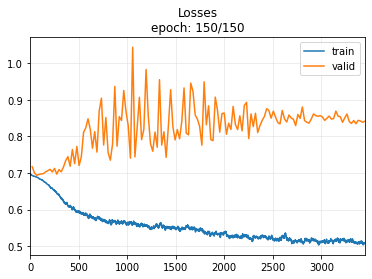

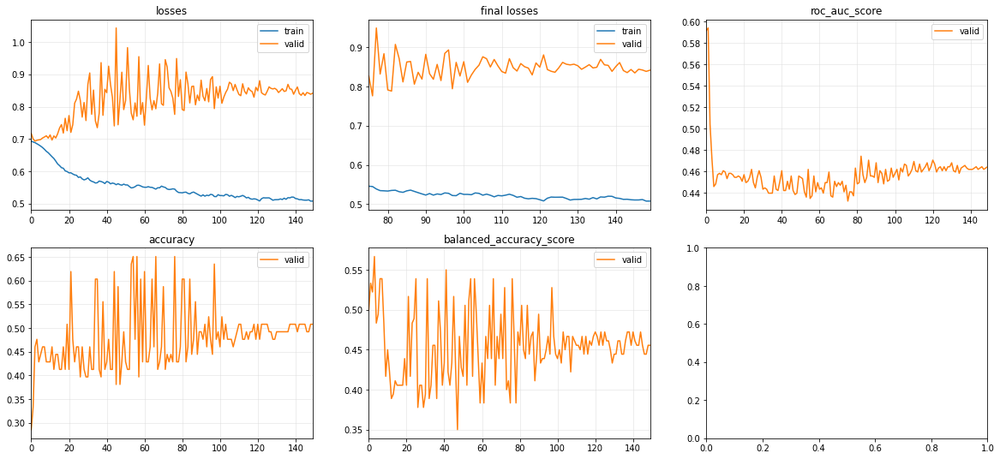


Elapsed time: 79.00075459480286


epoch,train_loss,valid_loss,roc_auc_score,accuracy,balanced_accuracy_score,time
0,0.698055,0.648699,0.781481,0.714286,0.500000,00:00
1,0.695716,0.653943,0.844444,0.714286,0.500000,00:00
2,0.693347,0.658336,0.843210,0.714286,0.500000,00:00
3,0.690994,0.660687,0.859259,0.793651,0.638889,00:00
4,0.688725,0.663626,0.855556,0.841270,0.838889,00:00
5,0.686086,0.670106,0.856790,0.650794,0.705556,00:00
6,0.683631,0.670036,0.855556,0.666667,0.766667,00:00
7,0.681573,0.672000,0.856790,0.539683,0.677778,00:00
8,0.679807,0.671435,0.856790,0.523810,0.666667,00:00
9,0.677557,0.664978,0.855556,0.571429,0.700000,00:00


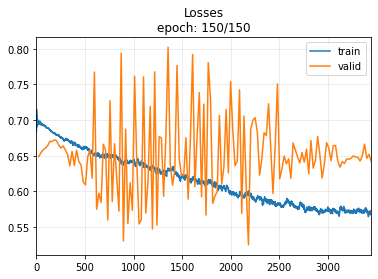

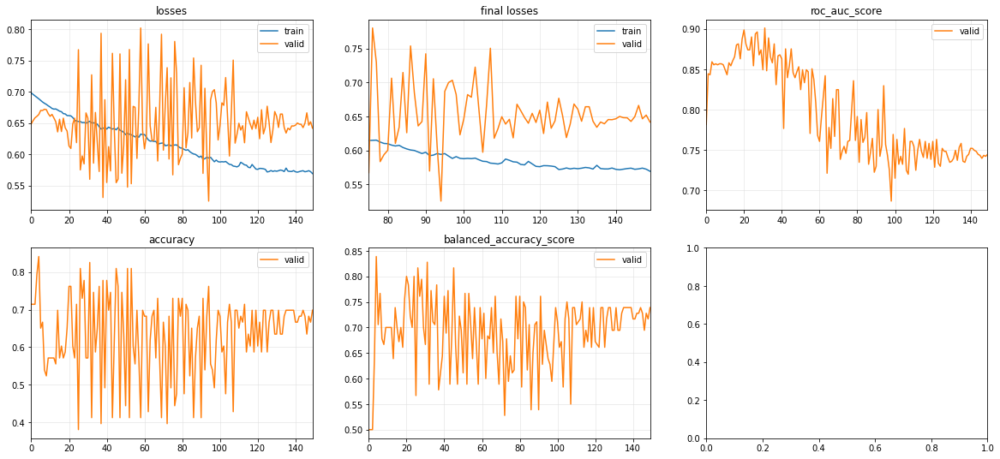


Elapsed time: 83.36564755439758


epoch,train_loss,valid_loss,roc_auc_score,accuracy,balanced_accuracy_score,time
0,0.690934,0.727998,0.798611,0.238095,0.500000,00:00
1,0.689757,0.715376,0.683333,0.253968,0.510417,00:00
2,0.688094,0.698312,0.641667,0.301587,0.495833,00:00
3,0.686052,0.693912,0.640278,0.492063,0.597917,00:00
4,0.684134,0.690544,0.623611,0.555556,0.639583,00:00
5,0.682062,0.684429,0.612500,0.634921,0.622917,00:00
6,0.679249,0.672969,0.622222,0.650794,0.564583,00:00
7,0.676135,0.675540,0.598611,0.619048,0.543750,00:00
8,0.673771,0.665440,0.593056,0.650794,0.564583,00:00
9,0.669755,0.662317,0.556944,0.650794,0.564583,00:00


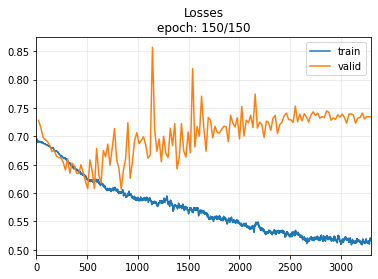

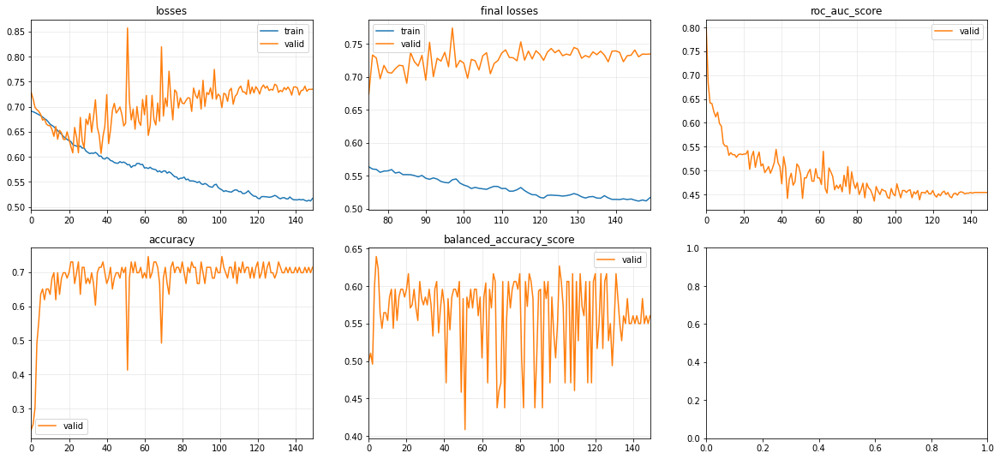


Elapsed time: 85.58053612709045


epoch,train_loss,valid_loss,roc_auc_score,accuracy,balanced_accuracy_score,time
0,0.706735,0.741319,0.581944,0.238095,0.500000,00:00
1,0.704174,0.749679,0.609722,0.238095,0.500000,00:00
2,0.702416,0.751234,0.615278,0.238095,0.500000,00:00
3,0.699120,0.744701,0.586111,0.238095,0.500000,00:00
4,0.696228,0.743048,0.550000,0.238095,0.500000,00:00
5,0.692459,0.735826,0.536111,0.238095,0.500000,00:00
6,0.689935,0.734595,0.516667,0.238095,0.500000,00:00
7,0.686046,0.725350,0.504167,0.238095,0.500000,00:00
8,0.682084,0.728087,0.493056,0.238095,0.500000,00:00
9,0.677586,0.709934,0.497222,0.492063,0.597917,00:00


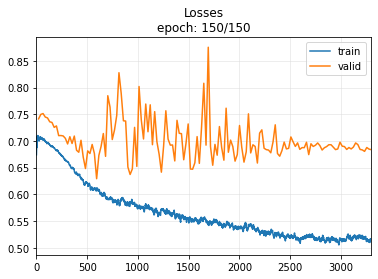

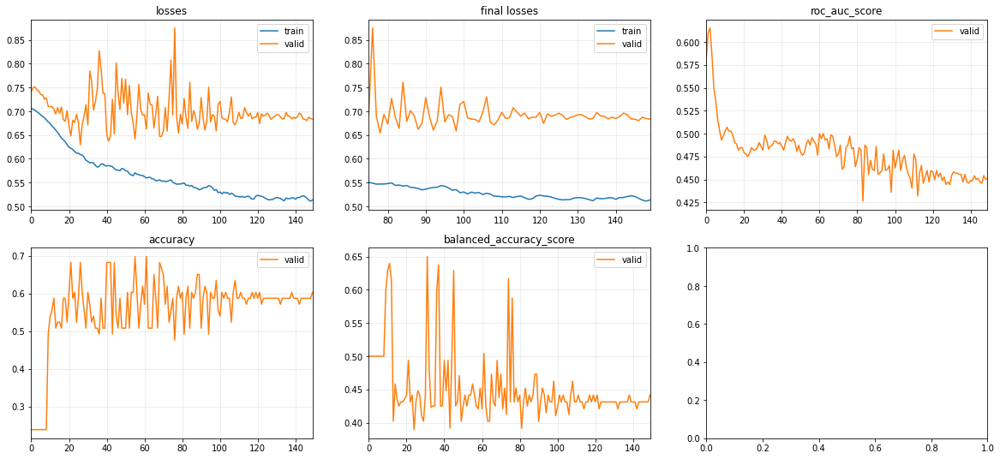


Elapsed time: 89.34957480430603


epoch,train_loss,valid_loss,roc_auc_score,accuracy,balanced_accuracy_score,time
0,0.690953,0.715257,0.862222,0.250000,0.500000,00:00
1,0.689611,0.691839,0.903704,0.450000,0.633333,00:00
2,0.688201,0.684626,0.887407,0.566667,0.711111,00:00
3,0.686756,0.682647,0.874074,0.516667,0.677778,00:00
4,0.685502,0.677170,0.866667,0.550000,0.655556,00:00
5,0.683396,0.679076,0.866667,0.483333,0.633333,00:00
6,0.681598,0.670891,0.859259,0.533333,0.622222,00:00
7,0.678881,0.677372,0.856296,0.500000,0.666667,00:00
8,0.676752,0.651334,0.854815,0.616667,0.677778,00:00
9,0.673764,0.653670,0.851852,0.566667,0.644444,00:00


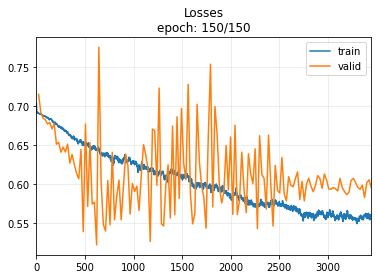

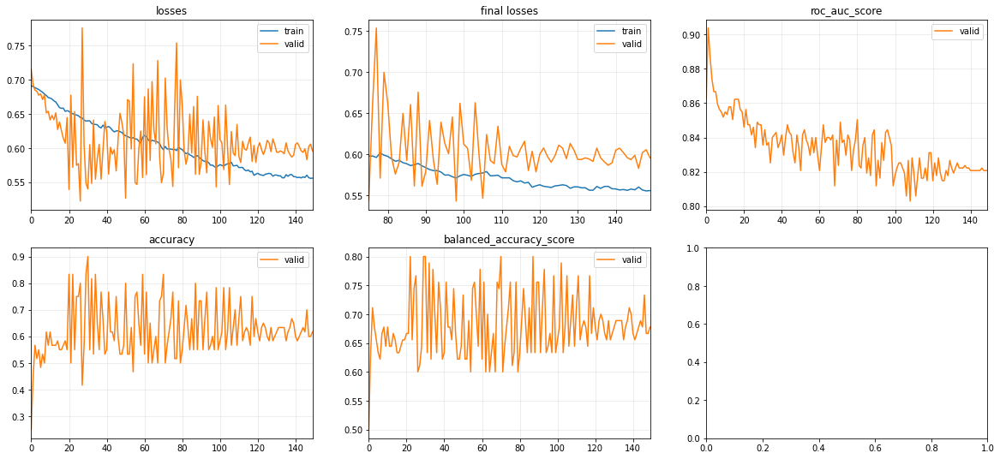


Elapsed time: 94.35673546791077


bacc: 0.5748611111111112 +- 0.11805098030349977, acc: 0.628095238095238 +- 0.07424703917940796, pr: 0.8012946170370983 +- 0.08684279964774312, rec: 0.6763888888888889 +- 0.11168601269675071


In [ ]:
kf = StratifiedKFold(n_splits=5, shuffle=False)

bs = 16
nvars = 1
seq_len = 125
c_out = 2
n_epochs = 150
bacc_per_fold = []
acc_per_fold = []
pre_per_fold = []
rec_per_fold = []
cm = []
hp = []

for train_index, test_index in kf.split(numero_sus, y_numero_sus):
    index_train_sus, index_test_sus = X.id.isin(numero_sus[train_index]), X.id.isin(numero_sus[test_index])
    X_train, y_train = X.loc[index_train_sus,cols], y[index_train_sus]
    X_test, y_test = X.loc[index_test_sus,cols], y[index_test_sus]

    rus = SMOTE(random_state=42)
    X_train, y_train = rus.fit_resample(X_train, y_train)
    
    tfms  = [None, [Categorize()]]
    X_3d_new, y_new, splits = combine_split_data([to3d(X_train),to3d(X_test)],[y_train,y_test])
    dsets = TSDatasets(X_3d_new, y_new.astype(int), tfms=tfms, splits=splits, inplace=True)
    dsets = TSDataLoaders.from_dsets(dsets.train, dsets.valid, bs=bs, batch_tfms=TSStandardize())
  
    model = model =  FCN(nvars, c_out)
    learn = Learner(dsets, model, loss_func=LabelSmoothingCrossEntropyFlat(), metrics=[RocAucBinary(), accuracy, BalancedAccuracy()],  cbs=ShowGraphCallback2())
    start = time.time()
    learn.fit_one_cycle(n_epochs, lr_max=1e-4)
    print('\nElapsed time:', time.time() - start)

    X_test = X_3d_new[splits[1]]
    y_test = y_new[splits[1]]

    test_probas, test_targets, test_preds = learn.get_X_preds(X_test, with_decoded=True)
    pred = [int(char) for char in test_preds if char == '1' or char == '0']

    cm.append(confusion_matrix(y_test, pred))
    bacc_per_fold.append(balanced_accuracy_score(y_test, pred))
    acc_per_fold.append(accuracy_score(y_test, pred))
    pre_per_fold.append(precision_score(y_test, pred))
    rec_per_fold.append(recall_score(y_test, pred))

print("bacc: {} +- {}, acc: {} +- {}, pr: {} +- {}, rec: {} +- {}".format(np.mean(bacc_per_fold), np.std(bacc_per_fold),np.mean(acc_per_fold), np.std(acc_per_fold),
                                                              np.mean(pre_per_fold), np.std(pre_per_fold),
                                                              np.mean(rec_per_fold), np.std(rec_per_fold)))

In [ ]:
print('list cm: {} \n cm: {}'.format(cm, sum(cm)))
print("bacc: {}, acc: {}, pr: {}, rec: {}".format(bacc_per_fold,acc_per_fold,pre_per_fold,rec_per_fold))

list cm: [array([[ 6, 12],
       [19, 26]]), array([[15,  3],
       [16, 29]]), array([[ 4, 11],
       [ 7, 41]]), array([[ 2, 13],
       [12, 36]]), array([[12,  3],
       [20, 25]])] 
 cm: [[ 39  42]
 [ 74 157]]
bacc: [0.4555555555555555, 0.7388888888888889, 0.5604166666666667, 0.44166666666666665, 0.6777777777777778], acc: [0.5079365079365079, 0.6984126984126984, 0.7142857142857143, 0.6031746031746031, 0.6166666666666667], pr: [0.6842105263157895, 0.90625, 0.7884615384615384, 0.7346938775510204, 0.8928571428571429], rec: [0.5777777777777777, 0.6444444444444445, 0.8541666666666666, 0.75, 0.5555555555555556]


In [ ]:
class cnn1d(nn.Module):
    def __init__(self, classes):
        super(cnn1d, self).__init__()
        self.extracted_fetures = None
        self.conv1 = nn.Conv1d(1, 6, 8)
        self.pool = nn.MaxPool1d(5, stride=3)
        self.conv2 = nn.Conv1d(6, 16, 8)
        self.dropout1 = nn.Dropout(0.3)
        self.dropout1 = nn.Dropout(0.3)
        self.fc1 = nn.Linear(144, 224)
        self.fc2 = nn.Linear(224, 80)
        self.fc3 = nn.Linear(80, classes)

    def forward(self, x):

        x = self.pool(F.relu(self.conv1(x)))
        x = self.pool(F.relu(self.conv2(x)))
        x = x.view(-1, 144)
        x = F.relu(self.fc1(x))
        self.extracted_fetures = x
        x = F.relu(self.fc2(x))

        x = self.fc3(x)

        return x

epoch,train_loss,valid_loss,roc_auc_score,accuracy,balanced_accuracy_score,time
0,0.697117,0.737426,0.617284,0.285714,0.500000,00:00
1,0.697154,0.737120,0.617284,0.285714,0.500000,00:00
2,0.698234,0.736664,0.628395,0.285714,0.500000,00:00
3,0.697433,0.736230,0.634568,0.285714,0.500000,00:00
4,0.697765,0.735707,0.644444,0.285714,0.500000,00:00
5,0.698090,0.735195,0.641975,0.285714,0.500000,00:00
6,0.698131,0.734369,0.643210,0.285714,0.500000,00:00
7,0.697654,0.733182,0.650617,0.285714,0.500000,00:00
8,0.697309,0.732081,0.661728,0.285714,0.500000,00:00
9,0.697518,0.730752,0.665432,0.285714,0.500000,00:00


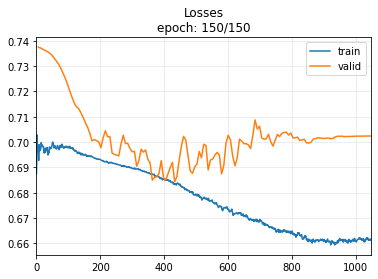

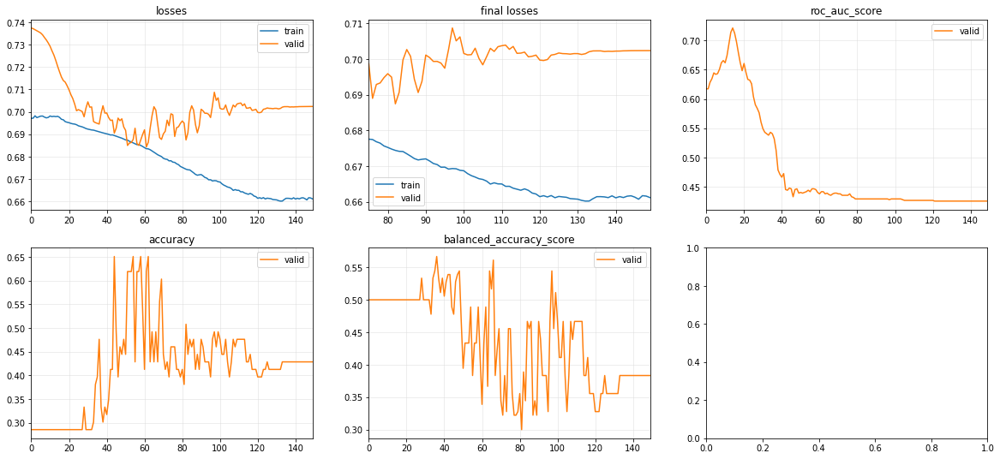


Elapsed time: 92.11701488494873


epoch,train_loss,valid_loss,roc_auc_score,accuracy,balanced_accuracy_score,time
0,0.693079,0.691561,0.382716,0.714286,0.500000,00:00
1,0.693102,0.691516,0.385185,0.714286,0.500000,00:00
2,0.693216,0.691503,0.386420,0.714286,0.500000,00:00
3,0.693184,0.691496,0.387654,0.714286,0.500000,00:00
4,0.693157,0.691508,0.391358,0.714286,0.500000,00:00
5,0.693189,0.691520,0.419753,0.714286,0.500000,00:00
6,0.693206,0.691586,0.430864,0.714286,0.500000,00:00
7,0.693217,0.691715,0.432099,0.714286,0.500000,00:00
8,0.693202,0.691803,0.445679,0.714286,0.500000,00:00
9,0.693177,0.691793,0.464815,0.714286,0.500000,00:00


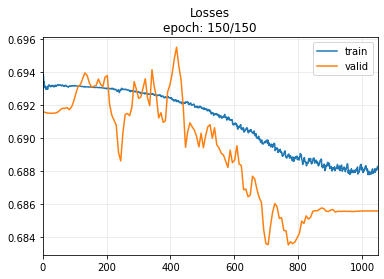

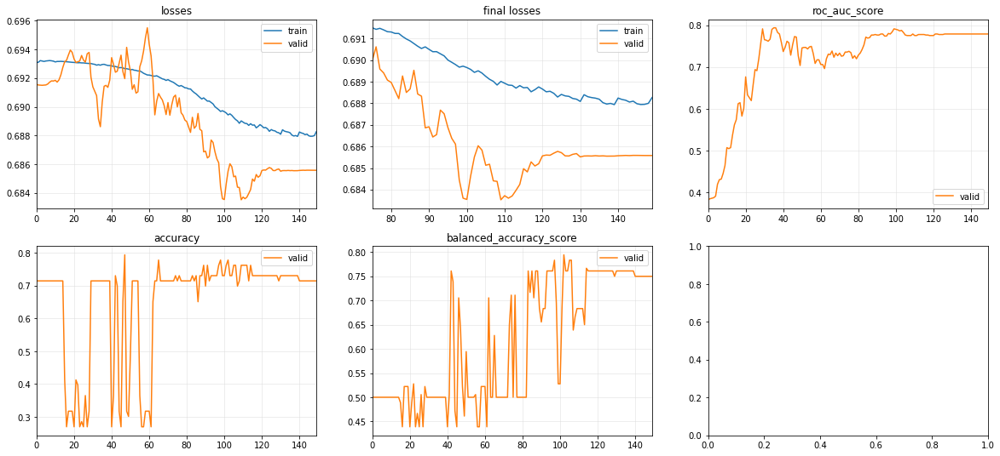


Elapsed time: 75.03046679496765


epoch,train_loss,valid_loss,roc_auc_score,accuracy,balanced_accuracy_score,time
0,0.696352,0.660444,0.313889,0.761905,0.500000,00:00
1,0.696807,0.660701,0.320833,0.761905,0.500000,00:00
2,0.696978,0.660969,0.320833,0.761905,0.500000,00:00
3,0.696723,0.661306,0.319444,0.761905,0.500000,00:00
4,0.696817,0.661702,0.331944,0.761905,0.500000,00:00
5,0.696376,0.662159,0.344444,0.761905,0.500000,00:00
6,0.696077,0.662615,0.340278,0.761905,0.500000,00:00
7,0.696208,0.663195,0.331944,0.761905,0.500000,00:00
8,0.696097,0.663867,0.315278,0.761905,0.500000,00:00
9,0.695902,0.664880,0.308333,0.761905,0.500000,00:00


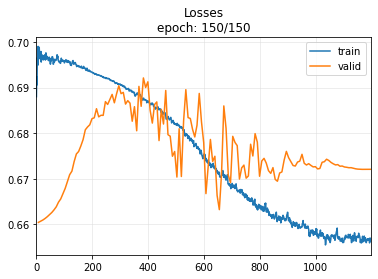

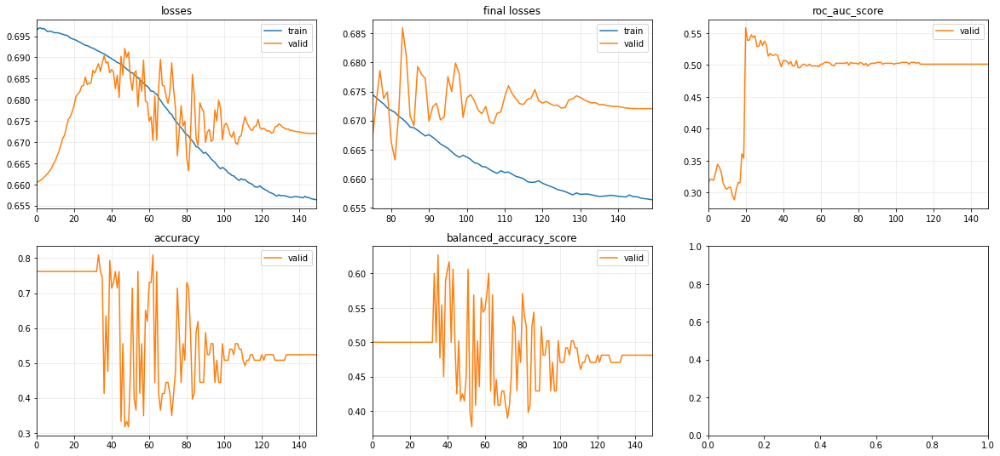


Elapsed time: 80.81921911239624


epoch,train_loss,valid_loss,roc_auc_score,accuracy,balanced_accuracy_score,time
0,0.692884,0.695877,0.423611,0.238095,0.500000,00:00
1,0.692914,0.695955,0.418056,0.238095,0.500000,00:00
2,0.692901,0.695988,0.423611,0.238095,0.500000,00:00
3,0.692887,0.695961,0.419444,0.238095,0.500000,00:00
4,0.692847,0.695993,0.420833,0.238095,0.500000,00:00
5,0.692838,0.695815,0.423611,0.238095,0.500000,00:00
6,0.692788,0.695839,0.429167,0.238095,0.500000,00:00
7,0.692760,0.695756,0.418056,0.238095,0.500000,00:00
8,0.692731,0.695866,0.419444,0.238095,0.500000,00:00
9,0.692674,0.695668,0.402778,0.238095,0.500000,00:00


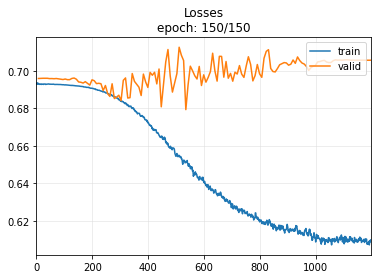

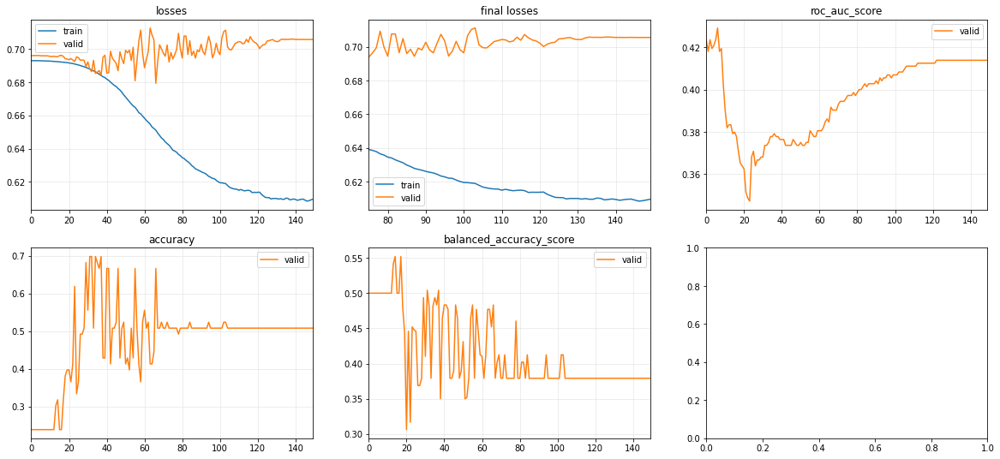


Elapsed time: 79.15538382530212


epoch,train_loss,valid_loss,roc_auc_score,accuracy,balanced_accuracy_score,time
0,0.693496,0.672386,0.897778,0.750000,0.500000,00:00
1,0.693134,0.672575,0.894815,0.750000,0.500000,00:00
2,0.693703,0.672807,0.890370,0.750000,0.500000,00:00
3,0.693774,0.673113,0.885926,0.750000,0.500000,00:00
4,0.693460,0.673464,0.882963,0.750000,0.500000,00:00
5,0.693425,0.673718,0.880000,0.750000,0.500000,00:00
6,0.693518,0.674145,0.874074,0.750000,0.500000,00:00
7,0.693460,0.674582,0.869630,0.750000,0.500000,00:00
8,0.693499,0.675422,0.869630,0.750000,0.500000,00:00
9,0.693303,0.675973,0.872593,0.750000,0.500000,00:00


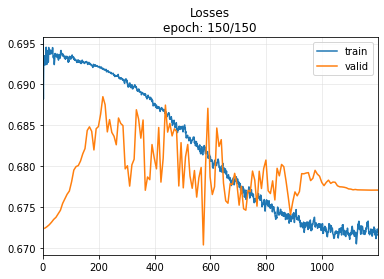

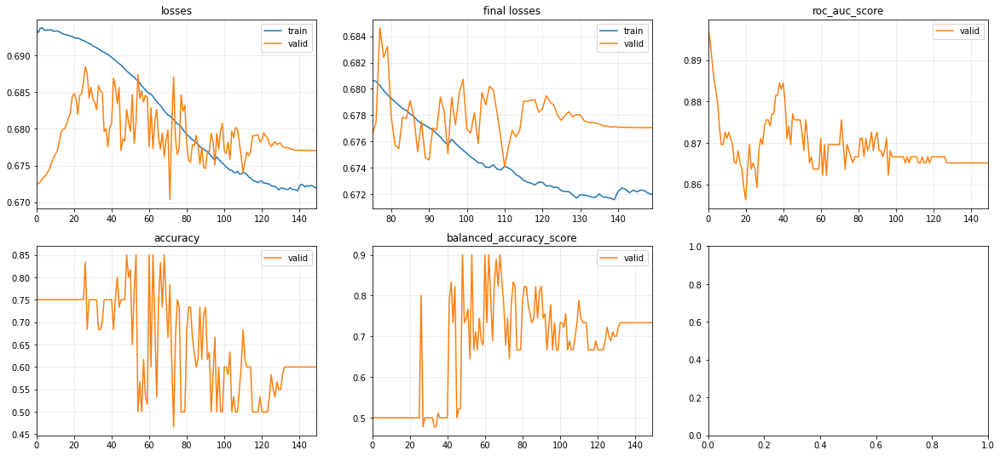


Elapsed time: 81.37087106704712


bacc: 0.5454166666666667 +- 0.16443505979227452, acc: 0.5549206349206349 +- 0.09650793650793651, pr: 0.7970673512533978 +- 0.13727061157645015, rec: 0.5619444444444445 +- 0.0766263984425185


In [ ]:
kf = StratifiedKFold(n_splits=5, shuffle=False)
bs = 16
bacc_per_fold = []
acc_per_fold = []
pre_per_fold = []
rec_per_fold = []
cm = []
hp = []

for train_index, test_index in kf.split(numero_sus, y_numero_sus):
    index_train_sus, index_test_sus = X.id.isin(numero_sus[train_index]), X.id.isin(numero_sus[test_index])
    X_train, y_train = X.loc[index_train_sus,cols], y[index_train_sus]
    X_test, y_test = X.loc[index_test_sus,cols], y[index_test_sus]

    rus = RandomUnderSampler(random_state=42)
    X_train, y_train = rus.fit_resample(X_train, y_train)
    
    tfms  = [None, [Categorize()]]
    X_3d_new, y_new, splits = combine_split_data([to3d(X_train),to3d(X_test)],[y_train,y_test])
    dsets = TSDatasets(X_3d_new, y_new.astype(int), tfms=tfms, splits=splits, inplace=True)
    dsets = TSDataLoaders.from_dsets(dsets.train, dsets.valid, bs=bs, batch_tfms=TSStandardize())
  
    model =  cnn1d(2)
    learn = Learner(dsets, model, loss_func=LabelSmoothingCrossEntropyFlat(), metrics=[RocAucBinary(), accuracy, BalancedAccuracy()],  cbs=ShowGraphCallback2())
    start = time.time()
    learn.fit_one_cycle(n_epochs, lr_max=1e-4)
    print('\nElapsed time:', time.time() - start)

    X_test = X_3d_new[splits[1]]
    y_test = y_new[splits[1]]

    test_probas, test_targets, test_preds = learn.get_X_preds(X_test, with_decoded=True)
    pred = [int(char) for char in test_preds if char == '1' or char == '0']

    cm.append(confusion_matrix(y_test, pred))
    bacc_per_fold.append(balanced_accuracy_score(y_test, pred))
    acc_per_fold.append(accuracy_score(y_test, pred))
    pre_per_fold.append(precision_score(y_test, pred))
    rec_per_fold.append(recall_score(y_test, pred))

print("bacc: {} +- {}, acc: {} +- {}, pr: {} +- {}, rec: {} +- {}".format(np.mean(bacc_per_fold), np.std(bacc_per_fold),np.mean(acc_per_fold), np.std(acc_per_fold),
                                                              np.mean(pre_per_fold), np.std(pre_per_fold),
                                                              np.mean(rec_per_fold), np.std(rec_per_fold)))

In [ ]:
X[cols].values

array([[-0.18802943, -0.36606269, -0.52206766, ...,  0.88759824,
         0.87379593,  0.86045919],
       [-0.19399015, -0.37055298, -0.52504506, ...,  0.88576273,
         0.86996933,  0.85414697],
       [-0.16963614, -0.34124344, -0.49267161, ...,  0.899995  ,
         0.8857194 ,  0.87173585],
       ...,
       [ 0.23613726,  0.08968994, -0.04630405, ...,  0.92255055,
         0.89669766,  0.86993648],
       [ 0.28903302,  0.12880841, -0.01844335, ...,  0.92738446,
         0.90413035,  0.88047185],
       [ 0.30012167,  0.13363697, -0.01719208, ...,  0.928089  ,
         0.90542552,  0.88256986]])

In [ ]:
a = model.forward(torch.from_numpy(to3d(X[cols].values)).to('cuda', dtype=torch.float))

In [ ]:
mode

In [ ]:
import torch

In [ ]:
model.extracted_fetures.shape

torch.Size([312, 224])

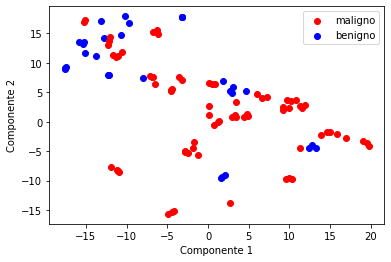

In [ ]:
from sklearn.manifold import TSNE
X_embedded = TSNE(n_components=2,learning_rate='auto', init='random').fit_transform(model.extracted_fetures.cpu().detach().numpy())
for i in range(X2.shape[0]):
  if y[i] == 0:
    plt.scatter(X_embedded[i,0],X_embedded[i,1],color='blue', label = 'benigno')
  else:
    plt.scatter(X_embedded[i,0],X_embedded[i,1],color='red', label = 'maligno')
plt.xlabel('Componente 1')
plt.ylabel('Componente 2')
handles, labels = plt.gca().get_legend_handles_labels()
by_label = dict(zip(labels, handles))
plt.legend(by_label.values(), by_label.keys())

In [ ]:
print('list cm: {} \n cm: {}'.format(cm, sum(cm)))
print("bacc: {}, acc: {}, pr: {}, rec: {}".format(bacc_per_fold,acc_per_fold,pre_per_fold,rec_per_fold))

list cm: [array([[ 6, 12],
       [25, 20]]), array([[15,  3],
       [25, 20]]), array([[ 6,  9],
       [ 8, 40]]), array([[ 2, 13],
       [13, 35]]), array([[12,  3],
       [10, 35]])] 
 cm: [[ 41  40]
 [ 81 150]]
bacc: [0.38888888888888884, 0.6388888888888888, 0.6166666666666667, 0.43124999999999997, 0.788888888888889], acc: [0.4126984126984127, 0.5555555555555556, 0.7301587301587301, 0.5873015873015873, 0.7833333333333333], pr: [0.625, 0.8695652173913043, 0.8163265306122449, 0.7291666666666666, 0.9210526315789473], rec: [0.4444444444444444, 0.4444444444444444, 0.8333333333333334, 0.7291666666666666, 0.7777777777777778]


In [ ]:
import optuna

In [ ]:
def objective(trial, X_train, y_train, numero_sus2, y_numero_sus2):
    
    nvars = 1
    seq_len = 125
    c_out = 2
    n_epochs = 150
    bs = trial.suggest_int('bs', 16, 64)
    c = [trial.suggest_int('c1', 64, 256),trial.suggest_int('c2', 64, 256),trial.suggest_int('c3', 64, 256)]
    k = [trial.suggest_int('k1', 3, 7),trial.suggest_int('k2', 3, 7),trial.suggest_int('k3', 3, 7)]
    

    kf = StratifiedKFold(n_splits=5, shuffle=False)
    bacc_per_fold = []
    for train_index, test_index in kf.split(numero_sus2, y_numero_sus2):
        index_train_sus, index_test_sus = X.id.isin(numero_sus2[train_index]), X.id.isin(numero_sus2[test_index])
        X_train2, y_train2 = X_train.loc[index_train_sus,cols], y_train[index_train_sus]
        X_test2, y_test2 = X_train.loc[index_test_sus,cols], y_train[index_test_sus]

        rus = SMOTE(random_state=42)
        X_train2, y_train2 = rus.fit_resample(X_train2, y_train2)
        
        tfms  = [None, [Categorize()]]
        X_3d_new, y_new, splits = combine_split_data([to3d(X_train2),to3d(X_test2)],[y_train2,y_test2])
        dsets = TSDatasets(X_3d_new, y_new.astype(int), tfms=tfms, splits=splits, inplace=True)
        dsets = TSDataLoaders.from_dsets(dsets.train, dsets.valid, bs=bs, batch_tfms=TSStandardize())
      
        model =  FCN(nvars, c_out, c, k)
        learn = Learner(dsets, model, loss_func=LabelSmoothingCrossEntropyFlat(), metrics=[RocAucBinary(), accuracy, BalancedAccuracy()])
        start = time.time()
        learn.fit_one_cycle(n_epochs, lr_max=1e-4)
        print('\nElapsed time:', time.time() - start)

        X_test = X_3d_new[splits[1]]
        y_test = y_new[splits[1]]

        test_probas, test_targets, test_preds = learn.get_X_preds(X_test, with_decoded=True)
        pred = [int(char) for char in test_preds if char == '1' or char == '0']

        bacc_per_fold.append(balanced_accuracy_score(y_test, pred))
    
    return np.mean(bacc_per_fold)


[I 2022-03-02 21:50:10,381] A new study created in memory with name: trial


epoch,train_loss,valid_loss,roc_auc_score,accuracy,balanced_accuracy_score,time
0,0.704736,0.635771,0.644444,0.714286,0.500000,00:03
1,0.703094,0.636893,0.617284,0.714286,0.500000,00:00
2,0.701250,0.645070,0.613580,0.714286,0.500000,00:00
3,0.699428,0.659407,0.651852,0.714286,0.500000,00:00
4,0.697147,0.674656,0.511111,0.714286,0.500000,00:00
5,0.694548,0.683991,0.470370,0.682540,0.494444,00:00
6,0.692064,0.692279,0.450617,0.396825,0.377778,00:00
7,0.689147,0.700482,0.448148,0.396825,0.527778,00:00
8,0.686192,0.708898,0.441975,0.412698,0.555556,00:00
9,0.683055,0.717388,0.448148,0.380952,0.533333,00:00


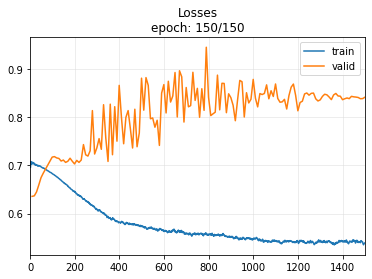

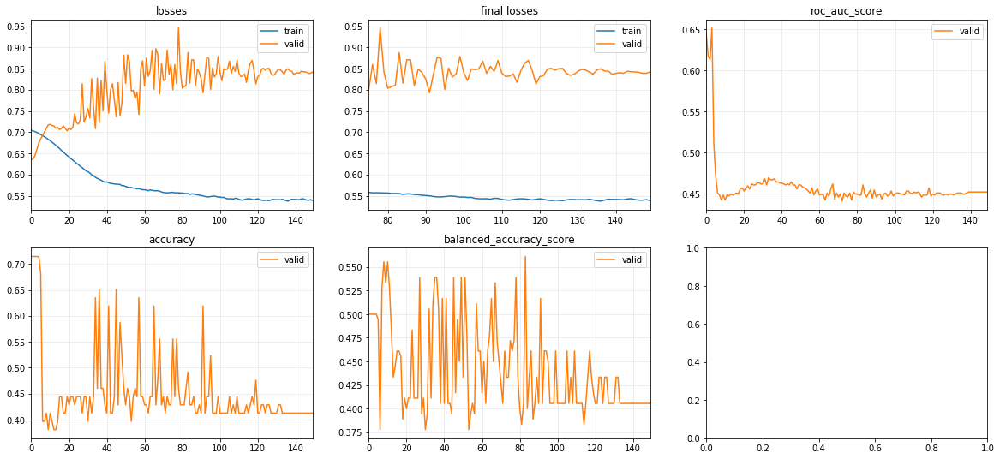


Elapsed time: 81.21293878555298


epoch,train_loss,valid_loss,roc_auc_score,accuracy,balanced_accuracy_score,time
0,0.694926,0.635937,0.711111,0.714286,0.500000,00:00
1,0.693851,0.647082,0.902469,0.714286,0.500000,00:00
2,0.693301,0.660478,0.755556,0.714286,0.500000,00:00
3,0.692769,0.672255,0.724691,0.714286,0.500000,00:00
4,0.692189,0.679990,0.755556,0.761905,0.583333,00:00
5,0.691477,0.685841,0.790123,0.571429,0.650000,00:00
6,0.690449,0.689734,0.807407,0.380952,0.533333,00:00
7,0.689650,0.693443,0.849383,0.365079,0.555556,00:00
8,0.688617,0.692981,0.861728,0.365079,0.555556,00:00
9,0.687307,0.694059,0.864198,0.365079,0.555556,00:00


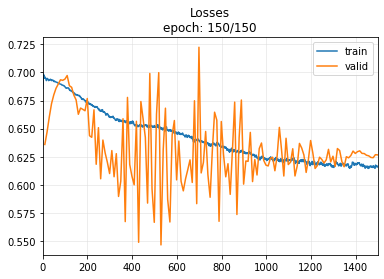

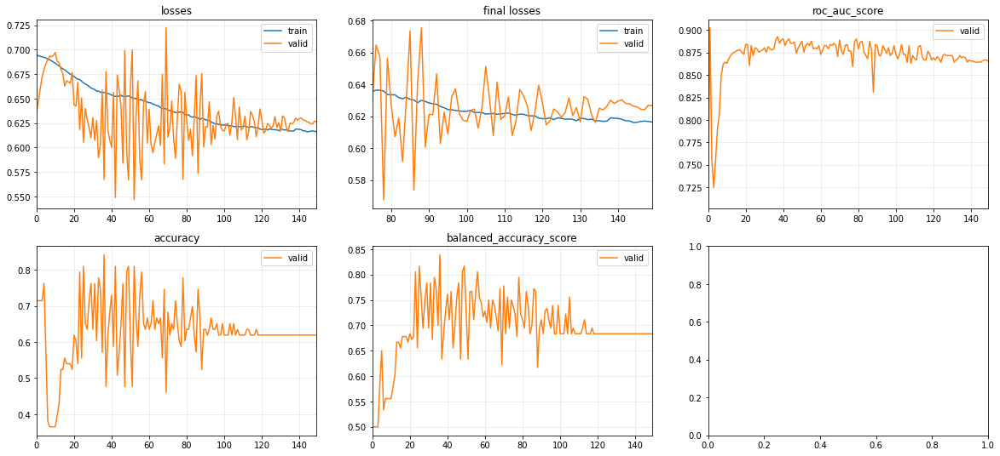


Elapsed time: 80.81705570220947


epoch,train_loss,valid_loss,roc_auc_score,accuracy,balanced_accuracy_score,time
0,0.739033,0.610380,0.697222,0.761905,0.500000,00:00
1,0.733663,0.602123,0.645833,0.761905,0.500000,00:00
2,0.731005,0.599968,0.618056,0.761905,0.500000,00:00
3,0.728013,0.600789,0.650000,0.761905,0.500000,00:00
4,0.723741,0.604183,0.645833,0.761905,0.500000,00:00
5,0.719848,0.608451,0.638889,0.761905,0.500000,00:00
6,0.714985,0.613717,0.631944,0.761905,0.500000,00:00
7,0.710809,0.620470,0.633333,0.761905,0.500000,00:00
8,0.706498,0.625522,0.637500,0.761905,0.500000,00:00
9,0.701794,0.630957,0.634722,0.761905,0.500000,00:00


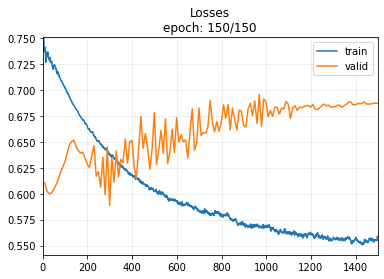

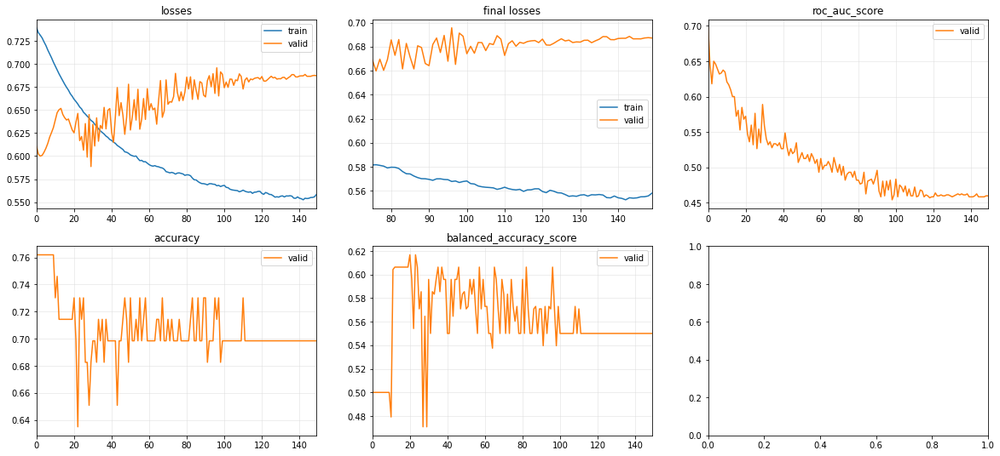


Elapsed time: 82.45173716545105


epoch,train_loss,valid_loss,roc_auc_score,accuracy,balanced_accuracy_score,time
0,0.700777,0.637355,0.505556,0.761905,0.500000,00:00
1,0.701210,0.650029,0.459722,0.761905,0.500000,00:00
2,0.698909,0.666056,0.441667,0.761905,0.500000,00:00
3,0.696595,0.669058,0.426389,0.761905,0.500000,00:00
4,0.694268,0.669416,0.415278,0.761905,0.500000,00:00
5,0.692156,0.673036,0.391667,0.761905,0.500000,00:00
6,0.689769,0.680064,0.408333,0.682540,0.447917,00:00
7,0.687003,0.688911,0.418056,0.587302,0.431250,00:00
8,0.684254,0.694511,0.426389,0.507937,0.402083,00:00
9,0.681516,0.698505,0.448611,0.539683,0.514583,00:00


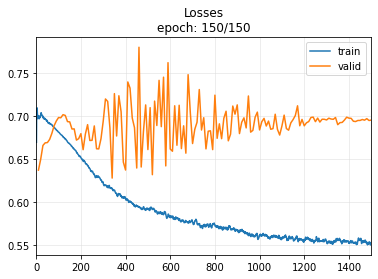

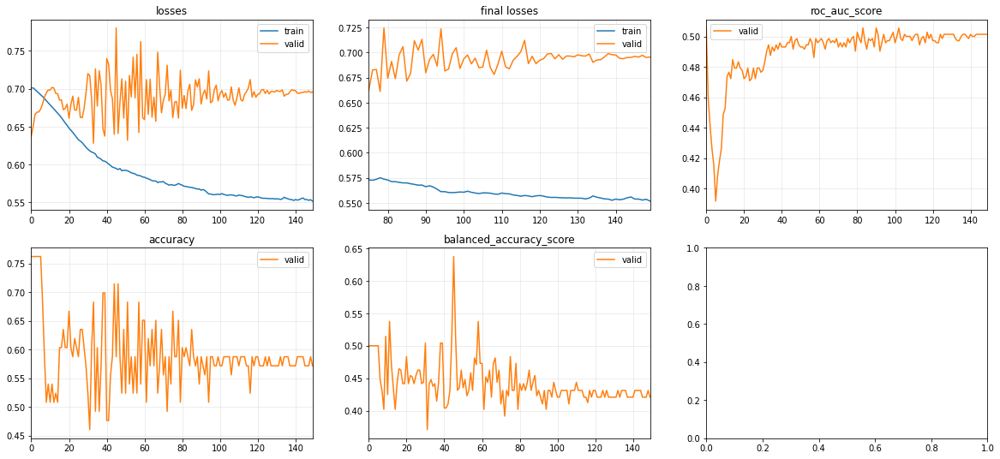


Elapsed time: 82.90131545066833


epoch,train_loss,valid_loss,roc_auc_score,accuracy,balanced_accuracy_score,time
0,0.691301,0.629352,0.629630,0.750000,0.500000,00:00
1,0.690619,0.647801,0.909630,0.750000,0.500000,00:00
2,0.690065,0.669562,0.927407,0.750000,0.500000,00:00
3,0.689195,0.680552,0.872593,0.766667,0.777778,00:00
4,0.688431,0.685152,0.865185,0.600000,0.733333,00:00
5,0.687727,0.684647,0.865185,0.550000,0.700000,00:00
6,0.686612,0.683939,0.866667,0.516667,0.677778,00:00
7,0.685438,0.684457,0.869630,0.500000,0.666667,00:00
8,0.684387,0.683039,0.868148,0.500000,0.666667,00:00
9,0.682917,0.676559,0.866667,0.566667,0.711111,00:00


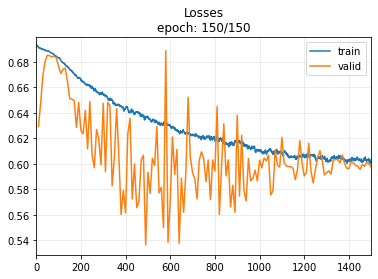

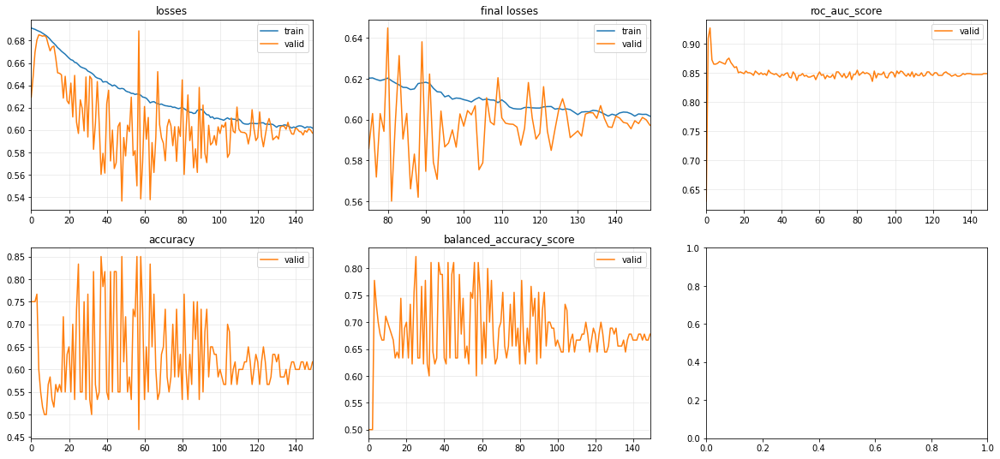


Elapsed time: 84.48099255561829


[I 2022-03-02 21:57:04,652] Trial 0 finished with value: 0.5475 and parameters: {'bs': 35, 'c1': 144, 'c2': 193, 'c3': 183, 'k1': 3, 'k2': 3, 'k3': 4}. Best is trial 0 with value: 0.5475.


epoch,train_loss,valid_loss,roc_auc_score,accuracy,balanced_accuracy_score,time
0,0.682249,0.732400,0.359259,0.285714,0.500000,00:04
1,0.680099,0.750141,0.437037,0.285714,0.500000,00:00
2,0.678407,0.745472,0.445679,0.301587,0.511111,00:00
3,0.676914,0.739490,0.454321,0.333333,0.533333,00:00
4,0.675199,0.734049,0.466667,0.317460,0.505556,00:00
5,0.672939,0.732338,0.465432,0.317460,0.488889,00:00
6,0.670019,0.730184,0.466667,0.349206,0.511111,00:00
7,0.667781,0.730171,0.467901,0.396825,0.527778,00:00
8,0.665278,0.731722,0.467901,0.396825,0.527778,00:00
9,0.661689,0.730181,0.474074,0.444444,0.561111,00:00


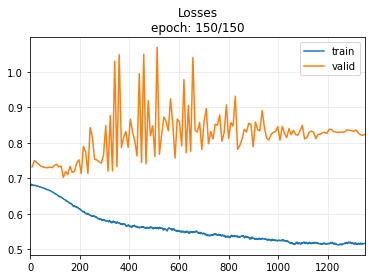

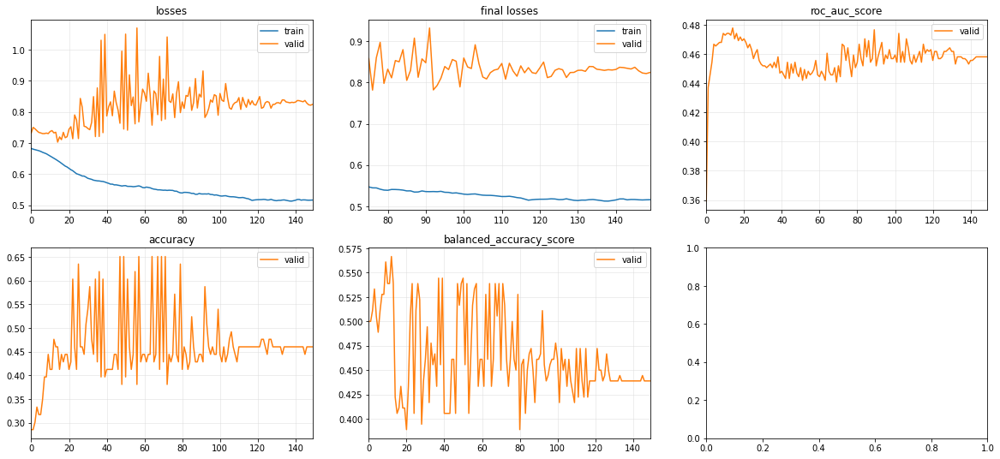


Elapsed time: 91.91144514083862


epoch,train_loss,valid_loss,roc_auc_score,accuracy,balanced_accuracy_score,time
0,0.695248,0.666408,0.256790,0.714286,0.500000,00:00
1,0.694199,0.668232,0.495062,0.714286,0.500000,00:00
2,0.693404,0.673754,0.659259,0.714286,0.500000,00:00
3,0.692169,0.680607,0.753086,0.777778,0.627778,00:00
4,0.690639,0.685926,0.785185,0.539683,0.627778,00:00
5,0.689237,0.690185,0.804938,0.380952,0.516667,00:00
6,0.687863,0.689877,0.817284,0.380952,0.516667,00:00
7,0.686334,0.685954,0.832099,0.444444,0.561111,00:00
8,0.684669,0.683661,0.843210,0.476190,0.600000,00:00
9,0.683161,0.678563,0.844444,0.492063,0.594444,00:00


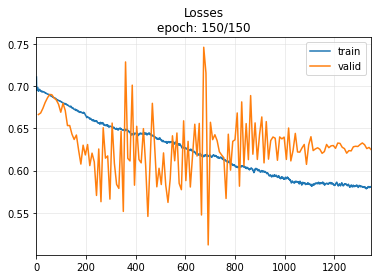

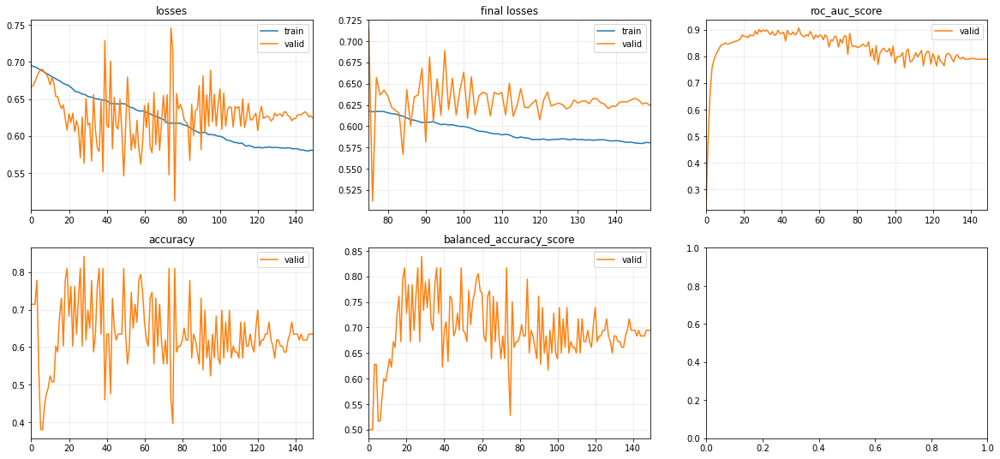


Elapsed time: 90.52198815345764


epoch,train_loss,valid_loss,roc_auc_score,accuracy,balanced_accuracy_score,time
0,0.696972,0.713297,0.804167,0.253968,0.510417,00:00
1,0.695769,0.676683,0.798611,0.777778,0.579167,00:00
2,0.693627,0.658874,0.813889,0.761905,0.500000,00:00
3,0.691564,0.653507,0.769444,0.761905,0.500000,00:00
4,0.689145,0.656986,0.712500,0.698413,0.504167,00:00
5,0.686708,0.658080,0.677778,0.730159,0.616667,00:00
6,0.684055,0.656120,0.654167,0.714286,0.606250,00:00
7,0.681404,0.654252,0.647222,0.714286,0.606250,00:00
8,0.679029,0.653008,0.627778,0.714286,0.606250,00:00
9,0.676577,0.655659,0.590278,0.698413,0.595833,00:00


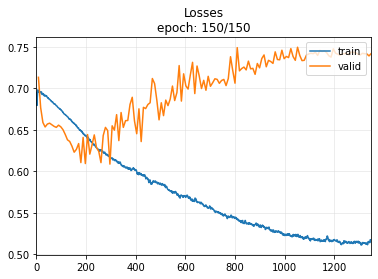

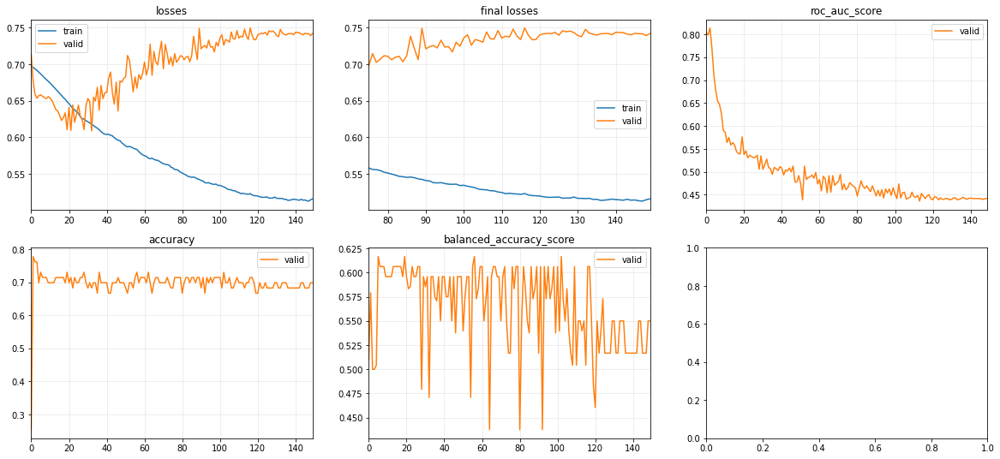


Elapsed time: 92.58915829658508


epoch,train_loss,valid_loss,roc_auc_score,accuracy,balanced_accuracy_score,time
0,0.694766,0.781754,0.320833,0.238095,0.500000,00:00
1,0.692677,0.772232,0.388889,0.238095,0.500000,00:00
2,0.690513,0.766914,0.413889,0.238095,0.500000,00:00
3,0.689088,0.757547,0.429167,0.238095,0.500000,00:00
4,0.686669,0.748216,0.423611,0.238095,0.500000,00:00
5,0.684731,0.742360,0.429167,0.238095,0.500000,00:00
6,0.682600,0.741424,0.438889,0.190476,0.400000,00:00
7,0.680101,0.729361,0.458333,0.238095,0.431250,00:00
8,0.676950,0.729677,0.475000,0.253968,0.441667,00:00
9,0.674159,0.715134,0.477778,0.507937,0.585417,00:00


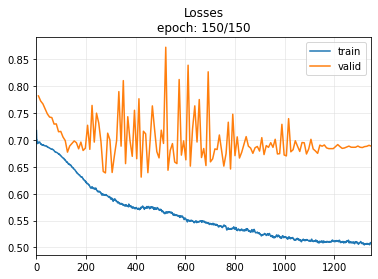

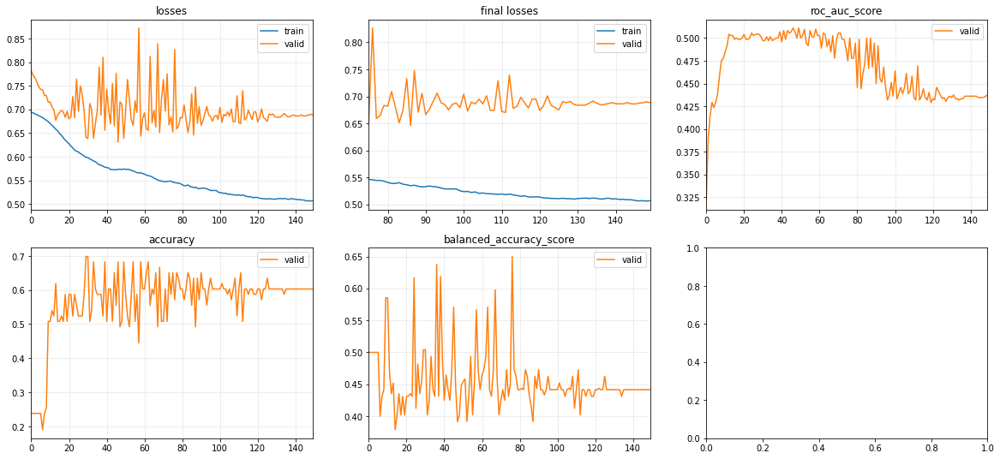


Elapsed time: 95.71707081794739


epoch,train_loss,valid_loss,roc_auc_score,accuracy,balanced_accuracy_score,time
0,0.694423,0.727736,0.780741,0.250000,0.500000,00:01
1,0.693585,0.712048,0.724444,0.250000,0.500000,00:00
2,0.692695,0.715252,0.761481,0.250000,0.500000,00:00
3,0.692003,0.717266,0.811852,0.266667,0.511111,00:00
4,0.690825,0.714499,0.829630,0.283333,0.522222,00:00
5,0.689402,0.713317,0.844444,0.300000,0.533333,00:00
6,0.688023,0.710108,0.844444,0.316667,0.544444,00:00
7,0.686645,0.705176,0.840000,0.333333,0.555556,00:00
8,0.684835,0.699828,0.834074,0.400000,0.600000,00:00
9,0.683867,0.696779,0.832593,0.400000,0.600000,00:00


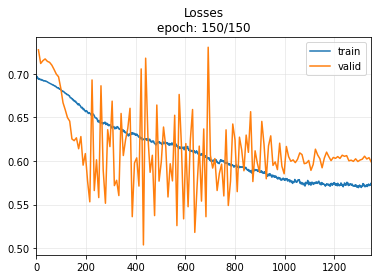

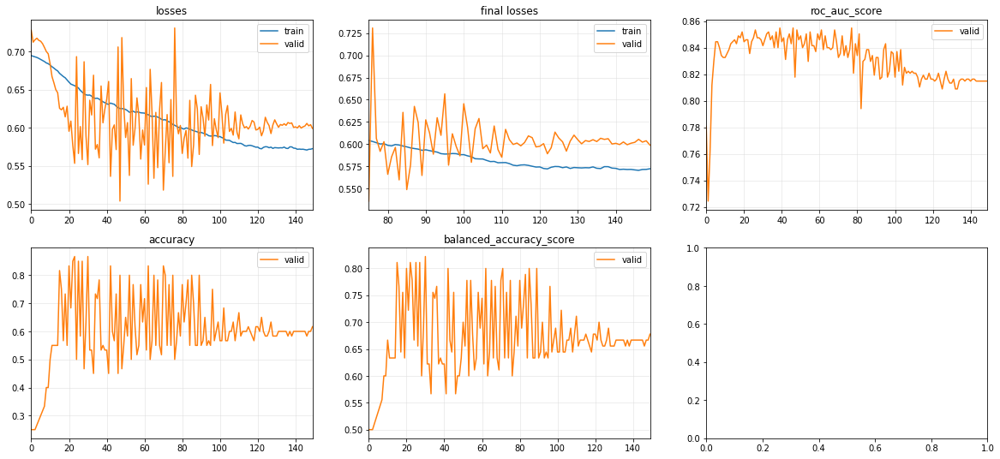


Elapsed time: 95.95647311210632


[I 2022-03-02 22:04:55,588] Trial 1 finished with value: 0.5605555555555556 and parameters: {'bs': 38, 'c1': 226, 'c2': 249, 'c3': 157, 'k1': 7, 'k2': 5, 'k3': 4}. Best is trial 1 with value: 0.5605555555555556.


In [ ]:
study = optuna.create_study(study_name="trial", direction="maximize")
study.optimize(objective, n_trials=2)

In [ ]:
study.best_params

{'bs': 38, 'c1': 226, 'c2': 249, 'c3': 157, 'k1': 7, 'k2': 5, 'k3': 4}

[I 2022-03-02 23:13:11,145] A new study created in memory with name: trial


epoch,train_loss,valid_loss,roc_auc_score,accuracy,balanced_accuracy_score,time
0,0.689549,0.746932,0.632479,0.235294,0.500000,00:02
1,0.688983,0.728028,0.702991,0.235294,0.500000,00:00
2,0.687959,0.724445,0.852564,0.235294,0.500000,00:00
3,0.686785,0.723876,0.901709,0.235294,0.500000,00:00
4,0.685599,0.724362,0.886752,0.274510,0.525641,00:00
5,0.684663,0.725560,0.856838,0.274510,0.525641,00:00
6,0.683257,0.724600,0.850427,0.313726,0.551282,00:00
7,0.681566,0.720486,0.846154,0.333333,0.564103,00:00
8,0.680134,0.715411,0.839744,0.333333,0.564103,00:00
9,0.678592,0.708322,0.826923,0.352941,0.576923,00:00



Elapsed time: 36.60127639770508


epoch,train_loss,valid_loss,roc_auc_score,accuracy,balanced_accuracy_score,time
0,0.696448,0.697020,0.365385,0.235294,0.500000,00:00
1,0.694700,0.697693,0.297009,0.254902,0.512821,00:00
2,0.693557,0.700624,0.354701,0.274510,0.525641,00:00
3,0.692183,0.701444,0.696581,0.294118,0.538462,00:00
4,0.690834,0.700631,0.871795,0.313726,0.551282,00:00
5,0.689625,0.698153,0.891026,0.313726,0.551282,00:00
6,0.688289,0.695396,0.886752,0.313726,0.551282,00:00
7,0.687069,0.691842,0.888889,0.313726,0.551282,00:00
8,0.685493,0.686706,0.895299,0.411765,0.615385,00:00
9,0.683771,0.685443,0.897436,0.411765,0.615385,00:00



Elapsed time: 35.523043155670166


epoch,train_loss,valid_loss,roc_auc_score,accuracy,balanced_accuracy_score,time
0,0.709532,0.646580,0.244444,0.705882,0.500000,00:00
1,0.706228,0.642780,0.181481,0.705882,0.500000,00:00
2,0.702198,0.646016,0.150000,0.705882,0.500000,00:00
3,0.699338,0.650912,0.268519,0.705882,0.500000,00:00
4,0.696687,0.659293,0.368519,0.705882,0.500000,00:00
5,0.693562,0.668154,0.451852,0.705882,0.500000,00:00
6,0.690807,0.673270,0.548148,0.705882,0.500000,00:00
7,0.687738,0.674457,0.579630,0.666667,0.491667,00:00
8,0.685024,0.677052,0.598148,0.549020,0.427778,00:00
9,0.681695,0.678964,0.601852,0.568627,0.461111,00:00



Elapsed time: 35.76568102836609


epoch,train_loss,valid_loss,roc_auc_score,accuracy,balanced_accuracy_score,time
0,0.702808,0.623683,0.844907,0.750000,0.500000,00:00
1,0.703914,0.640658,0.576389,0.750000,0.500000,00:00
2,0.702385,0.645481,0.518519,0.750000,0.500000,00:00
3,0.699764,0.650971,0.425926,0.750000,0.500000,00:00
4,0.696643,0.658059,0.398148,0.750000,0.500000,00:00
5,0.693863,0.666782,0.384259,0.750000,0.500000,00:00
6,0.691632,0.676842,0.370370,0.750000,0.500000,00:00
7,0.687747,0.685393,0.370370,0.625000,0.416667,00:00
8,0.683602,0.691978,0.370370,0.604167,0.458333,00:00
9,0.678873,0.691587,0.363426,0.583333,0.416667,00:00



Elapsed time: 36.093990087509155


epoch,train_loss,valid_loss,roc_auc_score,accuracy,balanced_accuracy_score,time
0,0.731470,0.821914,0.902778,0.250000,0.500000,00:00
1,0.726749,0.812118,0.687500,0.250000,0.500000,00:00
2,0.723746,0.818814,0.648148,0.250000,0.500000,00:00
3,0.721633,0.821139,0.745370,0.250000,0.500000,00:00
4,0.719004,0.813570,0.780093,0.250000,0.500000,00:00
5,0.714754,0.803129,0.821759,0.250000,0.500000,00:00
6,0.712283,0.793306,0.828704,0.250000,0.500000,00:00
7,0.708629,0.786366,0.854167,0.250000,0.500000,00:00
8,0.705300,0.778147,0.870370,0.250000,0.500000,00:00
9,0.701931,0.760296,0.870370,0.250000,0.500000,00:00



Elapsed time: 35.848626375198364


[I 2022-03-02 23:16:13,904] Trial 0 finished with value: 0.6380341880341881 and parameters: {'bs': 45, 'c1': 235, 'c2': 216, 'c3': 198, 'k1': 4, 'k2': 7, 'k3': 4}. Best is trial 0 with value: 0.6380341880341881.


epoch,train_loss,valid_loss,roc_auc_score,accuracy,balanced_accuracy_score,time
0,0.714402,0.623299,0.735043,0.764706,0.500000,00:01
1,0.711134,0.614027,0.790598,0.764706,0.500000,00:00
2,0.706935,0.617289,0.767094,0.764706,0.500000,00:00
3,0.703087,0.622549,0.762821,0.764706,0.500000,00:00
4,0.699692,0.626289,0.750000,0.764706,0.500000,00:00
5,0.694592,0.633522,0.743590,0.764706,0.500000,00:00
6,0.690626,0.637408,0.777778,0.823529,0.625000,00:00
7,0.685194,0.643920,0.790598,0.764706,0.673077,00:00
8,0.680523,0.641549,0.794872,0.705882,0.692308,00:00
9,0.676586,0.646468,0.807692,0.666667,0.695513,00:00



Elapsed time: 55.66004490852356


epoch,train_loss,valid_loss,roc_auc_score,accuracy,balanced_accuracy_score,time
0,0.747248,0.607667,0.895299,0.764706,0.500000,00:00
1,0.743711,0.602527,0.925214,0.764706,0.500000,00:00
2,0.737680,0.595413,0.920940,0.764706,0.500000,00:00
3,0.732493,0.590276,0.912393,0.764706,0.500000,00:00
4,0.727095,0.590363,0.912393,0.764706,0.500000,00:00
5,0.721412,0.593655,0.912393,0.764706,0.500000,00:00
6,0.714529,0.597324,0.910256,0.764706,0.500000,00:00
7,0.708783,0.601551,0.910256,0.764706,0.500000,00:00
8,0.702186,0.604058,0.910256,0.764706,0.500000,00:00
9,0.696159,0.611179,0.910256,0.764706,0.500000,00:00



Elapsed time: 55.74340629577637


epoch,train_loss,valid_loss,roc_auc_score,accuracy,balanced_accuracy_score,time
0,0.690476,0.698341,0.912963,0.294118,0.500000,00:00
1,0.689214,0.695787,0.800000,0.352941,0.541667,00:00
2,0.687424,0.689779,0.707407,0.647059,0.691667,00:00
3,0.685349,0.687677,0.675926,0.686275,0.700000,00:00
4,0.682866,0.687481,0.659259,0.686275,0.700000,00:00
5,0.679649,0.686051,0.653704,0.666667,0.666667,00:00
6,0.676253,0.684375,0.644444,0.647059,0.633333,00:00
7,0.672649,0.682671,0.633333,0.647059,0.633333,00:00
8,0.668108,0.680533,0.622222,0.627451,0.600000,00:00
9,0.665196,0.674906,0.616667,0.607843,0.547222,00:00



Elapsed time: 56.77567434310913


epoch,train_loss,valid_loss,roc_auc_score,accuracy,balanced_accuracy_score,time
0,0.697583,0.751370,0.731481,0.250000,0.500000,00:00
1,0.695977,0.737283,0.773148,0.250000,0.500000,00:00
2,0.694046,0.726779,0.476852,0.250000,0.500000,00:00
3,0.691502,0.721140,0.333333,0.250000,0.500000,00:00
4,0.688985,0.719706,0.324074,0.250000,0.500000,00:00
5,0.685534,0.721386,0.317130,0.208333,0.388889,00:00
6,0.681599,0.724965,0.319444,0.208333,0.361111,00:00
7,0.677189,0.732405,0.314815,0.208333,0.333333,00:00
8,0.672663,0.735150,0.307870,0.187500,0.291667,00:00
9,0.667148,0.727092,0.307870,0.416667,0.444444,00:00



Elapsed time: 53.11301374435425


epoch,train_loss,valid_loss,roc_auc_score,accuracy,balanced_accuracy_score,time
0,0.722531,0.602780,0.805556,0.750000,0.500000,00:00
1,0.716900,0.599443,0.854167,0.750000,0.500000,00:00
2,0.714560,0.606839,0.854167,0.750000,0.500000,00:00
3,0.710397,0.613580,0.854167,0.750000,0.500000,00:00
4,0.705113,0.617112,0.856481,0.750000,0.500000,00:00
5,0.701575,0.619703,0.861111,0.750000,0.500000,00:00
6,0.696845,0.623677,0.872685,0.750000,0.500000,00:00
7,0.691450,0.626019,0.879630,0.770833,0.541667,00:00
8,0.685453,0.624774,0.886574,0.875000,0.750000,00:00
9,0.678929,0.626753,0.886574,0.895833,0.847222,00:00



Elapsed time: 54.122320890426636


[I 2022-03-02 23:20:52,021] Trial 1 finished with value: 0.6408119658119659 and parameters: {'bs': 16, 'c1': 81, 'c2': 223, 'c3': 141, 'k1': 3, 'k2': 6, 'k3': 3}. Best is trial 1 with value: 0.6408119658119659.


epoch,train_loss,valid_loss,roc_auc_score,accuracy,balanced_accuracy_score,time
0,0.707462,0.625519,0.279915,0.764706,0.500000,00:01
1,0.705097,0.627590,0.561966,0.764706,0.500000,00:00
2,0.704050,0.630573,0.628205,0.764706,0.500000,00:00
3,0.701970,0.637797,0.690171,0.764706,0.500000,00:00
4,0.699401,0.645613,0.750000,0.764706,0.500000,00:00
5,0.696256,0.648326,0.769231,0.764706,0.500000,00:00
6,0.692842,0.646496,0.762821,0.803922,0.583333,00:00
7,0.689091,0.656302,0.773504,0.647059,0.596154,00:00
8,0.685911,0.663437,0.782051,0.666667,0.695513,00:00
9,0.682145,0.667890,0.782051,0.725490,0.820513,00:00



Elapsed time: 40.35725283622742


epoch,train_loss,valid_loss,roc_auc_score,accuracy,balanced_accuracy_score,time
0,0.702154,0.729211,0.818376,0.254902,0.512821,00:00
1,0.701791,0.733373,0.397436,0.254902,0.512821,00:00
2,0.700237,0.740136,0.773504,0.254902,0.512821,00:00
3,0.697682,0.737540,0.912393,0.254902,0.512821,00:00
4,0.695418,0.725330,0.882479,0.274510,0.525641,00:00
5,0.692577,0.707900,0.888889,0.294118,0.538462,00:00
6,0.690484,0.691440,0.886752,0.313726,0.551282,00:00
7,0.688011,0.675329,0.884615,0.549020,0.705128,00:00
8,0.685690,0.659741,0.891026,0.725490,0.820513,00:00
9,0.683421,0.651132,0.895299,0.803922,0.871795,00:00



Elapsed time: 39.35301232337952


epoch,train_loss,valid_loss,roc_auc_score,accuracy,balanced_accuracy_score,time
0,0.708614,0.720464,0.194444,0.294118,0.500000,00:00
1,0.706369,0.722476,0.862963,0.294118,0.500000,00:00
2,0.705337,0.727540,0.831481,0.294118,0.500000,00:00
3,0.703699,0.730083,0.811111,0.294118,0.500000,00:00
4,0.701367,0.734240,0.792593,0.294118,0.500000,00:00
5,0.698105,0.734468,0.755556,0.294118,0.500000,00:00
6,0.693628,0.730033,0.733333,0.294118,0.500000,00:00
7,0.689728,0.719623,0.712963,0.294118,0.500000,00:00
8,0.685449,0.714146,0.698148,0.352941,0.541667,00:00
9,0.681950,0.704293,0.692593,0.392157,0.569444,00:00



Elapsed time: 38.40224528312683


epoch,train_loss,valid_loss,roc_auc_score,accuracy,balanced_accuracy_score,time
0,0.692825,0.697014,0.835648,0.250000,0.500000,00:01
1,0.691082,0.688760,0.622685,0.750000,0.500000,00:00
2,0.689099,0.700204,0.266204,0.187500,0.291667,00:00
3,0.686610,0.711232,0.277778,0.250000,0.500000,00:00
4,0.684200,0.722692,0.312500,0.250000,0.500000,00:00
5,0.681294,0.729037,0.317130,0.229167,0.458333,00:00
6,0.678209,0.735957,0.310185,0.187500,0.375000,00:00
7,0.675196,0.732328,0.312500,0.208333,0.388889,00:00
8,0.671309,0.736629,0.305556,0.208333,0.361111,00:00
9,0.667955,0.744016,0.312500,0.208333,0.388889,00:00



Elapsed time: 39.021429777145386


epoch,train_loss,valid_loss,roc_auc_score,accuracy,balanced_accuracy_score,time
0,0.697991,0.708065,0.731481,0.270833,0.513889,00:00
1,0.697317,0.719970,0.782407,0.250000,0.500000,00:00
2,0.696699,0.733410,0.840278,0.250000,0.500000,00:00
3,0.694634,0.738240,0.840278,0.250000,0.500000,00:00
4,0.693112,0.734593,0.840278,0.270833,0.513889,00:00
5,0.691206,0.724940,0.847222,0.270833,0.513889,00:00
6,0.689689,0.721824,0.854167,0.270833,0.513889,00:00
7,0.687015,0.722653,0.854167,0.291667,0.527778,00:00
8,0.685543,0.725208,0.858796,0.291667,0.527778,00:00
9,0.683118,0.719395,0.863426,0.354167,0.569444,00:00



Elapsed time: 39.764055490493774


[I 2022-03-02 23:24:11,382] Trial 2 finished with value: 0.6322649572649572 and parameters: {'bs': 34, 'c1': 227, 'c2': 255, 'c3': 110, 'k1': 3, 'k2': 6, 'k3': 4}. Best is trial 1 with value: 0.6408119658119659.


epoch,train_loss,valid_loss,roc_auc_score,accuracy,balanced_accuracy_score,time
0,0.694637,0.620084,0.168803,0.764706,0.500000,00:02
1,0.693628,0.656846,0.038462,0.764706,0.500000,00:00
2,0.692552,0.673187,0.250000,0.764706,0.500000,00:00
3,0.691466,0.683413,0.502137,0.764706,0.500000,00:00
4,0.690187,0.690247,0.713675,0.588235,0.615385,00:00
5,0.688705,0.694107,0.762821,0.392157,0.602564,00:00
6,0.687311,0.695216,0.782051,0.392157,0.602564,00:00
7,0.685876,0.696292,0.788462,0.392157,0.602564,00:00
8,0.683986,0.690974,0.792735,0.411765,0.615385,00:00
9,0.681708,0.687797,0.797009,0.490196,0.666667,00:00



Elapsed time: 37.59723401069641


epoch,train_loss,valid_loss,roc_auc_score,accuracy,balanced_accuracy_score,time
0,0.693749,0.726457,0.914530,0.235294,0.500000,00:00
1,0.692975,0.692888,0.925214,0.411765,0.615385,00:00
2,0.692449,0.676278,0.920940,0.764706,0.500000,00:00
3,0.691514,0.673912,0.916667,0.764706,0.500000,00:00
4,0.690550,0.677741,0.912393,0.823529,0.711538,00:00
5,0.689586,0.681452,0.912393,0.823529,0.884615,00:00
6,0.688610,0.684013,0.910256,0.509804,0.679487,00:00
7,0.687520,0.685419,0.910256,0.490196,0.666667,00:00
8,0.686396,0.684873,0.910256,0.470588,0.653846,00:00
9,0.685108,0.680440,0.910256,0.490196,0.666667,00:00



Elapsed time: 36.580188274383545


epoch,train_loss,valid_loss,roc_auc_score,accuracy,balanced_accuracy_score,time
0,0.711060,0.673299,0.701852,0.705882,0.500000,00:00
1,0.706825,0.682404,0.707407,0.705882,0.500000,00:00
2,0.704268,0.686603,0.500000,0.725490,0.533333,00:00
3,0.701657,0.689139,0.487037,0.745098,0.566667,00:00
4,0.698759,0.689517,0.588889,0.607843,0.450000,00:00
5,0.695553,0.688114,0.600000,0.647059,0.516667,00:00
6,0.692567,0.687043,0.640741,0.607843,0.469444,00:00
7,0.689515,0.689059,0.618519,0.627451,0.541667,00:00
8,0.686454,0.688682,0.611111,0.647059,0.594444,00:00
9,0.682952,0.687938,0.611111,0.647059,0.613889,00:00



Elapsed time: 35.770270347595215


epoch,train_loss,valid_loss,roc_auc_score,accuracy,balanced_accuracy_score,time
0,0.706222,0.643064,0.715278,0.750000,0.500000,00:00
1,0.703806,0.678885,0.671296,0.750000,0.500000,00:00
2,0.700985,0.701371,0.537037,0.250000,0.500000,00:00
3,0.698462,0.718534,0.543981,0.250000,0.500000,00:00
4,0.697189,0.740252,0.453704,0.250000,0.500000,00:00
5,0.695080,0.757868,0.356481,0.250000,0.500000,00:00
6,0.692102,0.768397,0.358796,0.250000,0.500000,00:00
7,0.688601,0.777438,0.356481,0.250000,0.500000,00:00
8,0.685184,0.783783,0.340278,0.250000,0.500000,00:00
9,0.681592,0.773716,0.340278,0.250000,0.500000,00:00



Elapsed time: 35.342135429382324


epoch,train_loss,valid_loss,roc_auc_score,accuracy,balanced_accuracy_score,time
0,0.706917,0.719257,0.754630,0.250000,0.500000,00:00
1,0.706151,0.729447,0.425926,0.250000,0.500000,00:00
2,0.703523,0.741854,0.562500,0.250000,0.500000,00:00
3,0.701716,0.751198,0.685185,0.250000,0.500000,00:00
4,0.700049,0.751972,0.784722,0.250000,0.500000,00:00
5,0.698612,0.748925,0.858796,0.250000,0.500000,00:00
6,0.696966,0.742992,0.895833,0.250000,0.500000,00:00
7,0.695524,0.738178,0.912037,0.270833,0.513889,00:00
8,0.693745,0.726979,0.918981,0.270833,0.513889,00:00
9,0.691608,0.718286,0.912037,0.312500,0.541667,00:00



Elapsed time: 34.30011773109436


[I 2022-03-02 23:27:14,042] Trial 3 finished with value: 0.6408119658119658 and parameters: {'bs': 36, 'c1': 235, 'c2': 192, 'c3': 64, 'k1': 6, 'k2': 4, 'k3': 6}. Best is trial 1 with value: 0.6408119658119659.


epoch,train_loss,valid_loss,roc_auc_score,accuracy,balanced_accuracy_score,time
0,0.720588,0.720293,0.243590,0.235294,0.500000,00:02
1,0.719310,0.728321,0.380342,0.235294,0.500000,00:00
2,0.718163,0.747339,0.331197,0.235294,0.500000,00:00
3,0.716796,0.763186,0.335470,0.235294,0.500000,00:00
4,0.715700,0.769168,0.500000,0.235294,0.500000,00:00
5,0.713454,0.769000,0.662393,0.235294,0.500000,00:00
6,0.711005,0.763588,0.756410,0.235294,0.500000,00:00
7,0.708762,0.753954,0.803419,0.235294,0.500000,00:00
8,0.705625,0.747523,0.807692,0.235294,0.500000,00:00
9,0.703075,0.735639,0.822650,0.235294,0.500000,00:00



Elapsed time: 37.41450333595276


epoch,train_loss,valid_loss,roc_auc_score,accuracy,balanced_accuracy_score,time
0,0.696529,0.701814,0.811966,0.254902,0.512821,00:00
1,0.695803,0.721339,0.914530,0.254902,0.512821,00:00
2,0.694456,0.730484,0.925214,0.254902,0.512821,00:00
3,0.693677,0.730665,0.929487,0.254902,0.512821,00:00
4,0.693093,0.722189,0.927350,0.274510,0.525641,00:00
5,0.691575,0.708928,0.925214,0.274510,0.525641,00:00
6,0.689855,0.702145,0.918803,0.313726,0.551282,00:00
7,0.688384,0.695431,0.916667,0.411765,0.615385,00:00
8,0.686589,0.689199,0.912393,0.411765,0.615385,00:00
9,0.684749,0.684721,0.912393,0.470588,0.653846,00:00



Elapsed time: 35.55372142791748


epoch,train_loss,valid_loss,roc_auc_score,accuracy,balanced_accuracy_score,time
0,0.714900,0.687451,0.924074,0.705882,0.500000,00:00
1,0.709423,0.653669,0.762963,0.705882,0.500000,00:00
2,0.706994,0.645865,0.685185,0.705882,0.500000,00:00
3,0.704128,0.646787,0.729630,0.705882,0.500000,00:00
4,0.701059,0.651072,0.755556,0.705882,0.500000,00:00
5,0.698137,0.655402,0.746296,0.705882,0.500000,00:00
6,0.694532,0.659233,0.735185,0.705882,0.500000,00:00
7,0.691384,0.662111,0.703704,0.705882,0.500000,00:00
8,0.687862,0.663700,0.674074,0.705882,0.500000,00:00
9,0.683768,0.665215,0.657407,0.686275,0.525000,00:00



Elapsed time: 34.45861291885376


epoch,train_loss,valid_loss,roc_auc_score,accuracy,balanced_accuracy_score,time
0,0.698829,0.745885,0.664352,0.250000,0.500000,00:01
1,0.696686,0.747485,0.641204,0.250000,0.500000,00:00
2,0.695244,0.747491,0.583333,0.250000,0.500000,00:00
3,0.693542,0.741261,0.437500,0.250000,0.500000,00:00
4,0.691757,0.736042,0.432870,0.250000,0.500000,00:00
5,0.689717,0.733408,0.331019,0.250000,0.500000,00:00
6,0.686956,0.732071,0.300926,0.187500,0.375000,00:00
7,0.683836,0.731510,0.289352,0.187500,0.375000,00:00
8,0.680418,0.736465,0.298611,0.187500,0.375000,00:00
9,0.676568,0.744887,0.293981,0.208333,0.388889,00:00



Elapsed time: 34.76535749435425


epoch,train_loss,valid_loss,roc_auc_score,accuracy,balanced_accuracy_score,time
0,0.760501,0.865291,0.900463,0.250000,0.500000,00:00
1,0.758560,0.842003,0.636574,0.250000,0.500000,00:00
2,0.756778,0.842137,0.442130,0.250000,0.500000,00:00
3,0.752899,0.848077,0.298611,0.250000,0.500000,00:00
4,0.747273,0.845922,0.319444,0.250000,0.500000,00:00
5,0.744154,0.836127,0.564815,0.250000,0.500000,00:00
6,0.739645,0.824718,0.722222,0.250000,0.500000,00:00
7,0.736389,0.810427,0.796296,0.250000,0.500000,00:00
8,0.731356,0.793501,0.837963,0.250000,0.500000,00:00
9,0.726063,0.780107,0.900463,0.250000,0.500000,00:00



Elapsed time: 34.746013879776


[I 2022-03-02 23:30:12,871] Trial 4 finished with value: 0.6297008547008547 and parameters: {'bs': 34, 'c1': 178, 'c2': 240, 'c3': 99, 'k1': 4, 'k2': 3, 'k3': 7}. Best is trial 1 with value: 0.6408119658119659.


epoch,train_loss,valid_loss,roc_auc_score,accuracy,balanced_accuracy_score,time
0,0.688172,0.672936,0.822650,0.764706,0.500000,00:00
1,0.687452,0.681531,0.596154,0.764706,0.500000,00:00
2,0.686842,0.689302,0.576923,0.450980,0.467949,00:00
3,0.685814,0.692641,0.685897,0.392157,0.602564,00:00
4,0.684820,0.689988,0.730769,0.450980,0.641026,00:00
5,0.683465,0.686303,0.758547,0.588235,0.730769,00:00
6,0.682067,0.680531,0.762821,0.686275,0.794872,00:00
7,0.680225,0.679792,0.760684,0.686275,0.794872,00:00
8,0.678815,0.678111,0.754274,0.666667,0.782051,00:00
9,0.676475,0.674013,0.752137,0.686275,0.794872,00:00



Elapsed time: 38.139405727386475


epoch,train_loss,valid_loss,roc_auc_score,accuracy,balanced_accuracy_score,time
0,0.698293,0.665029,0.544872,0.764706,0.500000,00:00
1,0.697775,0.662756,0.602564,0.764706,0.500000,00:00
2,0.696728,0.667510,0.720085,0.764706,0.500000,00:00
3,0.695386,0.673033,0.782051,0.745098,0.487179,00:00
4,0.694240,0.674879,0.824786,0.725490,0.474359,00:00
5,0.692716,0.676975,0.876068,0.745098,0.689103,00:00
6,0.691060,0.675911,0.903846,0.843137,0.897436,00:00
7,0.689231,0.674792,0.899573,0.705882,0.807692,00:00
8,0.687368,0.672161,0.897436,0.705882,0.807692,00:00
9,0.685332,0.669490,0.886752,0.705882,0.807692,00:00



Elapsed time: 36.36027765274048


epoch,train_loss,valid_loss,roc_auc_score,accuracy,balanced_accuracy_score,time
0,0.695087,0.682484,0.374074,0.705882,0.500000,00:00
1,0.694389,0.688860,0.222222,0.705882,0.500000,00:00
2,0.693353,0.696724,0.292593,0.372549,0.380556,00:00
3,0.691345,0.700350,0.375926,0.372549,0.497222,00:00
4,0.689036,0.702740,0.442593,0.372549,0.497222,00:00
5,0.686709,0.701341,0.487037,0.470588,0.566667,00:00
6,0.683941,0.699042,0.524074,0.490196,0.580556,00:00
7,0.680738,0.692608,0.559259,0.588235,0.572222,00:00
8,0.677002,0.684083,0.568519,0.549020,0.447222,00:00
9,0.672810,0.679312,0.583333,0.549020,0.447222,00:00



Elapsed time: 37.1827871799469


epoch,train_loss,valid_loss,roc_auc_score,accuracy,balanced_accuracy_score,time
0,0.689687,0.656712,0.310185,0.750000,0.500000,00:00
1,0.687998,0.671719,0.222222,0.750000,0.500000,00:00
2,0.686438,0.680939,0.212963,0.750000,0.500000,00:00
3,0.684699,0.690526,0.224537,0.625000,0.416667,00:00
4,0.682686,0.698132,0.231481,0.458333,0.305556,00:00
5,0.680427,0.707121,0.243056,0.354167,0.319444,00:00
6,0.677915,0.715594,0.254630,0.270833,0.347222,00:00
7,0.674920,0.724441,0.263889,0.250000,0.333333,00:00
8,0.670945,0.732787,0.289352,0.270833,0.375000,00:00
9,0.667560,0.732476,0.298611,0.270833,0.347222,00:00



Elapsed time: 35.111027240753174


epoch,train_loss,valid_loss,roc_auc_score,accuracy,balanced_accuracy_score,time
0,0.702453,0.768217,0.956019,0.250000,0.500000,00:00
1,0.701147,0.772954,0.888889,0.250000,0.500000,00:00
2,0.699765,0.762948,0.870370,0.250000,0.500000,00:00
3,0.698383,0.749942,0.840278,0.250000,0.500000,00:00
4,0.696203,0.737458,0.840278,0.270833,0.513889,00:00
5,0.694696,0.725241,0.840278,0.270833,0.513889,00:00
6,0.692289,0.713794,0.849537,0.270833,0.513889,00:00
7,0.689881,0.702398,0.854167,0.333333,0.555556,00:00
8,0.687363,0.691705,0.854167,0.437500,0.625000,00:00
9,0.684310,0.679557,0.856481,0.562500,0.708333,00:00



Elapsed time: 38.85209393501282


[I 2022-03-02 23:33:20,449] Trial 5 finished with value: 0.6104700854700855 and parameters: {'bs': 32, 'c1': 93, 'c2': 173, 'c3': 217, 'k1': 7, 'k2': 5, 'k3': 7}. Best is trial 1 with value: 0.6408119658119659.


epoch,train_loss,valid_loss,roc_auc_score,accuracy,balanced_accuracy_score,time
0,0.702840,0.629006,0.282051,0.764706,0.500000,00:00
1,0.701797,0.640231,0.311966,0.764706,0.500000,00:00
2,0.700779,0.652797,0.320513,0.764706,0.500000,00:00
3,0.700114,0.662108,0.290598,0.764706,0.500000,00:00
4,0.698899,0.667044,0.435897,0.764706,0.500000,00:00
5,0.697661,0.668851,0.754274,0.764706,0.500000,00:00
6,0.696273,0.670379,0.807692,0.764706,0.500000,00:00
7,0.694568,0.671404,0.794872,0.764706,0.500000,00:00
8,0.692715,0.672659,0.816239,0.745098,0.631410,00:00
9,0.690766,0.673404,0.831197,0.725490,0.820513,00:00



Elapsed time: 33.82632064819336


epoch,train_loss,valid_loss,roc_auc_score,accuracy,balanced_accuracy_score,time
0,0.694578,0.742897,0.438034,0.235294,0.500000,00:00
1,0.694034,0.705979,0.232906,0.235294,0.500000,00:00
2,0.693493,0.696606,0.232906,0.294118,0.480769,00:00
3,0.692904,0.695181,0.506410,0.313726,0.551282,00:00
4,0.692260,0.694526,0.903846,0.313726,0.551282,00:00
5,0.691506,0.692375,0.903846,0.352941,0.576923,00:00
6,0.690677,0.688374,0.899573,0.549020,0.705128,00:00
7,0.689698,0.683239,0.901709,0.705882,0.807692,00:00
8,0.688597,0.679487,0.897436,0.705882,0.807692,00:00
9,0.687568,0.675395,0.895299,0.705882,0.807692,00:00



Elapsed time: 34.338762521743774


epoch,train_loss,valid_loss,roc_auc_score,accuracy,balanced_accuracy_score,time
0,0.768752,0.630704,0.561111,0.705882,0.500000,00:00
1,0.763859,0.629896,0.364815,0.705882,0.500000,00:00
2,0.758375,0.628147,0.359259,0.705882,0.500000,00:00
3,0.756252,0.627520,0.483333,0.705882,0.500000,00:00
4,0.751573,0.628266,0.535185,0.705882,0.500000,00:00
5,0.747181,0.630536,0.551852,0.705882,0.500000,00:00
6,0.740924,0.633357,0.562963,0.705882,0.500000,00:00
7,0.736123,0.635551,0.587037,0.705882,0.500000,00:00
8,0.729499,0.637783,0.587037,0.705882,0.500000,00:00
9,0.722783,0.640430,0.592593,0.705882,0.500000,00:00



Elapsed time: 33.758278608322144


epoch,train_loss,valid_loss,roc_auc_score,accuracy,balanced_accuracy_score,time
0,0.697597,0.697687,0.659722,0.250000,0.500000,00:00
1,0.696338,0.674333,0.868056,0.750000,0.500000,00:00
2,0.694485,0.667750,0.611111,0.750000,0.500000,00:00
3,0.692805,0.673442,0.414352,0.750000,0.500000,00:00
4,0.691017,0.682663,0.335648,0.750000,0.500000,00:00
5,0.688762,0.692328,0.331019,0.562500,0.458333,00:00
6,0.686052,0.701165,0.312500,0.437500,0.458333,00:00
7,0.683326,0.708334,0.321759,0.333333,0.388889,00:00
8,0.679691,0.715420,0.326389,0.291667,0.361111,00:00
9,0.676284,0.718313,0.324074,0.375000,0.416667,00:00



Elapsed time: 31.81903076171875


epoch,train_loss,valid_loss,roc_auc_score,accuracy,balanced_accuracy_score,time
0,0.695213,0.684760,0.502315,0.750000,0.500000,00:00
1,0.694526,0.700589,0.199074,0.270833,0.513889,00:00
2,0.693846,0.709527,0.444444,0.270833,0.513889,00:00
3,0.693046,0.709168,0.652778,0.270833,0.513889,00:00
4,0.692153,0.703499,0.777778,0.270833,0.513889,00:00
5,0.691111,0.695995,0.814815,0.333333,0.555556,00:00
6,0.689817,0.689686,0.844907,0.354167,0.569444,00:00
7,0.688534,0.684068,0.854167,0.520833,0.625000,00:00
8,0.686995,0.678379,0.863426,0.583333,0.638889,00:00
9,0.685375,0.671279,0.872685,0.625000,0.666667,00:00



Elapsed time: 33.78009510040283


[I 2022-03-02 23:36:10,013] Trial 6 finished with value: 0.6435897435897436 and parameters: {'bs': 36, 'c1': 135, 'c2': 104, 'c3': 164, 'k1': 7, 'k2': 6, 'k3': 7}. Best is trial 6 with value: 0.6435897435897436.


epoch,train_loss,valid_loss,roc_auc_score,accuracy,balanced_accuracy_score,time
0,0.709749,0.702196,0.613248,0.235294,0.500000,00:02
1,0.711610,0.740141,0.651709,0.235294,0.500000,00:00
2,0.710045,0.763852,0.628205,0.235294,0.500000,00:00
3,0.709510,0.770339,0.720085,0.235294,0.500000,00:00
4,0.707542,0.765094,0.792735,0.235294,0.500000,00:00
5,0.705681,0.757095,0.805556,0.235294,0.500000,00:00
6,0.702898,0.749738,0.805556,0.235294,0.500000,00:00
7,0.700915,0.739347,0.829060,0.235294,0.500000,00:00
8,0.698358,0.730364,0.811966,0.235294,0.500000,00:00
9,0.695769,0.724819,0.805556,0.235294,0.500000,00:00



Elapsed time: 44.37564539909363


epoch,train_loss,valid_loss,roc_auc_score,accuracy,balanced_accuracy_score,time
0,0.727257,0.652576,0.837607,0.764706,0.500000,00:00
1,0.721350,0.628636,0.882479,0.764706,0.500000,00:00
2,0.718570,0.619275,0.846154,0.764706,0.500000,00:00
3,0.716147,0.614411,0.878205,0.764706,0.500000,00:00
4,0.713885,0.613686,0.882479,0.764706,0.500000,00:00
5,0.710827,0.616395,0.884615,0.764706,0.500000,00:00
6,0.707141,0.618992,0.880342,0.764706,0.500000,00:00
7,0.703885,0.622411,0.880342,0.764706,0.500000,00:00
8,0.699699,0.628887,0.880342,0.764706,0.500000,00:00
9,0.695067,0.632042,0.884615,0.784314,0.599359,00:00



Elapsed time: 42.740527391433716


epoch,train_loss,valid_loss,roc_auc_score,accuracy,balanced_accuracy_score,time
0,0.695112,0.704931,0.700000,0.294118,0.500000,00:00
1,0.694197,0.703749,0.683333,0.294118,0.500000,00:00
2,0.693298,0.704779,0.696296,0.294118,0.500000,00:00
3,0.692275,0.707446,0.724074,0.294118,0.500000,00:00
4,0.690976,0.709640,0.746296,0.294118,0.500000,00:00
5,0.689314,0.710206,0.731481,0.294118,0.500000,00:00
6,0.687622,0.708096,0.705556,0.294118,0.500000,00:00
7,0.685696,0.704504,0.700000,0.333333,0.527778,00:00
8,0.683329,0.698900,0.701852,0.450980,0.611111,00:00
9,0.680588,0.691831,0.703704,0.647059,0.750000,00:00



Elapsed time: 43.65861392021179


epoch,train_loss,valid_loss,roc_auc_score,accuracy,balanced_accuracy_score,time
0,0.706159,0.816263,0.148148,0.250000,0.500000,00:00
1,0.704089,0.789483,0.189815,0.250000,0.500000,00:00
2,0.702151,0.784895,0.229167,0.250000,0.500000,00:00
3,0.700023,0.772732,0.224537,0.250000,0.500000,00:00
4,0.697535,0.763847,0.254630,0.250000,0.500000,00:00
5,0.694896,0.757305,0.277778,0.250000,0.500000,00:00
6,0.691869,0.749936,0.284722,0.250000,0.500000,00:00
7,0.688809,0.750197,0.305556,0.250000,0.500000,00:00
8,0.685272,0.741514,0.310185,0.208333,0.416667,00:00
9,0.681521,0.732660,0.314815,0.250000,0.416667,00:00



Elapsed time: 42.0199031829834


epoch,train_loss,valid_loss,roc_auc_score,accuracy,balanced_accuracy_score,time
0,0.703772,0.737181,0.377315,0.250000,0.500000,00:00
1,0.702434,0.725779,0.451389,0.250000,0.500000,00:00
2,0.701111,0.730776,0.594907,0.250000,0.500000,00:00
3,0.699723,0.734374,0.689815,0.250000,0.500000,00:00
4,0.698002,0.729433,0.743056,0.250000,0.500000,00:00
5,0.696019,0.720266,0.803241,0.250000,0.500000,00:00
6,0.693968,0.713540,0.844907,0.270833,0.513889,00:00
7,0.691721,0.704106,0.851852,0.312500,0.541667,00:00
8,0.689250,0.694870,0.893519,0.395833,0.597222,00:00
9,0.686469,0.690615,0.907407,0.416667,0.611111,00:00



Elapsed time: 40.60599088668823


[I 2022-03-02 23:39:45,250] Trial 7 finished with value: 0.613034188034188 and parameters: {'bs': 25, 'c1': 113, 'c2': 96, 'c3': 250, 'k1': 4, 'k2': 5, 'k3': 6}. Best is trial 6 with value: 0.6435897435897436.


epoch,train_loss,valid_loss,roc_auc_score,accuracy,balanced_accuracy_score,time
0,0.696898,0.737719,0.651709,0.235294,0.500000,00:01
1,0.697623,0.691008,0.726496,0.705882,0.692308,00:00
2,0.696491,0.673102,0.630342,0.764706,0.500000,00:00
3,0.695285,0.667309,0.660256,0.764706,0.500000,00:00
4,0.695011,0.662897,0.767094,0.764706,0.500000,00:00
5,0.693829,0.660279,0.820513,0.764706,0.500000,00:00
6,0.693205,0.658851,0.848291,0.764706,0.500000,00:00
7,0.692666,0.659175,0.850427,0.764706,0.500000,00:00
8,0.691254,0.661676,0.844017,0.764706,0.500000,00:00
9,0.690056,0.662288,0.831197,0.764706,0.644231,00:00



Elapsed time: 30.84585404396057


epoch,train_loss,valid_loss,roc_auc_score,accuracy,balanced_accuracy_score,time
0,0.719253,0.813693,0.773504,0.235294,0.500000,00:00
1,0.716939,0.773705,0.720085,0.235294,0.500000,00:00
2,0.716331,0.767239,0.324786,0.235294,0.500000,00:00
3,0.716397,0.775490,0.173077,0.235294,0.500000,00:00
4,0.715296,0.781673,0.284188,0.235294,0.500000,00:00
5,0.713202,0.783274,0.500000,0.235294,0.500000,00:00
6,0.712380,0.781255,0.623932,0.235294,0.500000,00:00
7,0.711465,0.775649,0.658120,0.235294,0.500000,00:00
8,0.710253,0.766579,0.679487,0.235294,0.500000,00:00
9,0.708125,0.756850,0.711538,0.235294,0.500000,00:00



Elapsed time: 28.730329275131226


epoch,train_loss,valid_loss,roc_auc_score,accuracy,balanced_accuracy_score,time
0,0.689806,0.710082,0.416667,0.294118,0.500000,00:00
1,0.689910,0.713871,0.668519,0.294118,0.500000,00:00
2,0.689017,0.708616,0.672222,0.294118,0.500000,00:00
3,0.688339,0.700008,0.670370,0.294118,0.500000,00:00
4,0.687891,0.695902,0.670370,0.411765,0.583333,00:00
5,0.687031,0.696161,0.657407,0.431373,0.597222,00:00
6,0.686275,0.697321,0.642593,0.411765,0.583333,00:00
7,0.685233,0.699371,0.622222,0.392157,0.569444,00:00
8,0.684080,0.701578,0.607407,0.411765,0.583333,00:00
9,0.682454,0.701266,0.611111,0.411765,0.583333,00:00



Elapsed time: 30.49873685836792


epoch,train_loss,valid_loss,roc_auc_score,accuracy,balanced_accuracy_score,time
0,0.702689,0.712591,0.460648,0.250000,0.500000,00:00
1,0.700665,0.687334,0.280093,0.750000,0.500000,00:00
2,0.697896,0.678451,0.312500,0.750000,0.500000,00:00
3,0.697085,0.675780,0.324074,0.750000,0.500000,00:00
4,0.695583,0.670885,0.398148,0.750000,0.500000,00:00
5,0.693644,0.666762,0.372685,0.750000,0.500000,00:00
6,0.691724,0.665284,0.349537,0.750000,0.500000,00:00
7,0.689938,0.665298,0.347222,0.750000,0.500000,00:00
8,0.688431,0.667202,0.344907,0.750000,0.500000,00:00
9,0.686640,0.670915,0.342593,0.750000,0.500000,00:00



Elapsed time: 30.02306365966797


epoch,train_loss,valid_loss,roc_auc_score,accuracy,balanced_accuracy_score,time
0,0.695199,0.699938,0.553241,0.250000,0.500000,00:00
1,0.694631,0.672196,0.502315,0.729167,0.486111,00:00
2,0.694228,0.672746,0.685185,0.729167,0.486111,00:00
3,0.693794,0.681595,0.659722,0.729167,0.486111,00:00
4,0.693269,0.689837,0.819444,0.791667,0.861111,00:00
5,0.692596,0.694594,0.881944,0.437500,0.625000,00:00
6,0.691791,0.696174,0.949074,0.312500,0.541667,00:00
7,0.690850,0.696373,0.956019,0.312500,0.541667,00:00
8,0.689751,0.697211,0.965278,0.333333,0.555556,00:00
9,0.688608,0.695439,0.951389,0.333333,0.555556,00:00



Elapsed time: 30.3824520111084


[I 2022-03-02 23:42:17,907] Trial 8 finished with value: 0.6692735042735043 and parameters: {'bs': 40, 'c1': 83, 'c2': 108, 'c3': 102, 'k1': 4, 'k2': 4, 'k3': 7}. Best is trial 8 with value: 0.6692735042735043.


epoch,train_loss,valid_loss,roc_auc_score,accuracy,balanced_accuracy_score,time
0,0.688001,0.686387,0.720085,0.764706,0.500000,00:00
1,0.687055,0.703830,0.743590,0.254902,0.512821,00:00
2,0.686174,0.711637,0.769231,0.235294,0.500000,00:00
3,0.684938,0.717088,0.769231,0.254902,0.512821,00:00
4,0.683803,0.717448,0.786325,0.313726,0.551282,00:00
5,0.682151,0.714599,0.794872,0.313726,0.551282,00:00
6,0.680570,0.708715,0.792735,0.352941,0.576923,00:00
7,0.678557,0.712620,0.792735,0.352941,0.576923,00:00
8,0.676466,0.700939,0.792735,0.392157,0.602564,00:00
9,0.674477,0.696095,0.797009,0.392157,0.602564,00:00



Elapsed time: 41.62414050102234


epoch,train_loss,valid_loss,roc_auc_score,accuracy,balanced_accuracy_score,time
0,0.704657,0.654299,0.587607,0.764706,0.500000,00:00
1,0.703758,0.629876,0.799145,0.764706,0.500000,00:00
2,0.701293,0.617720,0.867521,0.764706,0.500000,00:00
3,0.698660,0.621166,0.903846,0.764706,0.500000,00:00
4,0.695855,0.630673,0.903846,0.764706,0.500000,00:00
5,0.693719,0.639824,0.903846,0.764706,0.500000,00:00
6,0.691505,0.648257,0.893162,0.823529,0.711538,00:00
7,0.689207,0.649212,0.891026,0.862745,0.881410,00:00
8,0.686228,0.654495,0.891026,0.764706,0.846154,00:00
9,0.683419,0.647554,0.891026,0.803922,0.871795,00:00



Elapsed time: 38.528926372528076


epoch,train_loss,valid_loss,roc_auc_score,accuracy,balanced_accuracy_score,time
0,0.698303,0.691723,0.209259,0.705882,0.500000,00:00
1,0.695986,0.671305,0.368519,0.705882,0.500000,00:00
2,0.693456,0.675185,0.581481,0.705882,0.500000,00:00
3,0.691128,0.691762,0.681481,0.627451,0.638889,00:00
4,0.688613,0.709019,0.640741,0.294118,0.500000,00:00
5,0.685889,0.715421,0.614815,0.294118,0.500000,00:00
6,0.682713,0.712959,0.609259,0.294118,0.500000,00:00
7,0.679359,0.711929,0.614815,0.352941,0.541667,00:00
8,0.675502,0.703161,0.620370,0.411765,0.544444,00:00
9,0.672000,0.695911,0.612963,0.568627,0.636111,00:00



Elapsed time: 41.07094359397888


epoch,train_loss,valid_loss,roc_auc_score,accuracy,balanced_accuracy_score,time
0,0.688600,0.648817,0.879630,0.750000,0.500000,00:00
1,0.686113,0.690073,0.354167,0.750000,0.500000,00:00
2,0.683962,0.719073,0.282407,0.250000,0.500000,00:00
3,0.681505,0.732082,0.289352,0.250000,0.500000,00:00
4,0.678796,0.739011,0.293981,0.250000,0.500000,00:00
5,0.676188,0.740225,0.310185,0.187500,0.375000,00:00
6,0.673508,0.736728,0.317130,0.208333,0.388889,00:00
7,0.670191,0.735290,0.312500,0.208333,0.333333,00:00
8,0.666505,0.736064,0.310185,0.208333,0.305556,00:00
9,0.662455,0.742274,0.312500,0.250000,0.333333,00:00



Elapsed time: 41.47115135192871


epoch,train_loss,valid_loss,roc_auc_score,accuracy,balanced_accuracy_score,time
0,0.704178,0.696625,0.317130,0.250000,0.500000,00:00
1,0.702489,0.741498,0.608796,0.250000,0.500000,00:00
2,0.699870,0.756186,0.861111,0.250000,0.500000,00:00
3,0.698151,0.750820,0.840278,0.250000,0.500000,00:00
4,0.695716,0.737511,0.849537,0.270833,0.513889,00:00
5,0.693372,0.722383,0.854167,0.270833,0.513889,00:00
6,0.690822,0.706766,0.856481,0.312500,0.541667,00:00
7,0.687966,0.698029,0.861111,0.354167,0.569444,00:00
8,0.685407,0.688004,0.863426,0.437500,0.625000,00:00
9,0.682526,0.677978,0.886574,0.562500,0.708333,00:00



Elapsed time: 40.801318645477295


[I 2022-03-02 23:45:43,318] Trial 9 finished with value: 0.6047008547008547 and parameters: {'bs': 32, 'c1': 223, 'c2': 141, 'c3': 247, 'k1': 3, 'k2': 6, 'k3': 6}. Best is trial 8 with value: 0.6692735042735043.


epoch,train_loss,valid_loss,roc_auc_score,accuracy,balanced_accuracy_score,time
0,0.701814,0.741631,0.327160,0.285714,0.500000,00:00
1,0.699246,0.733072,0.355556,0.285714,0.500000,00:00
2,0.698527,0.731657,0.325926,0.285714,0.500000,00:00
3,0.698037,0.730684,0.259259,0.285714,0.500000,00:00
4,0.697146,0.729218,0.227160,0.285714,0.500000,00:00
5,0.696094,0.729086,0.245679,0.285714,0.500000,00:00
6,0.695016,0.728031,0.317284,0.285714,0.500000,00:00
7,0.694018,0.726898,0.349383,0.285714,0.500000,00:00
8,0.692738,0.726626,0.375309,0.285714,0.500000,00:00
9,0.690966,0.723495,0.380247,0.285714,0.500000,00:00


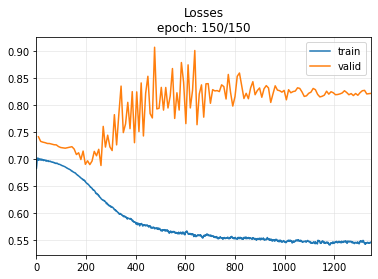

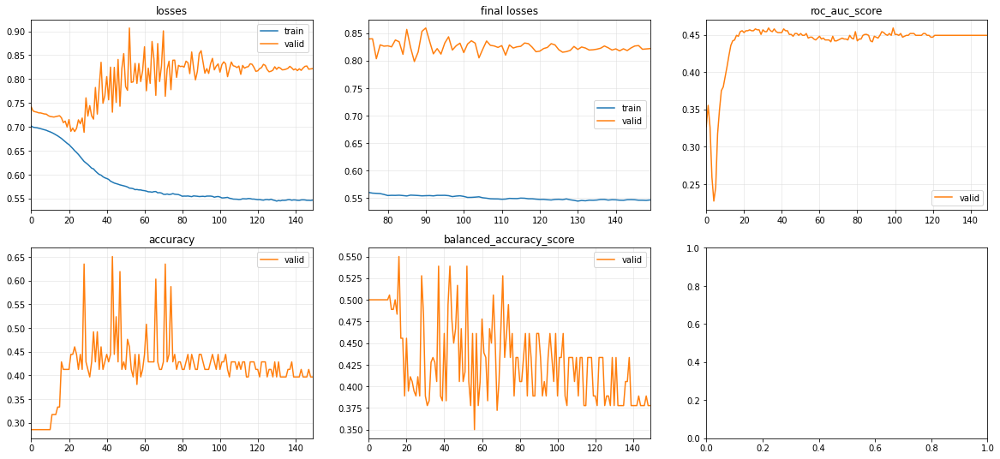


Elapsed time: 96.60770893096924


[I 2022-03-02 23:47:20,540] A new study created in memory with name: trial


epoch,train_loss,valid_loss,roc_auc_score,accuracy,balanced_accuracy_score,time
0,0.724702,0.908587,0.720370,0.294118,0.500000,00:03
1,0.723011,0.847260,0.757407,0.294118,0.500000,00:00
2,0.722418,0.826470,0.724074,0.294118,0.500000,00:00
3,0.718323,0.810891,0.655556,0.294118,0.500000,00:00
4,0.716768,0.801754,0.638889,0.294118,0.500000,00:00
5,0.715121,0.792477,0.637037,0.294118,0.500000,00:00
6,0.713485,0.782633,0.570370,0.294118,0.500000,00:00
7,0.710885,0.773357,0.575926,0.294118,0.500000,00:00
8,0.708108,0.767953,0.559259,0.294118,0.500000,00:00
9,0.705656,0.759341,0.561111,0.294118,0.500000,00:00



Elapsed time: 43.98602223396301


epoch,train_loss,valid_loss,roc_auc_score,accuracy,balanced_accuracy_score,time
0,0.702092,0.819033,0.664530,0.235294,0.500000,00:00
1,0.702156,0.776459,0.685897,0.235294,0.500000,00:00
2,0.701045,0.763943,0.643162,0.235294,0.500000,00:00
3,0.700499,0.757488,0.615385,0.254902,0.512821,00:00
4,0.699459,0.749901,0.641026,0.254902,0.512821,00:00
5,0.698308,0.743428,0.632479,0.254902,0.512821,00:00
6,0.696616,0.733866,0.645299,0.254902,0.512821,00:00
7,0.695056,0.722428,0.643162,0.274510,0.525641,00:00
8,0.693364,0.717519,0.638889,0.274510,0.525641,00:00
9,0.691548,0.709215,0.641026,0.313726,0.551282,00:00



Elapsed time: 39.11786103248596


epoch,train_loss,valid_loss,roc_auc_score,accuracy,balanced_accuracy_score,time
0,0.696733,0.679953,0.416667,0.764706,0.500000,00:00
1,0.695629,0.668523,0.692308,0.764706,0.500000,00:00
2,0.694310,0.666828,0.589744,0.764706,0.500000,00:00
3,0.693264,0.670529,0.547009,0.764706,0.500000,00:00
4,0.692251,0.674960,0.485043,0.764706,0.500000,00:00
5,0.690850,0.677443,0.463675,0.764706,0.500000,00:00
6,0.689307,0.678869,0.463675,0.725490,0.503205,00:00
7,0.687561,0.675628,0.455128,0.725490,0.503205,00:00
8,0.686043,0.673508,0.457265,0.627451,0.439103,00:00
9,0.684514,0.672774,0.459402,0.627451,0.467949,00:00



Elapsed time: 38.77137899398804


epoch,train_loss,valid_loss,roc_auc_score,accuracy,balanced_accuracy_score,time
0,0.711972,0.674447,0.210648,0.750000,0.500000,00:01
1,0.711030,0.652718,0.189815,0.750000,0.500000,00:00
2,0.707696,0.644803,0.219907,0.750000,0.500000,00:00
3,0.706191,0.643992,0.256944,0.750000,0.500000,00:00
4,0.704697,0.645431,0.280093,0.750000,0.500000,00:00
5,0.703062,0.648165,0.277778,0.750000,0.500000,00:00
6,0.700508,0.651330,0.296296,0.750000,0.500000,00:00
7,0.697976,0.655638,0.317130,0.750000,0.500000,00:00
8,0.694924,0.662319,0.324074,0.750000,0.500000,00:00
9,0.691906,0.669056,0.326389,0.750000,0.500000,00:00



Elapsed time: 39.39060854911804


epoch,train_loss,valid_loss,roc_auc_score,accuracy,balanced_accuracy_score,time
0,0.715675,0.792195,0.277778,0.250000,0.500000,00:00
1,0.718769,0.786739,0.219907,0.250000,0.500000,00:00
2,0.716762,0.797872,0.173611,0.250000,0.500000,00:00
3,0.715656,0.801475,0.189815,0.250000,0.500000,00:00
4,0.713256,0.799446,0.398148,0.250000,0.500000,00:00
5,0.712072,0.793141,0.518519,0.250000,0.500000,00:00
6,0.710006,0.784020,0.685185,0.250000,0.500000,00:00
7,0.707678,0.770896,0.798611,0.250000,0.500000,00:00
8,0.705919,0.755666,0.824074,0.250000,0.500000,00:00
9,0.703743,0.738143,0.833333,0.270833,0.513889,00:00



Elapsed time: 39.78967571258545


[I 2022-03-02 23:50:44,785] Trial 0 finished with value: 0.4901282051282051 and parameters: {'bs': 29, 'c1': 237, 'c2': 163, 'c3': 98, 'k1': 7, 'k2': 4, 'k3': 4}. Best is trial 0 with value: 0.4901282051282051.


epoch,train_loss,valid_loss,roc_auc_score,accuracy,balanced_accuracy_score,time
0,0.727145,0.644627,0.598148,0.705882,0.500000,00:02
1,0.724756,0.640715,0.725926,0.705882,0.500000,00:00
2,0.722371,0.638641,0.703704,0.705882,0.500000,00:00
3,0.719135,0.639840,0.646296,0.705882,0.500000,00:00
4,0.715911,0.644568,0.614815,0.705882,0.500000,00:00
5,0.712417,0.649961,0.620370,0.705882,0.500000,00:00
6,0.708987,0.655276,0.585185,0.705882,0.500000,00:00
7,0.705499,0.660180,0.575926,0.705882,0.500000,00:00
8,0.701952,0.663921,0.540741,0.705882,0.500000,00:00
9,0.698464,0.666128,0.503704,0.647059,0.458333,00:00



Elapsed time: 41.961671590805054


epoch,train_loss,valid_loss,roc_auc_score,accuracy,balanced_accuracy_score,time
0,0.732570,0.791058,0.363248,0.235294,0.500000,00:00
1,0.727736,0.782314,0.316239,0.235294,0.500000,00:00
2,0.725672,0.786874,0.279915,0.235294,0.500000,00:00
3,0.723867,0.790617,0.271368,0.235294,0.500000,00:00
4,0.721638,0.788402,0.292735,0.235294,0.500000,00:00
5,0.718404,0.777996,0.367521,0.235294,0.500000,00:00
6,0.714938,0.765138,0.459402,0.235294,0.500000,00:00
7,0.711690,0.748230,0.495726,0.235294,0.500000,00:00
8,0.708489,0.730559,0.483974,0.235294,0.500000,00:00
9,0.705207,0.719623,0.478632,0.235294,0.500000,00:00



Elapsed time: 37.449005126953125


epoch,train_loss,valid_loss,roc_auc_score,accuracy,balanced_accuracy_score,time
0,0.698738,0.657415,0.367521,0.764706,0.500000,00:00
1,0.697813,0.641490,0.615385,0.764706,0.500000,00:00
2,0.696903,0.639034,0.606838,0.764706,0.500000,00:00
3,0.695376,0.643575,0.594017,0.764706,0.500000,00:00
4,0.693271,0.652909,0.587607,0.764706,0.500000,00:00
5,0.691510,0.663826,0.551282,0.764706,0.500000,00:00
6,0.689530,0.666983,0.538462,0.745098,0.516026,00:00
7,0.687297,0.676007,0.525641,0.627451,0.496795,00:00
8,0.684991,0.674326,0.510684,0.627451,0.496795,00:00
9,0.682811,0.672653,0.508547,0.627451,0.496795,00:00



Elapsed time: 36.1534264087677


epoch,train_loss,valid_loss,roc_auc_score,accuracy,balanced_accuracy_score,time
0,0.696484,0.633558,0.682870,0.750000,0.500000,00:01
1,0.695313,0.658143,0.738426,0.750000,0.500000,00:00
2,0.694194,0.679903,0.553241,0.750000,0.500000,00:00
3,0.692822,0.698250,0.437500,0.333333,0.472222,00:00
4,0.691527,0.711675,0.446759,0.250000,0.500000,00:00
5,0.689777,0.719084,0.439815,0.250000,0.500000,00:00
6,0.687959,0.724366,0.446759,0.187500,0.375000,00:00
7,0.686050,0.735147,0.449074,0.208333,0.416667,00:00
8,0.683729,0.736203,0.453704,0.187500,0.375000,00:00
9,0.681416,0.737893,0.449074,0.187500,0.375000,00:00



Elapsed time: 42.7826189994812


epoch,train_loss,valid_loss,roc_auc_score,accuracy,balanced_accuracy_score,time
0,0.695647,0.645974,0.317130,0.750000,0.500000,00:00
1,0.694547,0.646396,0.340278,0.750000,0.500000,00:00
2,0.693584,0.653634,0.449074,0.750000,0.500000,00:00
3,0.692651,0.662207,0.560185,0.750000,0.500000,00:00
4,0.691666,0.667135,0.738426,0.750000,0.500000,00:00
5,0.690591,0.669690,0.826389,0.729167,0.736111,00:00
6,0.689524,0.669659,0.844907,0.541667,0.611111,00:00
7,0.688790,0.668522,0.844907,0.541667,0.611111,00:00
8,0.687635,0.669217,0.842593,0.500000,0.611111,00:00
9,0.686152,0.669974,0.835648,0.458333,0.583333,00:00



Elapsed time: 41.21828103065491


[I 2022-03-02 23:54:07,143] Trial 1 finished with value: 0.44811965811965815 and parameters: {'bs': 30, 'c1': 185, 'c2': 211, 'c3': 159, 'k1': 7, 'k2': 6, 'k3': 3}. Best is trial 0 with value: 0.4901282051282051.


epoch,train_loss,valid_loss,roc_auc_score,accuracy,balanced_accuracy_score,time
0,0.694714,0.648372,0.316667,0.705882,0.500000,00:02
1,0.694458,0.660555,0.350000,0.705882,0.500000,00:00
2,0.694077,0.664673,0.281481,0.705882,0.500000,00:00
3,0.693699,0.667813,0.301852,0.705882,0.500000,00:00
4,0.693264,0.673024,0.268519,0.705882,0.500000,00:00
5,0.692717,0.680924,0.155556,0.705882,0.500000,00:00
6,0.692129,0.690139,0.268519,0.686275,0.486111,00:00
7,0.691448,0.697778,0.431481,0.333333,0.469444,00:00
8,0.690660,0.703751,0.500000,0.294118,0.500000,00:00
9,0.689885,0.707666,0.503704,0.333333,0.527778,00:00



Elapsed time: 27.111207246780396


epoch,train_loss,valid_loss,roc_auc_score,accuracy,balanced_accuracy_score,time
0,0.701916,0.789090,0.608974,0.235294,0.500000,00:00
1,0.701531,0.766940,0.485043,0.235294,0.500000,00:00
2,0.701610,0.755099,0.480769,0.235294,0.500000,00:00
3,0.701116,0.745662,0.393162,0.235294,0.500000,00:00
4,0.700822,0.735249,0.350427,0.235294,0.500000,00:00
5,0.700078,0.726276,0.386752,0.235294,0.500000,00:00
6,0.699207,0.721702,0.502137,0.235294,0.500000,00:00
7,0.698032,0.720269,0.564103,0.254902,0.512821,00:00
8,0.696690,0.719070,0.527778,0.254902,0.512821,00:00
9,0.695311,0.721667,0.510684,0.254902,0.512821,00:00



Elapsed time: 24.498027086257935


epoch,train_loss,valid_loss,roc_auc_score,accuracy,balanced_accuracy_score,time
0,0.702787,0.756129,0.179487,0.235294,0.500000,00:00
1,0.704123,0.728325,0.175214,0.235294,0.500000,00:00
2,0.703849,0.719533,0.200855,0.235294,0.500000,00:00
3,0.702469,0.720356,0.232906,0.235294,0.500000,00:00
4,0.701607,0.722937,0.237179,0.235294,0.500000,00:00
5,0.700987,0.723309,0.181624,0.235294,0.500000,00:00
6,0.700325,0.721453,0.232906,0.235294,0.500000,00:00
7,0.699316,0.720329,0.373932,0.235294,0.500000,00:00
8,0.698041,0.720423,0.423077,0.235294,0.500000,00:00
9,0.696876,0.719707,0.429487,0.235294,0.500000,00:00



Elapsed time: 25.394288063049316


epoch,train_loss,valid_loss,roc_auc_score,accuracy,balanced_accuracy_score,time
0,0.704935,0.793391,0.192130,0.250000,0.500000,00:00
1,0.706209,0.758951,0.784722,0.250000,0.500000,00:00
2,0.707623,0.755678,0.840278,0.250000,0.500000,00:00
3,0.706386,0.760105,0.870370,0.250000,0.500000,00:00
4,0.705561,0.761137,0.884259,0.250000,0.500000,00:00
5,0.704648,0.760149,0.886574,0.250000,0.500000,00:00
6,0.703590,0.756089,0.881944,0.250000,0.500000,00:00
7,0.702081,0.752911,0.865741,0.250000,0.500000,00:00
8,0.701037,0.750802,0.743056,0.250000,0.500000,00:00
9,0.699859,0.747929,0.608796,0.250000,0.500000,00:00



Elapsed time: 26.113593101501465


epoch,train_loss,valid_loss,roc_auc_score,accuracy,balanced_accuracy_score,time
0,0.698834,0.727070,0.201389,0.250000,0.500000,00:00
1,0.698441,0.706731,0.560185,0.250000,0.500000,00:00
2,0.697644,0.699924,0.282407,0.250000,0.500000,00:00
3,0.697494,0.701698,0.187500,0.250000,0.500000,00:00
4,0.697175,0.706021,0.189815,0.250000,0.500000,00:00
5,0.696979,0.709154,0.243056,0.250000,0.500000,00:00
6,0.696693,0.713608,0.425926,0.250000,0.500000,00:00
7,0.696229,0.715077,0.854167,0.250000,0.500000,00:00
8,0.695799,0.716184,0.946759,0.270833,0.513889,00:00
9,0.695145,0.713575,0.895833,0.270833,0.513889,00:00



Elapsed time: 24.627964973449707


[I 2022-03-02 23:56:16,534] Trial 2 finished with value: 0.4806837606837607 and parameters: {'bs': 54, 'c1': 197, 'c2': 225, 'c3': 103, 'k1': 4, 'k2': 3, 'k3': 6}. Best is trial 0 with value: 0.4901282051282051.


epoch,train_loss,valid_loss,roc_auc_score,accuracy,balanced_accuracy_score,time
0,0.714073,0.775105,0.351852,0.294118,0.500000,00:01
1,0.713861,0.786710,0.387037,0.294118,0.500000,00:00
2,0.713758,0.800593,0.398148,0.294118,0.500000,00:00
3,0.713280,0.812022,0.446296,0.294118,0.500000,00:00
4,0.712346,0.816138,0.457407,0.294118,0.500000,00:00
5,0.712840,0.812718,0.437037,0.294118,0.500000,00:00
6,0.711217,0.803129,0.427778,0.294118,0.500000,00:00
7,0.710802,0.791972,0.427778,0.294118,0.500000,00:00
8,0.709732,0.779862,0.409259,0.294118,0.500000,00:00
9,0.709200,0.768045,0.396296,0.294118,0.500000,00:00



Elapsed time: 20.945934772491455


epoch,train_loss,valid_loss,roc_auc_score,accuracy,balanced_accuracy_score,time
0,0.695596,0.786164,0.508547,0.235294,0.500000,00:00
1,0.695538,0.731357,0.369658,0.235294,0.500000,00:00
2,0.695546,0.707839,0.388889,0.235294,0.500000,00:00
3,0.695528,0.696800,0.361111,0.470588,0.567308,00:00
4,0.695426,0.693601,0.350427,0.529412,0.375000,00:00
5,0.695115,0.694502,0.341880,0.509804,0.391026,00:00
6,0.694935,0.697344,0.352564,0.450980,0.381410,00:00
7,0.694585,0.700964,0.335470,0.372549,0.503205,00:00
8,0.694197,0.702979,0.352564,0.294118,0.451923,00:00
9,0.693718,0.702831,0.401709,0.313726,0.464744,00:00



Elapsed time: 21.17697548866272


epoch,train_loss,valid_loss,roc_auc_score,accuracy,balanced_accuracy_score,time
0,0.690815,0.657518,0.403846,0.764706,0.500000,00:00
1,0.690607,0.704362,0.365385,0.235294,0.500000,00:00
2,0.690547,0.740037,0.457265,0.235294,0.500000,00:00
3,0.690394,0.757764,0.602564,0.235294,0.500000,00:00
4,0.690202,0.761495,0.617521,0.235294,0.500000,00:00
5,0.689936,0.755891,0.591880,0.235294,0.500000,00:00
6,0.689565,0.745493,0.600427,0.235294,0.500000,00:00
7,0.689272,0.735162,0.589744,0.235294,0.500000,00:00
8,0.688829,0.727735,0.579060,0.235294,0.500000,00:00
9,0.688377,0.721377,0.566239,0.235294,0.500000,00:00



Elapsed time: 21.179476261138916


epoch,train_loss,valid_loss,roc_auc_score,accuracy,balanced_accuracy_score,time
0,0.699122,0.604790,0.453704,0.750000,0.500000,00:00
1,0.696557,0.633206,0.282407,0.750000,0.500000,00:00
2,0.695730,0.648707,0.273148,0.750000,0.500000,00:00
3,0.696629,0.657020,0.252315,0.750000,0.500000,00:00
4,0.696184,0.662860,0.245370,0.750000,0.500000,00:00
5,0.695664,0.667979,0.233796,0.750000,0.500000,00:00
6,0.695191,0.672755,0.236111,0.750000,0.500000,00:00
7,0.694374,0.677150,0.245370,0.750000,0.500000,00:00
8,0.693345,0.682505,0.226852,0.750000,0.500000,00:00
9,0.691670,0.688422,0.233796,0.645833,0.430556,00:00



Elapsed time: 22.015806436538696


epoch,train_loss,valid_loss,roc_auc_score,accuracy,balanced_accuracy_score,time
0,0.720012,0.843312,0.817130,0.250000,0.500000,00:00
1,0.721659,0.830617,0.863426,0.250000,0.500000,00:00
2,0.723645,0.831336,0.854167,0.250000,0.500000,00:00
3,0.723704,0.832095,0.708333,0.250000,0.500000,00:00
4,0.724914,0.830847,0.615741,0.250000,0.500000,00:00
5,0.725509,0.828364,0.625000,0.250000,0.500000,00:00
6,0.724812,0.823297,0.643519,0.250000,0.500000,00:00
7,0.724766,0.815127,0.680556,0.250000,0.500000,00:00
8,0.723033,0.805695,0.696759,0.250000,0.500000,00:00
9,0.721743,0.794979,0.703704,0.250000,0.500000,00:00



Elapsed time: 19.301018238067627


[I 2022-03-02 23:58:02,946] Trial 3 finished with value: 0.47623931623931626 and parameters: {'bs': 53, 'c1': 79, 'c2': 141, 'c3': 96, 'k1': 6, 'k2': 3, 'k3': 5}. Best is trial 0 with value: 0.4901282051282051.


epoch,train_loss,valid_loss,roc_auc_score,accuracy,balanced_accuracy_score,time
0,0.748477,0.793696,0.538889,0.294118,0.500000,00:00
1,0.742908,0.784073,0.451852,0.294118,0.500000,00:00
2,0.745391,0.794216,0.538889,0.294118,0.500000,00:00
3,0.742716,0.809967,0.605556,0.294118,0.500000,00:00
4,0.740726,0.815441,0.631481,0.294118,0.500000,00:00
5,0.739056,0.812046,0.600000,0.294118,0.500000,00:00
6,0.736960,0.804622,0.544444,0.294118,0.500000,00:00
7,0.733915,0.795073,0.500000,0.294118,0.500000,00:00
8,0.731125,0.782188,0.455556,0.294118,0.500000,00:00
9,0.728552,0.770762,0.485185,0.294118,0.500000,00:00



Elapsed time: 29.47703218460083


epoch,train_loss,valid_loss,roc_auc_score,accuracy,balanced_accuracy_score,time
0,0.705808,0.721493,0.568376,0.235294,0.500000,00:00
1,0.704513,0.727695,0.564103,0.235294,0.500000,00:00
2,0.704335,0.744038,0.598291,0.235294,0.500000,00:00
3,0.703597,0.753968,0.602564,0.235294,0.500000,00:00
4,0.702737,0.759342,0.632479,0.235294,0.500000,00:00
5,0.701304,0.757401,0.651709,0.254902,0.512821,00:00
6,0.699980,0.749863,0.634615,0.254902,0.512821,00:00
7,0.698870,0.738818,0.611111,0.254902,0.512821,00:00
8,0.697675,0.728451,0.611111,0.274510,0.525641,00:00
9,0.696399,0.716429,0.636752,0.313725,0.551282,00:00



Elapsed time: 29.13331389427185


epoch,train_loss,valid_loss,roc_auc_score,accuracy,balanced_accuracy_score,time
0,0.695701,0.634225,0.519231,0.764706,0.500000,00:00
1,0.696285,0.667445,0.598291,0.764706,0.500000,00:00
2,0.695933,0.687181,0.615385,0.764706,0.500000,00:00
3,0.695352,0.697141,0.694444,0.235294,0.500000,00:00
4,0.695020,0.702219,0.673077,0.235294,0.500000,00:00
5,0.694223,0.704778,0.641026,0.235294,0.500000,00:00
6,0.693142,0.704157,0.600427,0.235294,0.500000,00:00
7,0.691985,0.704093,0.598291,0.274510,0.496795,00:00
8,0.690718,0.703963,0.570513,0.294118,0.451923,00:00
9,0.689206,0.699275,0.551282,0.450980,0.554487,00:00



Elapsed time: 28.514023780822754


epoch,train_loss,valid_loss,roc_auc_score,accuracy,balanced_accuracy_score,time
0,0.693085,0.673057,0.266204,0.750000,0.500000,00:00
1,0.692303,0.690292,0.641204,0.750000,0.500000,00:00
2,0.691872,0.706163,0.379630,0.250000,0.500000,00:00
3,0.691415,0.717750,0.402778,0.250000,0.500000,00:00
4,0.690730,0.723868,0.363426,0.250000,0.500000,00:00
5,0.689922,0.725336,0.340278,0.250000,0.500000,00:00
6,0.689121,0.724180,0.314815,0.250000,0.500000,00:00
7,0.688154,0.721774,0.321759,0.229167,0.458333,00:00
8,0.687093,0.721278,0.331019,0.208333,0.388889,00:00
9,0.686275,0.724756,0.335648,0.208333,0.388889,00:00



Elapsed time: 29.363154888153076


epoch,train_loss,valid_loss,roc_auc_score,accuracy,balanced_accuracy_score,time
0,0.692680,0.740400,0.895833,0.250000,0.500000,00:00
1,0.692267,0.753858,0.925926,0.250000,0.500000,00:00
2,0.692252,0.751860,0.891204,0.250000,0.500000,00:00
3,0.692086,0.741942,0.831019,0.250000,0.500000,00:00
4,0.691747,0.730651,0.789352,0.270833,0.513889,00:00
5,0.691450,0.719749,0.787037,0.270833,0.513889,00:00
6,0.691164,0.711529,0.800926,0.291667,0.527778,00:00
7,0.690830,0.704968,0.833333,0.333333,0.555556,00:00
8,0.690304,0.701776,0.849537,0.354167,0.569444,00:00
9,0.689690,0.694575,0.854167,0.416667,0.611111,00:00



Elapsed time: 28.207369089126587


[I 2022-03-03 00:00:29,400] Trial 4 finished with value: 0.47235042735042737 and parameters: {'bs': 47, 'c1': 120, 'c2': 106, 'c3': 224, 'k1': 4, 'k2': 7, 'k3': 7}. Best is trial 0 with value: 0.4901282051282051.


epoch,train_loss,valid_loss,roc_auc_score,accuracy,balanced_accuracy_score,time
0,0.699703,0.680041,0.512963,0.705882,0.500000,00:01
1,0.698907,0.693358,0.392593,0.568627,0.441667,00:00
2,0.698420,0.711816,0.307407,0.294118,0.500000,00:00
3,0.697293,0.721415,0.309259,0.294118,0.500000,00:00
4,0.696382,0.724917,0.279630,0.294118,0.500000,00:00
5,0.695248,0.723457,0.261111,0.294118,0.500000,00:00
6,0.694029,0.721584,0.303704,0.294118,0.500000,00:00
7,0.692713,0.718778,0.362963,0.294118,0.500000,00:00
8,0.691400,0.720954,0.429630,0.294118,0.500000,00:00
9,0.689768,0.715179,0.440741,0.294118,0.500000,00:00



Elapsed time: 51.96881628036499


epoch,train_loss,valid_loss,roc_auc_score,accuracy,balanced_accuracy_score,time
0,0.696269,0.628905,0.324786,0.764706,0.500000,00:00
1,0.696876,0.655165,0.320513,0.764706,0.500000,00:00
2,0.695739,0.669248,0.446581,0.764706,0.500000,00:00
3,0.694539,0.674166,0.512821,0.764706,0.500000,00:00
4,0.692553,0.675268,0.576923,0.764706,0.500000,00:00
5,0.691112,0.674250,0.579060,0.627451,0.439103,00:00
6,0.689734,0.676412,0.583333,0.666667,0.666667,00:00
7,0.687433,0.677957,0.574786,0.509804,0.564103,00:00
8,0.685359,0.676204,0.598291,0.509804,0.564103,00:00
9,0.683682,0.676929,0.600427,0.509804,0.564103,00:00



Elapsed time: 47.64498281478882


epoch,train_loss,valid_loss,roc_auc_score,accuracy,balanced_accuracy_score,time
0,0.692775,0.737332,0.444444,0.235294,0.500000,00:00
1,0.691841,0.717104,0.559829,0.235294,0.500000,00:00
2,0.690754,0.703670,0.658120,0.235294,0.500000,00:00
3,0.689695,0.700013,0.561966,0.254902,0.455128,00:00
4,0.688538,0.702182,0.525641,0.274510,0.439103,00:00
5,0.687448,0.701321,0.508547,0.431373,0.541667,00:00
6,0.685928,0.701504,0.491453,0.450980,0.554487,00:00
7,0.684664,0.700061,0.472222,0.490196,0.522436,00:00
8,0.683126,0.693298,0.450855,0.490196,0.493590,00:00
9,0.681561,0.688963,0.446581,0.529412,0.490385,00:00



Elapsed time: 45.91016745567322


epoch,train_loss,valid_loss,roc_auc_score,accuracy,balanced_accuracy_score,time
0,0.702732,0.616464,0.844907,0.750000,0.500000,00:00
1,0.700585,0.628487,0.467593,0.750000,0.500000,00:00
2,0.698321,0.644273,0.546296,0.750000,0.500000,00:00
3,0.696145,0.657126,0.479167,0.750000,0.500000,00:00
4,0.693511,0.667330,0.456019,0.750000,0.500000,00:00
5,0.691113,0.674505,0.456019,0.750000,0.500000,00:00
6,0.688215,0.682653,0.451389,0.625000,0.416667,00:00
7,0.685217,0.692255,0.451389,0.479167,0.375000,00:00
8,0.682739,0.695019,0.444444,0.500000,0.416667,00:00
9,0.680098,0.700691,0.444444,0.520833,0.458333,00:00



Elapsed time: 49.228527545928955


epoch,train_loss,valid_loss,roc_auc_score,accuracy,balanced_accuracy_score,time
0,0.706434,0.755407,0.134259,0.250000,0.500000,00:00
1,0.704853,0.779189,0.201389,0.250000,0.500000,00:00
2,0.703784,0.767563,0.319444,0.250000,0.500000,00:00
3,0.702628,0.757113,0.439815,0.250000,0.500000,00:00
4,0.701075,0.748938,0.479167,0.250000,0.500000,00:00
5,0.699728,0.741234,0.516204,0.250000,0.500000,00:00
6,0.698176,0.731663,0.608796,0.250000,0.500000,00:00
7,0.696537,0.722969,0.692130,0.270833,0.513889,00:00
8,0.694908,0.720437,0.733796,0.270833,0.513889,00:00
9,0.693298,0.708992,0.782407,0.354167,0.569444,00:00



Elapsed time: 47.95656681060791


[I 2022-03-03 00:04:34,421] Trial 5 finished with value: 0.4601282051282052 and parameters: {'bs': 20, 'c1': 118, 'c2': 197, 'c3': 142, 'k1': 3, 'k2': 6, 'k3': 4}. Best is trial 0 with value: 0.4901282051282051.


epoch,train_loss,valid_loss,roc_auc_score,accuracy,balanced_accuracy_score,time
0,0.735545,0.793845,0.446296,0.294118,0.500000,00:00
1,0.738959,0.788708,0.444444,0.294118,0.500000,00:00
2,0.738720,0.793659,0.375926,0.294118,0.500000,00:00
3,0.735842,0.797087,0.392593,0.294118,0.500000,00:00
4,0.735299,0.799120,0.398148,0.294118,0.500000,00:00
5,0.730503,0.801922,0.414815,0.294118,0.500000,00:00
6,0.729504,0.805476,0.425926,0.294118,0.500000,00:00
7,0.729047,0.808729,0.442593,0.294118,0.500000,00:00
8,0.726198,0.810599,0.472222,0.294118,0.500000,00:00
9,0.724613,0.809834,0.462963,0.294118,0.500000,00:00


epoch,train_loss,valid_loss,roc_auc_score,accuracy,balanced_accuracy_score,time
0,0.735545,0.793845,0.446296,0.294118,0.500000,00:00
1,0.738959,0.788708,0.444444,0.294118,0.500000,00:00
2,0.738720,0.793659,0.375926,0.294118,0.500000,00:00
3,0.735842,0.797087,0.392593,0.294118,0.500000,00:00
4,0.735299,0.799120,0.398148,0.294118,0.500000,00:00
5,0.730503,0.801922,0.414815,0.294118,0.500000,00:00
6,0.729504,0.805476,0.425926,0.294118,0.500000,00:00
7,0.729047,0.808729,0.442593,0.294118,0.500000,00:00
8,0.726198,0.810599,0.472222,0.294118,0.500000,00:00
9,0.724613,0.809834,0.462963,0.294118,0.500000,00:00



Elapsed time: 19.744630813598633


epoch,train_loss,valid_loss,roc_auc_score,accuracy,balanced_accuracy_score,time
0,0.693166,0.727787,0.335470,0.235294,0.500000,00:00
1,0.694031,0.731902,0.427350,0.235294,0.500000,00:00
2,0.694278,0.739381,0.403846,0.235294,0.500000,00:00
3,0.694085,0.746751,0.378205,0.235294,0.500000,00:00
4,0.693475,0.748547,0.461538,0.235294,0.500000,00:00
5,0.693355,0.746162,0.491453,0.235294,0.500000,00:00
6,0.692769,0.741878,0.542735,0.254902,0.512821,00:00
7,0.692714,0.736365,0.564103,0.254902,0.512821,00:00
8,0.692265,0.730722,0.619658,0.254902,0.512821,00:00
9,0.691801,0.726711,0.613248,0.254902,0.512821,00:00



Elapsed time: 18.404324054718018


epoch,train_loss,valid_loss,roc_auc_score,accuracy,balanced_accuracy_score,time
0,0.723833,0.818364,0.876068,0.235294,0.500000,00:00
1,0.722453,0.800143,0.318376,0.235294,0.500000,00:00
2,0.722993,0.811199,0.237179,0.235294,0.500000,00:00
3,0.725289,0.823492,0.256410,0.235294,0.500000,00:00
4,0.722412,0.831649,0.232906,0.235294,0.500000,00:00
5,0.720313,0.832969,0.241453,0.235294,0.500000,00:00
6,0.718572,0.829507,0.316239,0.235294,0.500000,00:00
7,0.718723,0.822278,0.378205,0.235294,0.500000,00:00
8,0.718780,0.810993,0.344017,0.235294,0.500000,00:00
9,0.717444,0.799418,0.344017,0.235294,0.500000,00:00



Elapsed time: 20.61113691329956


epoch,train_loss,valid_loss,roc_auc_score,accuracy,balanced_accuracy_score,time
0,0.703168,0.706262,0.685185,0.250000,0.500000,00:00
1,0.701989,0.719735,0.363426,0.250000,0.500000,00:00
2,0.700943,0.731277,0.569444,0.250000,0.500000,00:00
3,0.699699,0.743714,0.650463,0.250000,0.500000,00:00
4,0.699713,0.754999,0.587963,0.250000,0.500000,00:00
5,0.699603,0.763749,0.493056,0.250000,0.500000,00:00
6,0.699736,0.769206,0.451389,0.250000,0.500000,00:00
7,0.699650,0.771977,0.414352,0.250000,0.500000,00:00
8,0.698950,0.773763,0.472222,0.250000,0.500000,00:00
9,0.697736,0.776088,0.405093,0.250000,0.500000,00:00


In [ ]:
kf = StratifiedKFold(n_splits=5, shuffle=False)

bs = 16
nvars = 1
seq_len = 125
c_out = 2
n_epochs = 150
bacc_per_fold = []
acc_per_fold = []
pre_per_fold = []
rec_per_fold = []
cm = []
hp = []

for train_index, test_index in kf.split(numero_sus, y_numero_sus):
    index_train_sus, index_test_sus = X.id.isin(numero_sus[train_index]), X.id.isin(numero_sus[test_index])
    X_train, y_train = X.loc[index_train_sus,cols], y[index_train_sus]
    X_test, y_test = X.loc[index_test_sus,cols], y[index_test_sus]
    
    study = optuna.create_study(study_name="trial", direction="maximize")
    study.optimize(lambda trial: objective(trial, X_train, y_train, numero_sus[train_index].values, y_numero_sus[train_index].values), n_trials=10)
    
    bs = study.best_params['bs']
    c1 = study.best_params['c1']
    c2 = study.best_params['c2']
    c3 = study.best_params['c3']
    k1 = study.best_params['k1']
    k2 = study.best_params['k2']
    k3 = study.best_params['k3']
    hp.append(study.best_params)
    rus = SMOTE(random_state=42)
    X_train, y_train = rus.fit_resample(X_train, y_train)
    
    tfms  = [None, [Categorize()]]
    X_3d_new, y_new, splits = combine_split_data([to3d(X_train),to3d(X_test)],[y_train,y_test])
    dsets = TSDatasets(X_3d_new, y_new.astype(int), tfms=tfms, splits=splits, inplace=True)
    dsets = TSDataLoaders.from_dsets(dsets.train, dsets.valid, bs=bs, batch_tfms=TSStandardize())
  
    model =  FCN(nvars, c_out, [c1,c2,c3],[k1,k2,k3])
    learn = Learner(dsets, model, loss_func=LabelSmoothingCrossEntropyFlat(), metrics=[RocAucBinary(), accuracy, BalancedAccuracy()],  cbs=ShowGraphCallback2())
    start = time.time()
    learn.fit_one_cycle(n_epochs, lr_max=1e-4)
    print('\nElapsed time:', time.time() - start)

    X_test = X_3d_new[splits[1]]
    y_test = y_new[splits[1]]

    test_probas, test_targets, test_preds = learn.get_X_preds(X_test, with_decoded=True)
    pred = [int(char) for char in test_preds if char == '1' or char == '0']

    cm.append(confusion_matrix(y_test, pred))
    bacc_per_fold.append(balanced_accuracy_score(y_test, pred))
    acc_per_fold.append(accuracy_score(y_test, pred))
    pre_per_fold.append(precision_score(y_test, pred))
    rec_per_fold.append(recall_score(y_test, pred))

print("bacc: {} +- {}, acc: {} +- {}, pr: {} +- {}, rec: {} +- {}".format(np.mean(bacc_per_fold), np.std(bacc_per_fold),np.mean(acc_per_fold), np.std(acc_per_fold),
                                                              np.mean(pre_per_fold), np.std(pre_per_fold),
                                                              np.mean(rec_per_fold), np.std(rec_per_fold)))

In [ ]:
print('list cm: {} \n cm: {}'.format(cm, sum(cm)))
print('hiperparametros: {}'.format(hp))
print("bacc: {}, acc: {}, pr: {}, rec: {}".format(bacc_per_fold,acc_per_fold,pre_per_fold,rec_per_fold))